## Contents:
    - 1. Import Data
    - 2. Missing values
    - 3. Feature Engineering
    - 4. Explorary Data Analysis

In [1]:
import numpy as np
import pandas as pd

from numpy import mean, std, cov, sqrt, log, sum

from datetime import date, timedelta, datetime

from scipy.stats import pearsonr,spearmanr, boxcox
from scipy import stats

from random import sample

from apyori import apriori
from mlxtend.frequent_patterns import apriori

from matplotlib import rcParams
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import seaborn as sns
from matplotlib_venn import venn2
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D

import matplotlib.style as style

from pmdarima.arima.utils import ndiffs
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

from statsmodels.tsa.stattools import acf, pacf
import statsmodels.api as sm

from statsmodels.formula.api import ols


import warnings
warnings.filterwarnings('ignore')

import scripts as src

from IPython.display import HTML, display

# style.use('fivethirtyeight')

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)
pd.set_option('display.width', 1000)

rcParams['figure.figsize'] = (6, 3)

<h1 style="background-color:powderblue;">1. Import Data</h1>


In [2]:
raw_beneficiary=pd.read_csv('data/Train_Beneficiarydata-1542865627584.csv')
raw_inpatient=pd.read_csv('data/Train_Inpatientdata-1542865627584.csv')
raw_outpatient=pd.read_csv('data/Train_Outpatientdata-1542865627584.csv')
raw_train=pd.read_csv('data/Train-1542865627584.csv')

In [3]:
inpatient_beneficiary=pd.merge(raw_inpatient,raw_beneficiary,on='BeneID')
outpatient_beneficiary=pd.merge(raw_outpatient,raw_beneficiary,on='BeneID')

outpatient_beneficiary['Category']='Outpatient'
inpatient_beneficiary['Category']='Inpatient'

train=pd.concat([outpatient_beneficiary, inpatient_beneficiary], axis = 0)
train=pd.merge(train,raw_train,on='Provider', how='left')

<h1 style="background-color:powderblue;">4. Explorary Data Analysis</h1>

<h1 style="color:tomato;
           background-color: #FFFF00; 
           padding: 1px;" >Resources from Insurance Company </h1>

In [97]:
resources=train[['BeneID', 'ClaimID', 'Provider', 'InscClaimAmtReimbursed', 'DeductibleAmtPaid',
     'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
     'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt', 
     'Category','PotentialFraud','Age_group']]

resources['AnnualReimbursementAmt']=resources['IPAnnualReimbursementAmt'] + resources['OPAnnualReimbursementAmt']
resources['AnnualDeductibleAmt']=resources['IPAnnualDeductibleAmt'] + resources['OPAnnualDeductibleAmt']

resources_melt= pd.melt(resources, 
        id_vars=['BeneID','ClaimID', 'Provider','PotentialFraud','Category'], 
        value_vars=resources[['InscClaimAmtReimbursed', 'DeductibleAmtPaid', 
                        'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
                        'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt',
                        'AnnualReimbursementAmt','AnnualDeductibleAmt']], 
        var_name='Type', 
        value_name='Amount')

#### correlations

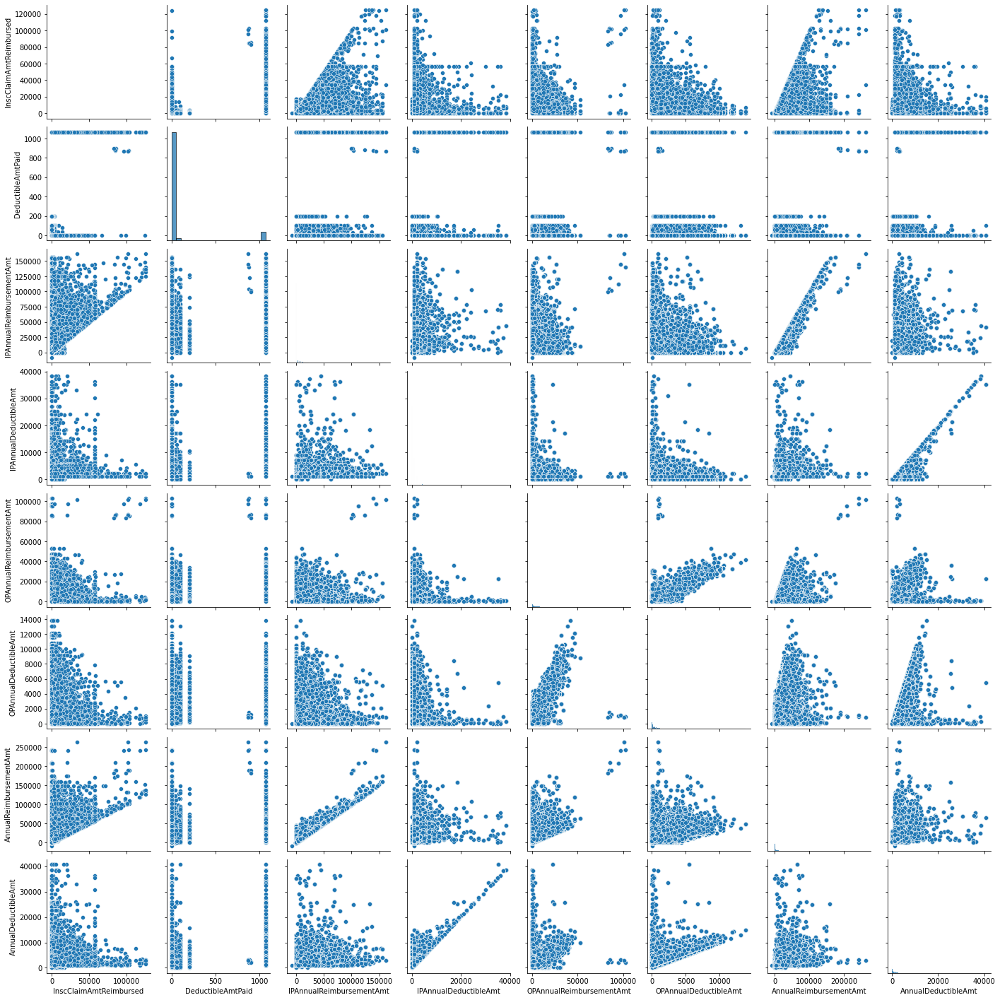

In [98]:
df=resources[['InscClaimAmtReimbursed', 'DeductibleAmtPaid',
     'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
     'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt',
     'AnnualReimbursementAmt','AnnualDeductibleAmt']]
sns.pairplot(df)
plt.show()

In [99]:
df=resources[['InscClaimAmtReimbursed', 'DeductibleAmtPaid',
     'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt',
     'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt',
     'AnnualReimbursementAmt','AnnualDeductibleAmt']]

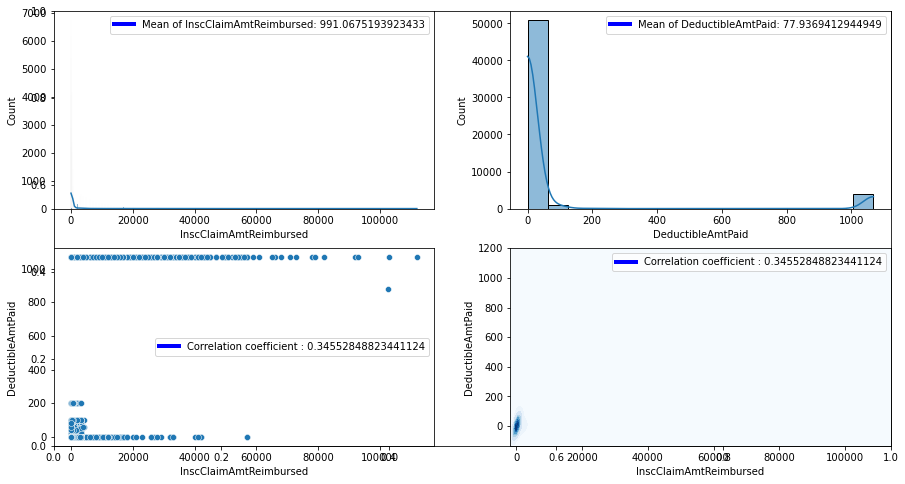

In [100]:
bi_plot_numeric(df, 'InscClaimAmtReimbursed', 'DeductibleAmtPaid', sample=0.1)

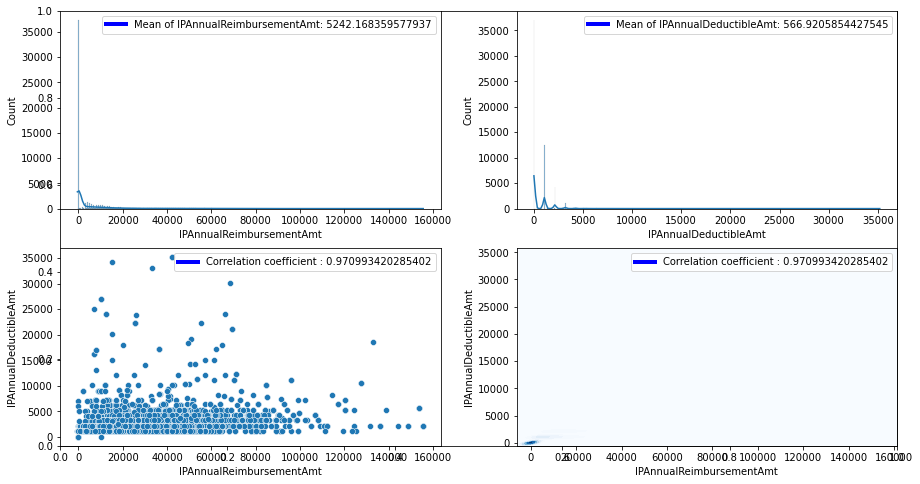

In [101]:
bi_plot_numeric(df, 'IPAnnualReimbursementAmt', 'IPAnnualDeductibleAmt', sample=0.1)

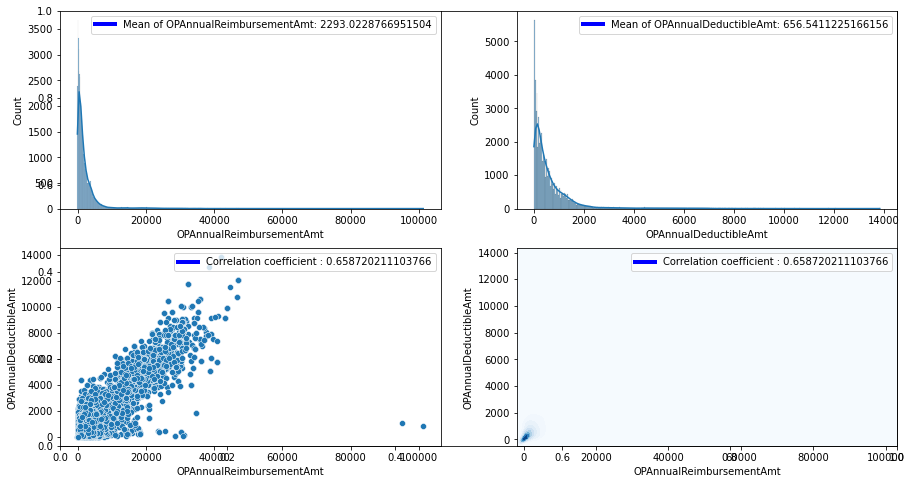

In [102]:
bi_plot_numeric(df, 'OPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt', sample=0.1)

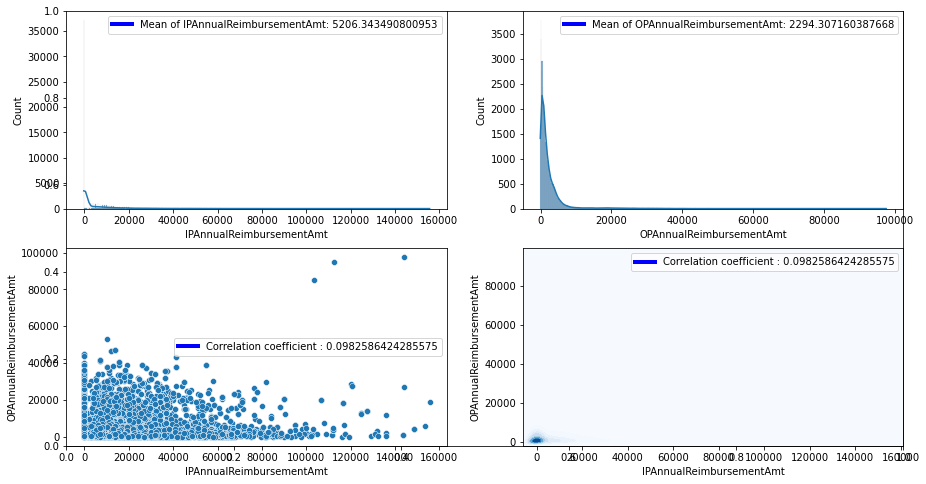

In [103]:
bi_plot_numeric(df, 'IPAnnualReimbursementAmt', 'OPAnnualReimbursementAmt', sample=0.1)

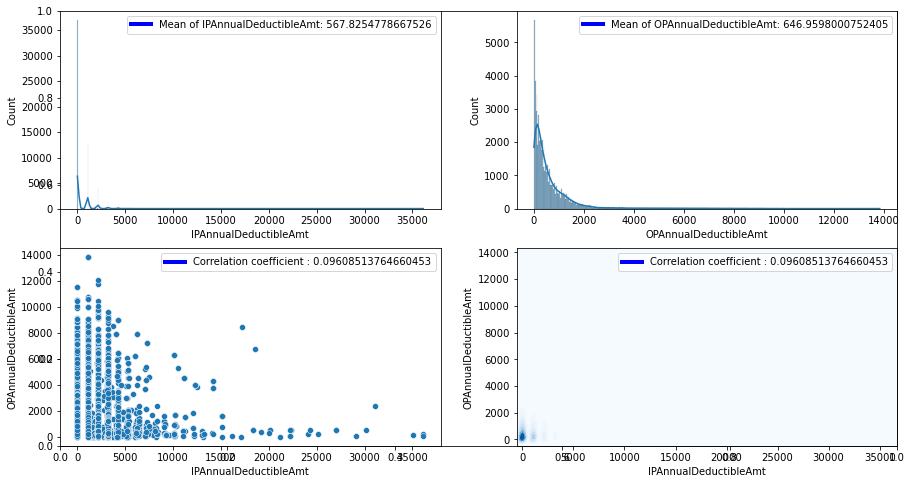

In [104]:
bi_plot_numeric(df, 'IPAnnualDeductibleAmt', 'OPAnnualDeductibleAmt', sample=0.1)

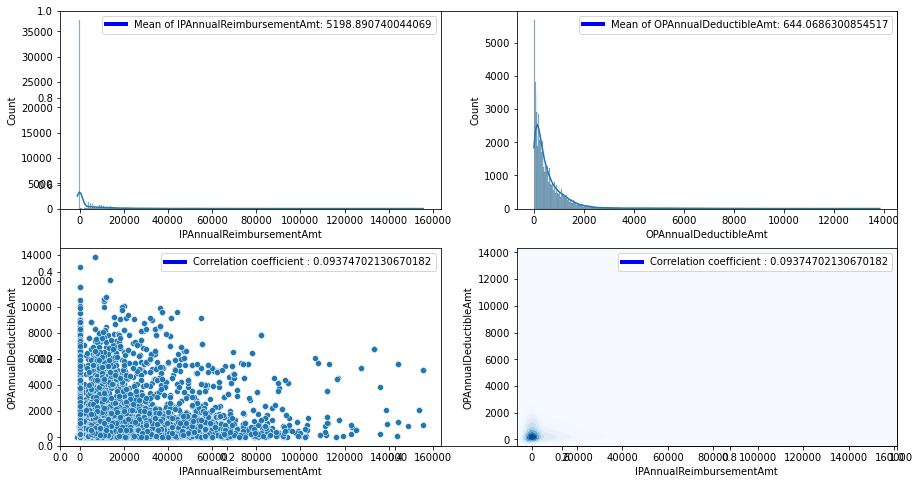

In [105]:
bi_plot_numeric(df, 'IPAnnualReimbursementAmt', 'OPAnnualDeductibleAmt', sample=0.1)

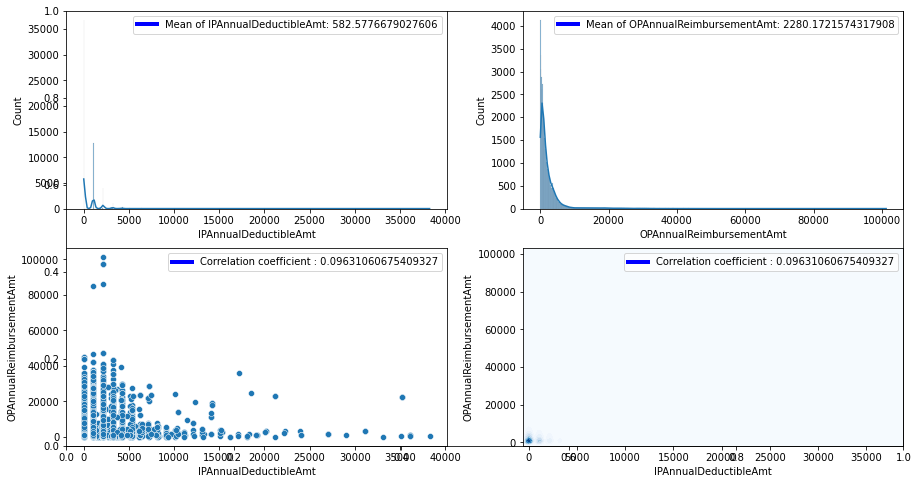

In [106]:
bi_plot_numeric(df, 'IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt', sample=0.1)

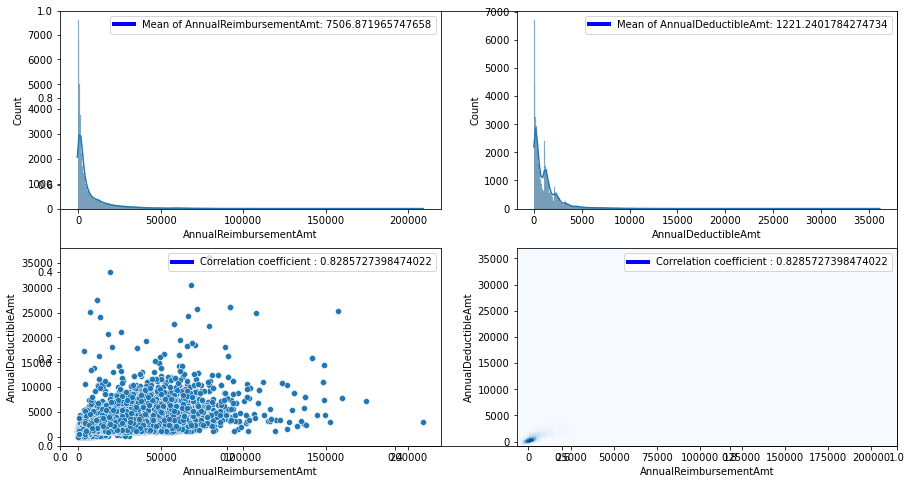

In [107]:
bi_plot_numeric(df, 'AnnualReimbursementAmt', 'AnnualDeductibleAmt', sample=0.1)

In [108]:
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r', 'BrBG_r', & PuOr_r are other good diverging colormaps

,InscClaimAmtReimbursed,DeductibleAmtPaid,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,AnnualReimbursementAmt,AnnualDeductibleAmt
InscClaimAmtReimbursed,1.000000,0.653998,0.383701,0.225477,0.064411,0.030561,0.365653,0.179834
DeductibleAmtPaid,0.653998,1.000000,0.279251,0.307332,-0.027977,-0.033833,0.243853,0.199241
IPAnnualReimbursementAmt,0.383701,0.279251,1.000000,0.642743,0.178841,0.163073,0.956228,0.558795
IPAnnualDeductibleAmt,0.225477,0.307332,0.642743,1.000000,0.138267,0.137045,0.621544,0.798485
OPAnnualReimbursementAmt,0.064411,-0.027977,0.178841,0.138267,1.000000,0.837335,0.458918,0.607778
OPAnnualDeductibleAmt,0.030561,-0.033833,0.163073,0.137045,0.837335,1.000000,0.396299,0.705763
AnnualReimbursementAmt,0.365653,0.243853,0.956228,0.621544,0.458918,0.396299,1.000000,0.685377
AnnualDeductibleAmt,0.179834,0.199241,0.558795,0.798485,0.607778,0.705763,0.685377,1.000000


<div class="alert-warning">
    <b>Findings </b> 
    <li> <font color='red'>InscClaimAmtReimbursed and DeductibleAmtPaid are highly positively correlated. </font> </li>
    <li> <font color='red'>IPAnnualReimbursementAmt and IPAnnualDeductibleAmt are highly positively correlated. </font> </li>
    <li> <font color='red'>IPAnnualReimbursementAmt and AnnualReimbursementAmt are highly positively correlated. </font> </li>
    <li> <font color='red'>IPAnnualDeductibleAmt and AnnualReimbursementAmt are highly positively correlated. </font> </li>
    <li> <font color='red'>IPAnnualDeductibleAmt and AnnualDeductibleAmt are highly positively correlated. </font> </li>
    <li> <font color='red'>OPAnnualReimbursementAmt and OPAnnualDeductibleAmt are highly positively correlated. </font> </li>
    <li> <font color='red'>OPAnnualReimbursementAmt and AnnualDeductibleAmt are highly positively correlated. </font> </li> 
    <li> <font color='red'>OPAnnualDeductibleAmt and AnnualDeductibleAmt are highly positively correlated. </font> </li>
    <li> <font color='red'>AnnualReimbursementAmt and AnnualDeductibleAmt are highly positively correlated. </font> </li>  
    <li> <font color='blue'>Inpatient Annual Reimbursement Amount and Deductible Amount are highly correlated. </font> </li>
    <li> <font color='blue'>Outpatient Annual Reimbursement Amount and Deductible Amount are highly correlated. </font> </li>
    <li> <font color='blue'>Inpatient resources and Outpatient resources are just slightly correlated. </font> </li>    
    <li> <font color='blue'>Total Annual Reimbursement or Deductible Amounts are correlated with their Inpatient and Outpatient Amounts, because they are sum of those amounts. </font> </li>
</div>

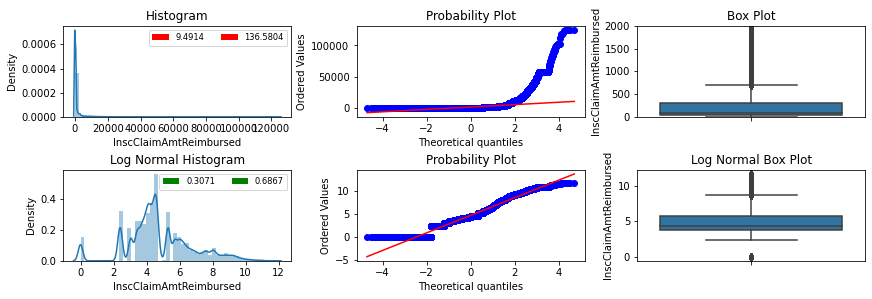

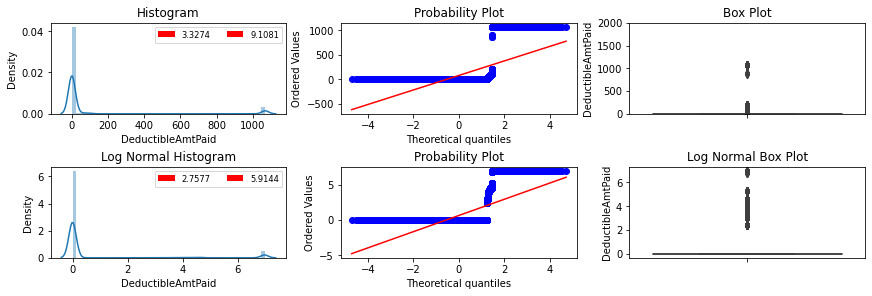

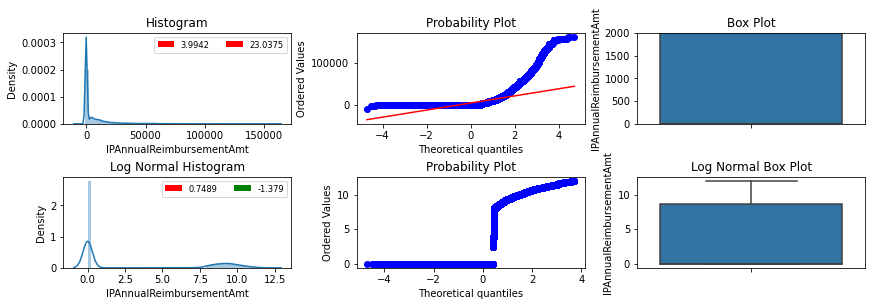

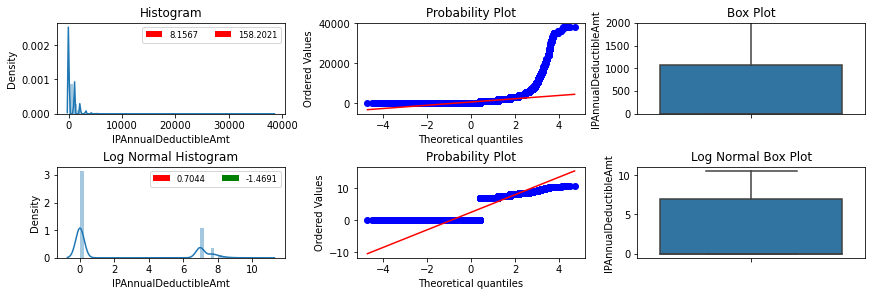

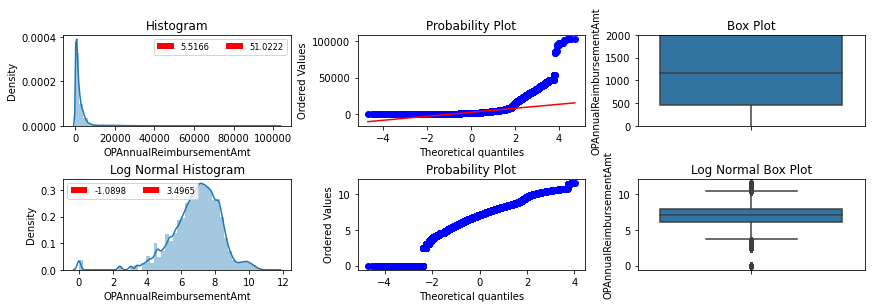

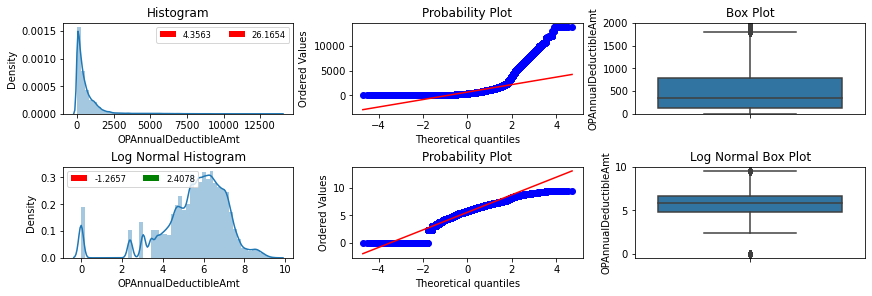

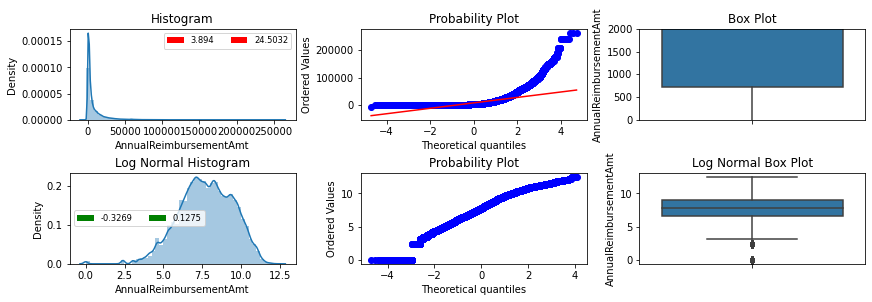

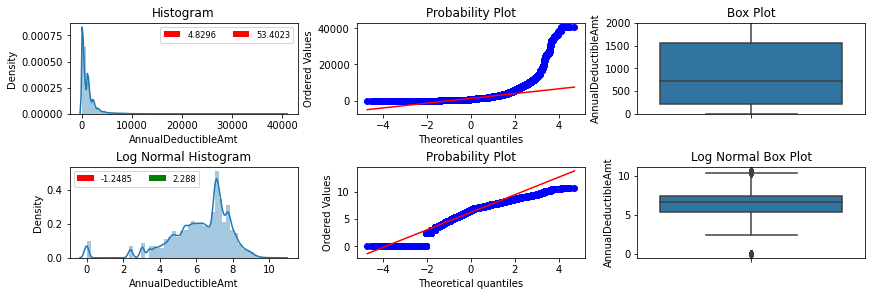

In [109]:
plotting_3_chart(resources, 'InscClaimAmtReimbursed')
plotting_3_chart(resources, 'DeductibleAmtPaid')
plotting_3_chart(resources, 'IPAnnualReimbursementAmt')
plotting_3_chart(resources, 'IPAnnualDeductibleAmt')
plotting_3_chart(resources, 'OPAnnualReimbursementAmt')
plotting_3_chart(resources, 'OPAnnualDeductibleAmt')
plotting_3_chart(resources, 'AnnualReimbursementAmt')
plotting_3_chart(resources, 'AnnualDeductibleAmt')

In [110]:
resources.describe()

,InscClaimAmtReimbursed,DeductibleAmtPaid,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,AnnualReimbursementAmt,AnnualDeductibleAmt
count,558211.000000,558211.000000,558211.000000,558211.000000,558211.000000,558211.000000,558211.000000,558211.000000
mean,997.012133,78.294788,5227.971466,568.756807,2278.225348,649.698745,7506.196814,1218.455552
std,3821.534891,273.814128,11786.274732,1179.172616,3881.846386,1002.020811,13051.813649,1648.740649
min,0.000000,0.000000,-8000.000000,0.000000,-70.000000,0.000000,-8000.000000,0.000000
25%,40.000000,0.000000,0.000000,0.000000,460.000000,120.000000,710.000000,210.000000
50%,80.000000,0.000000,0.000000,0.000000,1170.000000,340.000000,2320.000000,730.000000
75%,300.000000,0.000000,6000.000000,1068.000000,2590.000000,790.000000,8420.000000,1550.000000
max,125000.000000,1068.000000,161470.000000,38272.000000,102960.000000,13840.000000,262720.000000,40694.000000


IPAnnualReimbursementAmt counts for negative values:  57
OPAnnualReimbursementAmt counts for negative values:  16


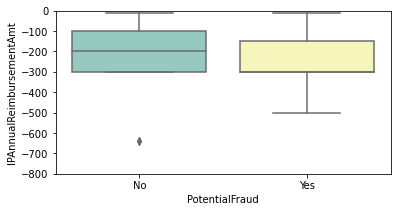

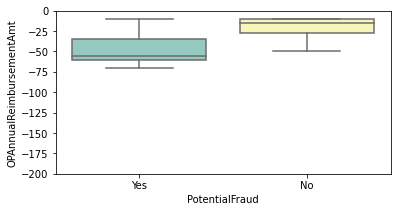

In [111]:
print('IPAnnualReimbursementAmt counts for negative values: ', 
      resources[resources['IPAnnualReimbursementAmt']<0].count().max())

print('OPAnnualReimbursementAmt counts for negative values: ', 
      resources[resources['OPAnnualReimbursementAmt']<0].count().max())
      
df=resources[resources['IPAnnualReimbursementAmt']<0]
sns.boxplot( x='PotentialFraud', y='IPAnnualReimbursementAmt', palette="Set3", data=df)
plt.ylim([-800,0])
plt.show()

df=resources[resources['OPAnnualReimbursementAmt']<0]
sns.boxplot(x='PotentialFraud', y='OPAnnualReimbursementAmt', palette="Set3", data=df)
plt.ylim([-200,0])
plt.show()

<div class="alert-warning">
    <b>Findings </b> 
    <li> <font color='red'>57 records in train data set have negative IPAnnualReimbursementAmt. </font> </li>
    <li> <font color='red'>16 records in train data set have negative OPAnnualReimbursementAmt .</font> </li>
    <li> <font color='red'>So I will not use box-cox transformation on these columns in case to lose information of those patients.</font> </li>
</div>

#### The impact of resources on Potential Fraud

(-100.0, 10000.0)

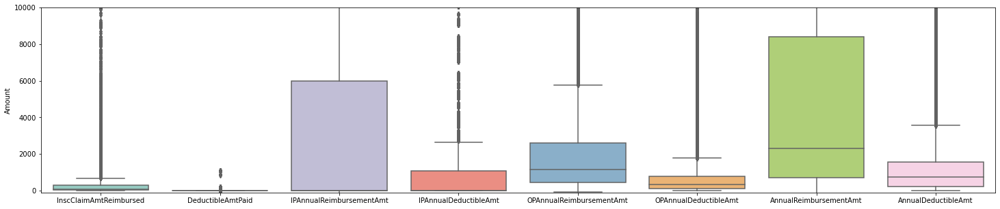

In [112]:
fig = plt.figure(figsize=(25,5))
sns.boxplot(x='Type', y='Amount', palette="Set3", data=resources_melt)
plt.xlabel("")
plt.ylabel('Amount')
plt.ylim(-100,10000)

(-100.0, 10000.0)

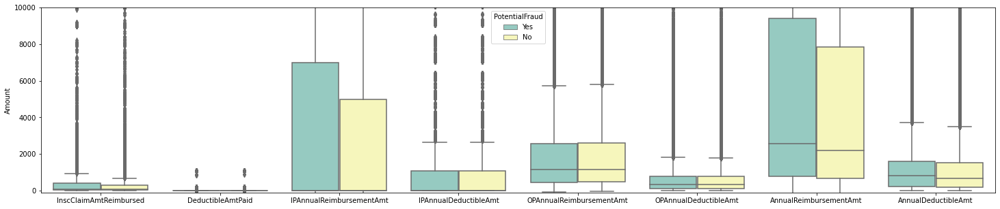

In [113]:
fig = plt.figure(figsize=(25,5))
sns.boxplot(x='Type', y='Amount', palette="Set3", hue='PotentialFraud', data=resources_melt)
plt.xlabel("")
plt.ylabel('Amount')
plt.ylim(-100,10000)

<div class="alert-warning">
    <b>Findings </b> 
    <li> <font color='red'>The Inpatient Annual Reimbursement Amount and Total Annual Reimbursement Amount for potential fraud claims are highly than that for non-potential fraud claims. </font> </li>
    <li> <font color='red'>If the patient has a high annual reimbursement amount,especially for inpatient services, the insurance company should take more attentions. </font> </li>
</div>

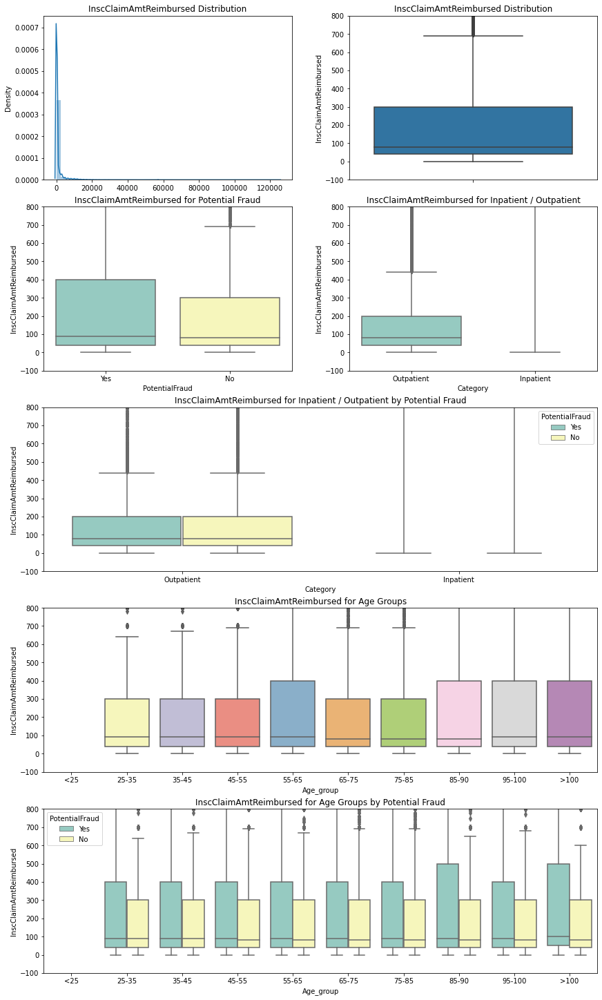

-----------------------------------------------------
The statistics of InscClaimAmtReimbursed: 
-----------------------------------------------------


count    558211.000000
mean        997.012133
std        3821.534891
min           0.000000
25%          40.000000
50%          80.000000
75%         300.000000
max      125000.000000
Name: InscClaimAmtReimbursed, dtype: float64

-----------------------------------------------------
The correlations of InscClaimAmtReimbursed and other resources: 
-----------------------------------------------------


,InscClaimAmtReimbursed
InscClaimAmtReimbursed,1.000000
DeductibleAmtPaid,0.427713
IPAnnualReimbursementAmt,0.147226
AnnualReimbursementAmt,0.133702
IPAnnualDeductibleAmt,0.050840
AnnualDeductibleAmt,0.032340
OPAnnualReimbursementAmt,0.004149
OPAnnualDeductibleAmt,0.000934


-----------------------------------------------------
The P value for InscClaimAmtReimbursed between PotentialFraud (Yes/No)
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(PotentialFraud),5.297663e+10,1.0,3651.231438,0.0
Residual,8.099194e+12,558209.0,NaN,NaN


-----------------------------------------------------
The P value for InscClaimAmtReimbursed between Inpatient / Outpatient
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Category),3.606421e+12,1.0,442861.246201,0.0
Residual,4.545750e+12,558209.0,NaN,NaN


-----------------------------------------------------
The P value for InscClaimAmtReimbursed among Age Groups
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Age_group),4.938376e+06,9.0,0.037574,0.846301
Residual,8.151646e+12,558201.0,NaN,NaN


-----------------------------------------------------
The P value for InscClaimAmtReimbursed among Age Groups
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,65-75,85-90,93.124994,36.129134,150.120854,7.167120,0.001000
1,65-75,25-35,42.985796,-96.632921,182.604513,1.350526,0.900000
2,65-75,75-85,36.830520,-2.183957,75.844997,4.140986,0.082476
3,65-75,95-100,57.820542,-9.857221,125.498304,3.747640,0.166375
4,65-75,45-55,8.685045,-64.972129,82.342219,0.517224,0.900000
5,65-75,55-65,41.823463,-22.000952,105.647878,2.874451,0.517297
6,65-75,35-45,33.469250,-69.028715,135.967214,1.432361,0.900000
7,65-75,>100,62.956849,-193.632949,319.546648,1.076280,0.900000
8,85-90,25-35,136.110791,-9.958909,282.180490,4.087466,0.090697
9,85-90,75-85,56.294474,-1.715012,114.303960,4.256851,0.065542


-----------------------------------------------------
The P value for InscClaimAmtReimbursed among different Age Groups and Potential Fraud (Yes/No)
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, 65-75)","(Yes, 85-90)",133.495498,30.549791,236.441204,6.398215,0.001000
1,"(Yes, 65-75)","(Yes, 25-35)",116.369773,-141.497326,374.236871,2.226613,0.900000
2,"(Yes, 65-75)","(Yes, 75-85)",32.539244,-38.333193,103.411680,2.265325,0.900000
3,"(Yes, 65-75)","(Yes, 95-100)",47.975524,-73.059576,169.010623,1.955730,0.900000
4,"(Yes, 65-75)","(Yes, 45-55)",14.756334,-119.804177,149.316845,0.541080,0.900000
5,"(Yes, 65-75)","(Yes, 55-65)",48.055073,-69.122723,165.232870,2.023459,0.900000
6,"(Yes, 65-75)","(Yes, 35-45)",22.905613,-162.843490,208.654715,0.608437,0.900000
7,"(Yes, 65-75)","(Yes, >100)",122.406481,-355.252034,600.064997,1.264408,0.900000
8,"(Yes, 65-75)","(No, 65-75)",628.558939,567.334805,689.783074,50.655169,0.001000
9,"(Yes, 65-75)","(No, 85-90)",567.468776,480.632123,654.305428,32.243287,0.001000


-----------------------------------------------------
The P value for InscClaimAmtReimbursed among different Age Groups and Inpatient / Outpatient claims
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, Outpatient)","(Yes, Inpatient)",10023.400650,9972.604087,10074.197213,716.908651,0.001
1,"(Yes, Outpatient)","(No, Outpatient)",1.353051,-19.799844,22.505945,0.232395,0.900
2,"(Yes, Outpatient)","(No, Inpatient)",9495.404932,9436.823342,9553.986523,588.891645,0.001
3,"(Yes, Inpatient)","(No, Outpatient)",10024.753701,9975.153231,10074.354171,734.295689,0.001
4,"(Yes, Inpatient)","(No, Inpatient)",527.995718,454.208426,601.783010,25.997518,0.001
5,"(No, Outpatient)","(No, Inpatient)",9496.757983,9439.210450,9554.305516,599.558717,0.001


In [109]:
resources_plot(resources, 'InscClaimAmtReimbursed', xtop=-100, ytop=800)

<div class="alert-warning">
    <b>Findings </b> 
    <li> <font color='red'>The InscClaimAmtReimbursed are similar for different age groups</font> </li>
    <li> <font color='red'>The InscClaimAmtReimbursed are for age group 55-65 and over 85 have sig difference from other age groups(alpha=0.1)</font> </li>
    <li> <font color='red'>The InscClaimAmtReimbursed are significantly higher for outpatient claims than that for inpatient claims. </font> </li>
    <li> <font color='red'>The InscClaimAmtReimbursed for potential fraud claims are significantly higher than that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>The InscClaimAmtReimbursed for potential fraud claims are significantly higher than that for non-potential fraud claims within Inpatient and Outpatient groups.</font> </li>
</div>

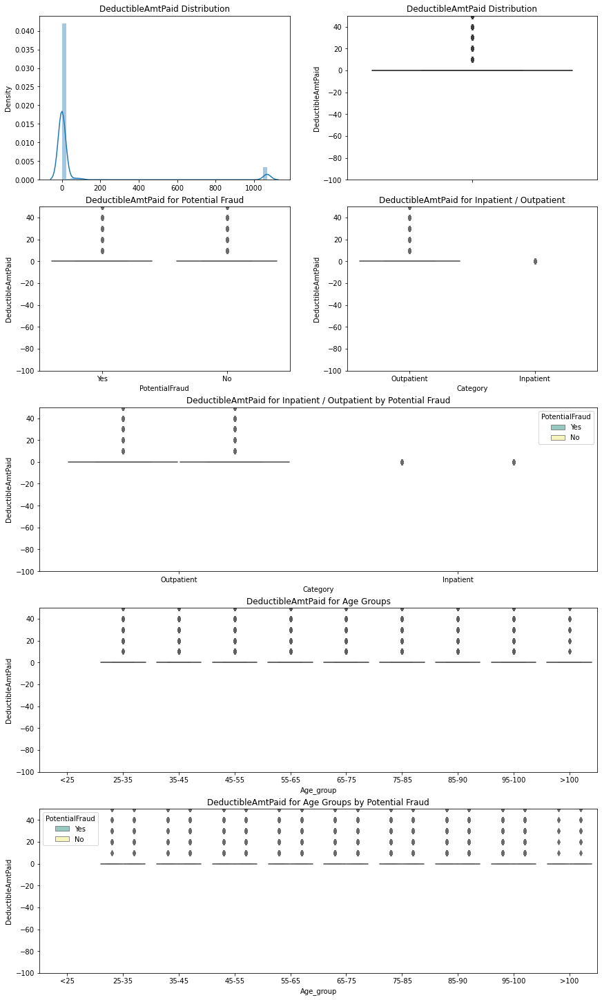

-----------------------------------------------------
The statistics of DeductibleAmtPaid: 
-----------------------------------------------------


count    558211.000000
mean         78.294788
std         273.814128
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        1068.000000
Name: DeductibleAmtPaid, dtype: float64

-----------------------------------------------------
The correlations of DeductibleAmtPaid and other resources: 
-----------------------------------------------------


,DeductibleAmtPaid
DeductibleAmtPaid,1.000000
InscClaimAmtReimbursed,0.427713
IPAnnualDeductibleAmt,0.094453
IPAnnualReimbursementAmt,0.077981
AnnualReimbursementAmt,0.059464
AnnualDeductibleAmt,0.039697
OPAnnualDeductibleAmt,0.001145
OPAnnualReimbursementAmt,0.000783


-----------------------------------------------------
The P value for DeductibleAmtPaid between PotentialFraud (Yes/No)
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(PotentialFraud),5.251285e+08,1.0,7093.113027,0.0
Residual,4.132621e+10,558209.0,NaN,NaN


-----------------------------------------------------
The P value for DeductibleAmtPaid between Inpatient / Outpatient
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Category),4.071967e+10,1.0,2.008561e+07,0.0
Residual,1.131661e+09,558209.0,NaN,NaN


-----------------------------------------------------
The P value for DeductibleAmtPaid among Age Groups
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Age_group),3.865122e+04,9.0,0.05729,0.810832
Residual,4.184412e+10,558201.0,NaN,NaN


-----------------------------------------------------
The P value for DeductibleAmtPaid among Age Groups
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,65-75,85-90,11.045829,6.962279,15.129379,11.865394,0.001000
1,65-75,25-35,1.719413,-8.283770,11.722596,0.753987,0.900000
2,65-75,75-85,4.104546,1.309298,6.899794,6.441196,0.001000
3,65-75,95-100,9.421514,4.572644,14.270384,8.523185,0.001000
4,65-75,45-55,2.782062,-2.495212,8.059336,2.312485,0.758426
5,65-75,55-65,5.090833,0.518042,9.663625,4.883478,0.016210
6,65-75,35-45,4.337736,-3.005878,11.681349,2.591045,0.638900
7,65-75,>100,12.008480,-6.375263,30.392224,2.865338,0.521207
8,85-90,25-35,9.326415,-1.138957,19.791788,3.909145,0.125600
9,85-90,75-85,6.941283,2.785110,11.097455,7.326017,0.001000


-----------------------------------------------------
The P value for DeductibleAmtPaid among different Age Groups and Potential Fraud (Yes/No)
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, 65-75)","(Yes, 85-90)",15.475989,8.122761,22.829218,10.384385,0.001000
1,"(Yes, 65-75)","(Yes, 25-35)",5.394058,-13.024929,23.813046,1.444942,0.900000
2,"(Yes, 65-75)","(Yes, 75-85)",5.492107,0.429816,10.554399,5.352939,0.018045
3,"(Yes, 65-75)","(Yes, 95-100)",10.460694,1.815372,19.106015,5.970075,0.003220
4,"(Yes, 65-75)","(Yes, 45-55)",8.649788,-0.961630,18.261205,4.440362,0.139679
5,"(Yes, 65-75)","(Yes, 55-65)",8.343973,-0.025828,16.713774,4.918789,0.051801
6,"(Yes, 65-75)","(Yes, 35-45)",6.536062,-6.731665,19.803789,2.430637,0.900000
7,"(Yes, 65-75)","(Yes, >100)",24.860497,-9.257799,58.978793,3.595199,0.498255
8,"(Yes, 65-75)","(No, 65-75)",60.599439,56.226309,64.972570,68.371728,0.001000
9,"(Yes, 65-75)","(No, 85-90)",52.981347,46.778760,59.183935,42.145434,0.001000


-----------------------------------------------------
The P value for DeductibleAmtPaid among different Age Groups and Inpatient / Outpatient claims
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, Outpatient)","(Yes, Inpatient)",1042.041812,1041.240319,1042.843306,4723.545954,0.001000
1,"(Yes, Outpatient)","(No, Outpatient)",0.007419,-0.326342,0.341180,0.080763,0.900000
2,"(Yes, Outpatient)","(No, Inpatient)",1040.765069,1039.840739,1041.689398,4090.805946,0.001000
3,"(Yes, Inpatient)","(No, Outpatient)",1042.034393,1041.251772,1042.817014,4837.417698,0.001000
4,"(Yes, Inpatient)","(No, Inpatient)",1.276743,0.112491,2.440996,3.984184,0.024991
5,"(No, Outpatient)","(No, Inpatient)",1040.757649,1039.849636,1041.665663,4164.282948,0.001000


In [110]:
resources_plot(resources, 'DeductibleAmtPaid', xtop=-10, ytop=50)

<div class="alert-warning">
    <b>Findings </b> 
    <li> <font color='red'>The DeductibleAmtPaid  are similar for different age groups</font> </li>
    <li> <font color='red'>The InscClaimAmtReimbursed are for age group 75 and higher have sig difference from other age groups(alpha=0.1)</font> </li>
    <li> <font color='red'>The DeductibleAmtPaid are significantly higher for outpatient claims than that for inpatient claims. </font> </li>
    <li> <font color='red'>The DeductibleAmtPaid for potential fraud claims are significantly higher than that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>For inpatient claims, the DeductibleAmtPaid for potential fraud claims are significantly higher than that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>For outpatient claims, the DeductibleAmtPaid for potential fraud claims are similar to that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>The DeductibleAmtPaid are significantly higher for outpatient claims than that for inpatient claims within Potential Fraud and non Potential Fraud groups. </font> </li>
</div>

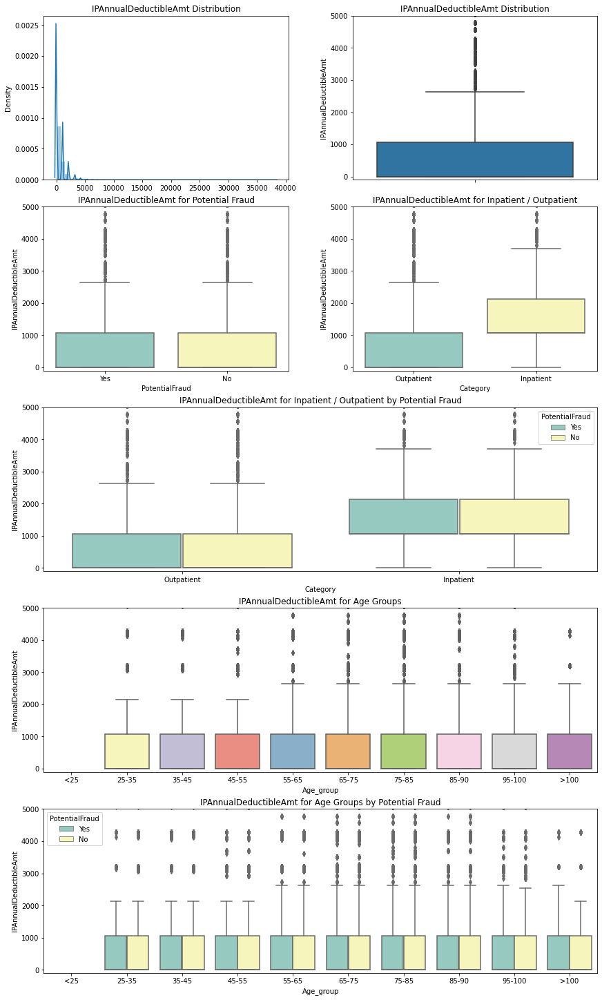

-----------------------------------------------------
The statistics of IPAnnualDeductibleAmt: 
-----------------------------------------------------


count    558211.000000
mean        568.756807
std        1179.172616
min           0.000000
25%           0.000000
50%           0.000000
75%        1068.000000
max       38272.000000
Name: IPAnnualDeductibleAmt, dtype: float64

-----------------------------------------------------
The correlations of IPAnnualDeductibleAmt and other resources: 
-----------------------------------------------------


,IPAnnualDeductibleAmt
IPAnnualDeductibleAmt,1.000000
AnnualDeductibleAmt,0.637578
IPAnnualReimbursementAmt,0.413119
AnnualReimbursementAmt,0.386317
DeductibleAmtPaid,0.094453
InscClaimAmtReimbursed,0.050840
OPAnnualReimbursementAmt,0.019118
OPAnnualDeductibleAmt,0.018781


-----------------------------------------------------
The P value for IPAnnualDeductibleAmt between PotentialFraud (Yes/No)
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(PotentialFraud),1.034820e+09,1.0,745.227476,5.614852e-164
Residual,7.751272e+11,558209.0,NaN,NaN


-----------------------------------------------------
The P value for IPAnnualDeductibleAmt between Inpatient / Outpatient
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Category),7.588575e+10,1.0,60490.569799,0.0
Residual,7.002763e+11,558209.0,NaN,NaN


-----------------------------------------------------
The P value for IPAnnualDeductibleAmt among Age Groups
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Age_group),2.012098e+06,9.0,0.161074,0.68817
Residual,7.747681e+11,558201.0,NaN,NaN


-----------------------------------------------------
The P value for IPAnnualDeductibleAmt among Age Groups
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,65-75,85-90,112.814317,95.242912,130.385723,28.163035,0.001000
1,65-75,25-35,59.379118,16.335691,102.422544,6.051299,0.001000
2,65-75,75-85,67.484472,55.456595,79.512349,24.611417,0.001000
3,65-75,95-100,164.527337,143.662779,185.391894,34.590005,0.001000
4,65-75,45-55,84.063293,61.355326,106.771259,16.238649,0.001000
5,65-75,55-65,84.798555,65.121956,104.475153,18.904281,0.001000
6,65-75,35-45,87.032663,55.433292,118.632033,12.081631,0.001000
7,65-75,>100,234.561481,155.456728,313.666233,13.006962,0.001000
8,85-90,25-35,53.435200,8.402983,98.467417,5.205061,0.007191
9,85-90,75-85,45.329845,27.445946,63.213744,11.118438,0.001000


-----------------------------------------------------
The P value for IPAnnualDeductibleAmt among different Age Groups and Potential Fraud (Yes/No)
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, 65-75)","(Yes, 85-90)",116.504737,84.684852,148.324621,18.065309,0.001000
1,"(Yes, 65-75)","(Yes, 25-35)",30.844373,-48.860760,110.549506,1.909370,0.900000
2,"(Yes, 65-75)","(Yes, 75-85)",55.692248,33.786015,77.598482,12.543752,0.001000
3,"(Yes, 65-75)","(Yes, 95-100)",190.843930,153.432726,228.255135,25.169645,0.001000
4,"(Yes, 65-75)","(Yes, 45-55)",84.817177,43.225351,126.409003,10.061813,0.001000
5,"(Yes, 65-75)","(Yes, 55-65)",63.263926,27.044991,99.482862,8.618286,0.001000
6,"(Yes, 65-75)","(Yes, 35-45)",107.115201,49.701296,164.529105,9.205226,0.001000
7,"(Yes, 65-75)","(Yes, >100)",323.036155,175.394848,470.677462,10.795523,0.001000
8,"(Yes, 65-75)","(No, 65-75)",92.146830,73.222827,111.070833,24.025244,0.001000
9,"(Yes, 65-75)","(No, 85-90)",17.375966,-9.464709,44.216640,3.194155,0.683863


-----------------------------------------------------
The P value for IPAnnualDeductibleAmt among different Age Groups and Inpatient / Outpatient claims
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, Outpatient)","(Yes, Inpatient)",1432.496646,1412.558875,1452.434417,261.035802,0.001000
1,"(Yes, Outpatient)","(No, Outpatient)",0.643402,-7.659159,8.945963,0.281549,0.900000
2,"(Yes, Outpatient)","(No, Inpatient)",1406.155431,1383.162019,1429.148843,222.184093,0.001000
3,"(Yes, Inpatient)","(No, Outpatient)",1433.140049,1413.671747,1452.608350,267.450633,0.001000
4,"(Yes, Inpatient)","(No, Inpatient)",26.341215,-2.620471,55.302901,3.304418,0.089753
5,"(No, Outpatient)","(No, Inpatient)",1406.798833,1384.211291,1429.386376,226.279954,0.001000


In [111]:
resources_plot(resources, 'IPAnnualDeductibleAmt', xtop=-10, ytop=5000)

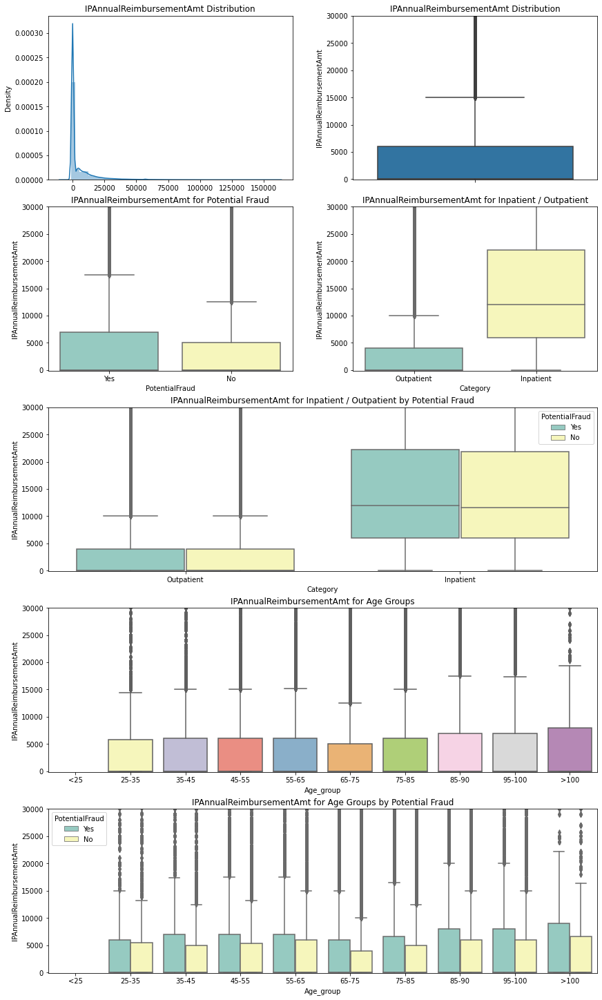

-----------------------------------------------------
The statistics of IPAnnualReimbursementAmt: 
-----------------------------------------------------


count    558211.000000
mean       5227.971466
std       11786.274732
min       -8000.000000
25%           0.000000
50%           0.000000
75%        6000.000000
max      161470.000000
Name: IPAnnualReimbursementAmt, dtype: float64

-----------------------------------------------------
The correlations of IPAnnualReimbursementAmt and other resources: 
-----------------------------------------------------


,IPAnnualReimbursementAmt
IPAnnualReimbursementAmt,1.000000
AnnualReimbursementAmt,0.914372
IPAnnualDeductibleAmt,0.413119
AnnualDeductibleAmt,0.312252
InscClaimAmtReimbursed,0.147226
DeductibleAmtPaid,0.077981
OPAnnualReimbursementAmt,0.031984
OPAnnualDeductibleAmt,0.026593


-----------------------------------------------------
The P value for IPAnnualReimbursementAmt between PotentialFraud (Yes/No)
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(PotentialFraud),9.513691e+10,1.0,685.690783,4.775566e-151
Residual,7.744932e+13,558209.0,NaN,NaN


-----------------------------------------------------
The P value for IPAnnualReimbursementAmt between Inpatient / Outpatient
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Category),6.602723e+12,1.0,51953.901866,0.0
Residual,7.094173e+13,558209.0,NaN,NaN


-----------------------------------------------------
The P value for IPAnnualReimbursementAmt among Age Groups
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Age_group),1.752442e+08,9.0,0.140326,0.707957
Residual,7.745559e+13,558201.0,NaN,NaN


-----------------------------------------------------
The P value for IPAnnualReimbursementAmt among Age Groups
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,65-75,85-90,1050.185020,874.495030,1225.875010,26.220474,0.001000
1,65-75,25-35,36.572784,-393.802525,466.948094,0.372763,0.900000
2,65-75,75-85,554.380036,434.117740,674.642333,20.220870,0.001000
3,65-75,95-100,984.026499,775.409498,1192.643501,20.690874,0.001000
4,65-75,45-55,435.005538,207.956975,662.054101,8.404227,0.001000
5,65-75,55-65,760.142824,563.403785,956.881864,16.948310,0.001000
6,65-75,35-45,1082.891629,766.941202,1398.842056,15.034458,0.001000
7,65-75,>100,1941.518958,1150.579776,2732.458141,10.767634,0.001000
8,85-90,25-35,1086.757805,636.497313,1537.018297,10.587433,0.001000
9,85-90,75-85,495.804984,316.990489,674.619479,12.162698,0.001000


-----------------------------------------------------
The P value for IPAnnualReimbursementAmt among different Age Groups and Potential Fraud (Yes/No)
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, 65-75)","(Yes, 85-90)",1290.562971,972.391345,1608.734597,20.013275,0.001000
1,"(Yes, 65-75)","(Yes, 25-35)",283.631222,-513.351930,1080.614375,1.755922,0.900000
2,"(Yes, 65-75)","(Yes, 75-85)",423.845079,204.801477,642.888681,9.547221,0.001000
3,"(Yes, 65-75)","(Yes, 95-100)",1157.285516,783.205474,1531.365558,15.264283,0.001000
4,"(Yes, 65-75)","(Yes, 45-55)",589.908900,174.026218,1005.791582,6.998654,0.001000
5,"(Yes, 65-75)","(Yes, 55-65)",586.815004,224.656629,948.973380,7.994717,0.001000
6,"(Yes, 65-75)","(Yes, 35-45)",1200.359567,626.269634,1774.449500,10.316487,0.001000
7,"(Yes, 65-75)","(Yes, >100)",2984.425313,1508.138529,4460.712097,9.974483,0.001000
8,"(Yes, 65-75)","(No, 65-75)",853.839038,664.615193,1043.062884,22.263865,0.001000
9,"(Yes, 65-75)","(No, 85-90)",35.839657,-232.544132,304.223447,0.658883,0.900000


-----------------------------------------------------
The P value for IPAnnualReimbursementAmt among different Age Groups and Inpatient / Outpatient claims
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, Outpatient)","(Yes, Inpatient)",13554.891694,13354.217211,13755.566177,245.407008,0.001
1,"(Yes, Outpatient)","(No, Outpatient)",4.899158,-78.666461,88.464776,0.212999,0.900
2,"(Yes, Outpatient)","(No, Inpatient)",12868.530954,12637.101313,13099.960594,202.019388,0.001
3,"(Yes, Inpatient)","(No, Outpatient)",13549.992537,13354.043282,13745.941791,251.234051,0.001
4,"(Yes, Inpatient)","(No, Inpatient)",686.360741,394.860181,977.861301,8.554529,0.001
5,"(No, Outpatient)","(No, Inpatient)",12863.631796,12636.287254,13090.976338,205.571133,0.001


In [112]:
resources_plot(resources, 'IPAnnualReimbursementAmt', xtop=-100, ytop=30000)

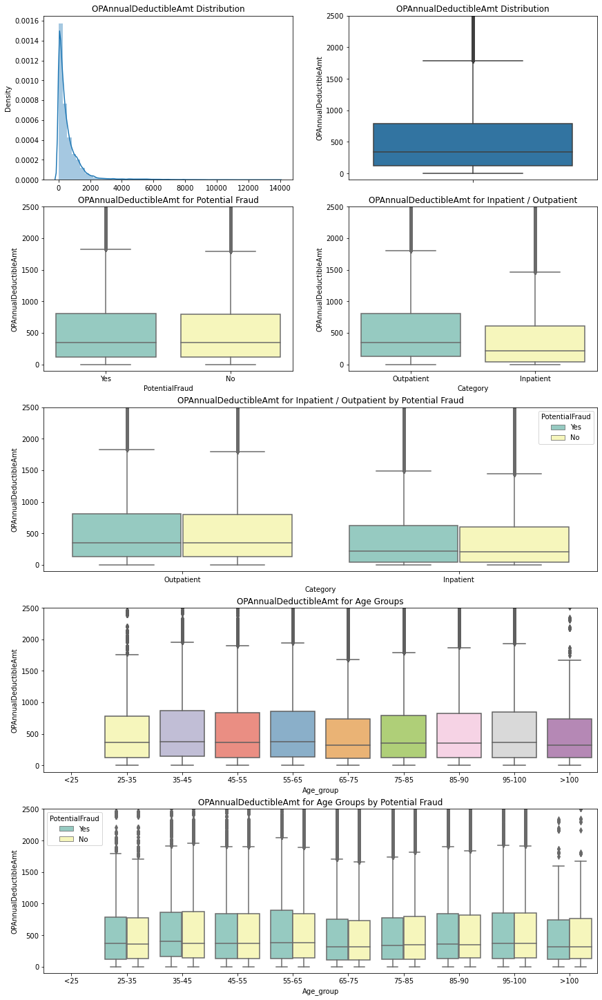

-----------------------------------------------------
The statistics of OPAnnualDeductibleAmt: 
-----------------------------------------------------


count    558211.000000
mean        649.698745
std        1002.020811
min           0.000000
25%         120.000000
50%         340.000000
75%         790.000000
max       13840.000000
Name: OPAnnualDeductibleAmt, dtype: float64

-----------------------------------------------------
The correlations of OPAnnualDeductibleAmt and other resources: 
-----------------------------------------------------


,OPAnnualDeductibleAmt
OPAnnualDeductibleAmt,1.000000
OPAnnualReimbursementAmt,0.701130
AnnualDeductibleAmt,0.498101
AnnualReimbursementAmt,0.157053
IPAnnualReimbursementAmt,0.026593
IPAnnualDeductibleAmt,0.018781
DeductibleAmtPaid,0.001145
InscClaimAmtReimbursed,0.000934


-----------------------------------------------------
The P value for OPAnnualDeductibleAmt between PotentialFraud (Yes/No)
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(PotentialFraud),4.776986e+06,1.0,4.757769,0.029167
Residual,5.604636e+11,558209.0,NaN,NaN


-----------------------------------------------------
The P value for OPAnnualDeductibleAmt between Inpatient / Outpatient
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Category),6.323672e+08,1.0,630.529425,4.583439e-139
Residual,5.598360e+11,558209.0,NaN,NaN


-----------------------------------------------------
The P value for OPAnnualDeductibleAmt among Age Groups
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Age_group),5.327389e+03,9.0,0.00059,0.980615
Residual,5.596620e+11,558201.0,NaN,NaN


-----------------------------------------------------
The P value for OPAnnualDeductibleAmt among Age Groups
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,65-75,85-90,62.341021,47.406766,77.275276,18.311001,0.001000
1,65-75,25-35,19.157703,-17.425682,55.741089,2.297107,0.765024
2,65-75,75-85,48.946054,38.723344,59.168764,21.002616,0.001000
3,65-75,95-100,85.226989,67.493824,102.960153,21.082040,0.001000
4,65-75,45-55,98.707770,79.407859,118.007681,22.434571,0.001000
5,65-75,55-65,105.134388,88.410891,121.857885,27.576519,0.001000
6,65-75,35-45,110.555580,83.698704,137.412456,18.057055,0.001000
7,65-75,>100,145.376470,78.143912,212.609029,9.484976,0.001000
8,85-90,25-35,43.183318,4.909623,81.457013,4.949227,0.013799
9,85-90,75-85,13.394967,-1.804882,28.594816,3.865664,0.135691


-----------------------------------------------------
The P value for OPAnnualDeductibleAmt among different Age Groups and Potential Fraud (Yes/No)
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, 65-75)","(Yes, 85-90)",74.323671,47.261597,101.385745,13.550849,0.001000
1,"(Yes, 65-75)","(Yes, 25-35)",0.597370,-67.189998,68.384738,0.043481,0.900000
2,"(Yes, 65-75)","(Yes, 75-85)",31.493864,12.863120,50.124608,8.340578,0.001000
3,"(Yes, 65-75)","(Yes, 95-100)",84.822156,53.004794,116.639518,13.153628,0.001000
4,"(Yes, 65-75)","(Yes, 45-55)",73.693186,38.320303,109.066070,10.279152,0.001000
5,"(Yes, 65-75)","(Yes, 55-65)",73.013076,42.209711,103.816441,11.695072,0.001000
6,"(Yes, 65-75)","(Yes, 35-45)",80.074989,31.245795,128.904184,8.091290,0.001000
7,"(Yes, 65-75)","(Yes, >100)",195.861884,70.296376,321.427393,7.696265,0.001000
8,"(Yes, 65-75)","(No, 65-75)",20.011287,3.916861,36.105713,6.134793,0.001950
9,"(Yes, 65-75)","(No, 85-90)",34.564685,11.737313,57.392057,7.470972,0.001000


-----------------------------------------------------
The P value for OPAnnualDeductibleAmt among different Age Groups and Inpatient / Outpatient claims
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, Outpatient)","(Yes, Inpatient)",131.833499,114.007142,149.659857,26.868674,0.001000
1,"(Yes, Outpatient)","(No, Outpatient)",13.899122,6.475804,21.322440,6.802559,0.001000
2,"(Yes, Outpatient)","(No, Inpatient)",147.886442,127.328036,168.444848,26.134969,0.001000
3,"(Yes, Inpatient)","(No, Outpatient)",117.934377,100.527773,135.340982,24.615543,0.001000
4,"(Yes, Inpatient)","(No, Inpatient)",16.052942,-9.841696,41.947580,2.252308,0.383841
5,"(No, Outpatient)","(No, Inpatient)",133.987320,113.791802,154.182837,24.104147,0.001000


In [113]:
resources_plot(resources, 'OPAnnualDeductibleAmt', xtop=-100, ytop=2500)

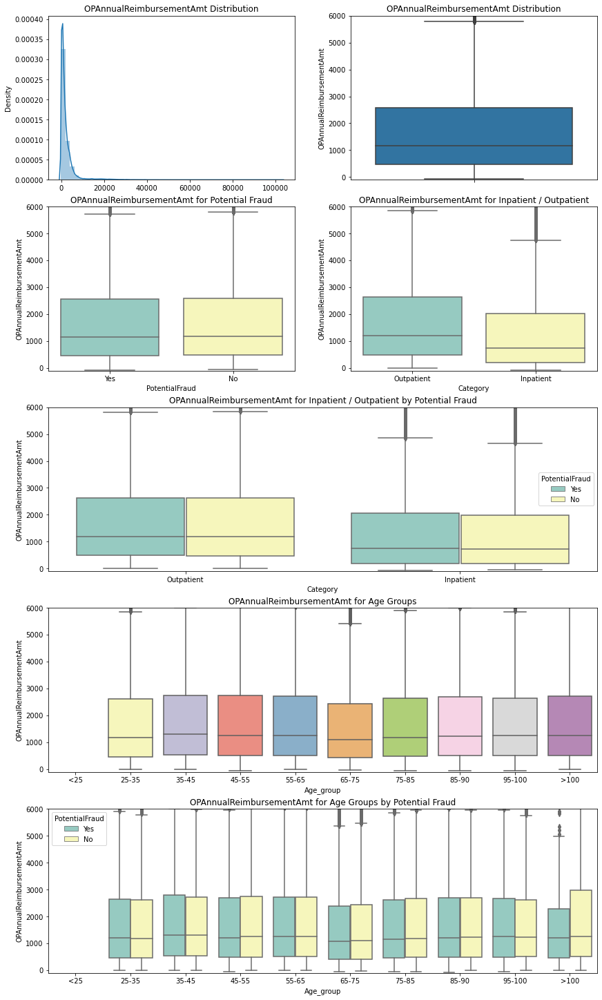

-----------------------------------------------------
The statistics of OPAnnualReimbursementAmt: 
-----------------------------------------------------


count    558211.000000
mean       2278.225348
std        3881.846386
min         -70.000000
25%         460.000000
50%        1170.000000
75%        2590.000000
max      102960.000000
Name: OPAnnualReimbursementAmt, dtype: float64

-----------------------------------------------------
The correlations of OPAnnualReimbursementAmt and other resources: 
-----------------------------------------------------


,OPAnnualReimbursementAmt
OPAnnualReimbursementAmt,1.000000
OPAnnualDeductibleAmt,0.701130
AnnualDeductibleAmt,0.369394
AnnualReimbursementAmt,0.210606
IPAnnualReimbursementAmt,0.031984
IPAnnualDeductibleAmt,0.019118
InscClaimAmtReimbursed,0.004149
DeductibleAmtPaid,0.000783


-----------------------------------------------------
The P value for OPAnnualReimbursementAmt between PotentialFraud (Yes/No)
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(PotentialFraud),3.628192e+07,1.0,2.407768,0.120735
Residual,8.411480e+12,558209.0,NaN,NaN


-----------------------------------------------------
The P value for OPAnnualReimbursementAmt between Inpatient / Outpatient
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Category),6.335947e+09,1.0,420.786012,1.782161e-93
Residual,8.405181e+12,558209.0,NaN,NaN


-----------------------------------------------------
The P value for OPAnnualReimbursementAmt among Age Groups
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Age_group),3.535191e+06,9.0,0.026099,0.871658
Residual,8.401036e+12,558201.0,NaN,NaN


-----------------------------------------------------
The P value for OPAnnualReimbursementAmt among Age Groups
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,65-75,85-90,214.110513,156.249362,271.971664,16.232024,0.001000
1,65-75,25-35,76.662899,-65.075460,218.401257,2.372573,0.732644
2,65-75,75-85,202.878959,163.272178,242.485740,22.469282,0.001000
3,65-75,95-100,285.884178,217.178956,354.589401,18.252490,0.001000
4,65-75,45-55,392.964430,318.189019,467.739841,23.052401,0.001000
5,65-75,55-65,364.620194,299.826819,429.413568,24.684928,0.001000
6,65-75,35-45,364.242448,260.188396,468.296500,15.355123,0.001000
7,65-75,>100,536.938299,276.453046,797.423552,9.041968,0.001000
8,85-90,25-35,137.447615,-10.839663,285.734892,4.065885,0.094561
9,85-90,75-85,11.231554,-47.658611,70.121719,0.836602,0.900000


-----------------------------------------------------
The P value for OPAnnualReimbursementAmt among different Age Groups and Potential Fraud (Yes/No)
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, 65-75)","(Yes, 85-90)",276.124567,171.275282,380.973852,12.993914,0.001000
1,"(Yes, 65-75)","(Yes, 25-35)",28.639000,-233.996342,291.274343,0.538028,0.900000
2,"(Yes, 65-75)","(Yes, 75-85)",149.736279,77.553333,221.919224,10.235118,0.001000
3,"(Yes, 65-75)","(Yes, 95-100)",331.442062,208.168892,454.715233,13.265984,0.001000
4,"(Yes, 65-75)","(Yes, 45-55)",236.122340,99.073658,373.171022,8.500855,0.001000
5,"(Yes, 65-75)","(Yes, 55-65)",210.639319,91.294777,329.983860,8.708379,0.001000
6,"(Yes, 65-75)","(Yes, 35-45)",215.142132,25.958326,404.325938,5.611021,0.009040
7,"(Yes, 65-75)","(Yes, >100)",508.563594,22.072651,995.054537,5.157876,0.029482
8,"(Yes, 65-75)","(No, 65-75)",66.771677,4.415441,129.127913,5.283392,0.021556
9,"(Yes, 65-75)","(No, 85-90)",107.537352,19.094995,195.979709,5.999284,0.002950


-----------------------------------------------------
The P value for OPAnnualReimbursementAmt among different Age Groups and Inpatient / Outpatient claims
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, Outpatient)","(Yes, Inpatient)",387.786727,318.713497,456.859958,20.396997,0.001000
1,"(Yes, Outpatient)","(No, Outpatient)",36.471822,7.708089,65.235554,4.606757,0.006184
2,"(Yes, Outpatient)","(No, Inpatient)",497.253868,417.594549,576.913188,22.679038,0.001000
3,"(Yes, Inpatient)","(No, Outpatient)",351.314906,283.868124,418.761687,18.924238,0.001000
4,"(Yes, Inpatient)","(No, Inpatient)",109.467141,9.131090,209.803193,3.963783,0.026071
5,"(No, Outpatient)","(No, Inpatient)",460.782047,382.528840,539.035254,21.393235,0.001000


In [114]:
resources_plot(resources, 'OPAnnualReimbursementAmt', xtop=-100, ytop=6000)

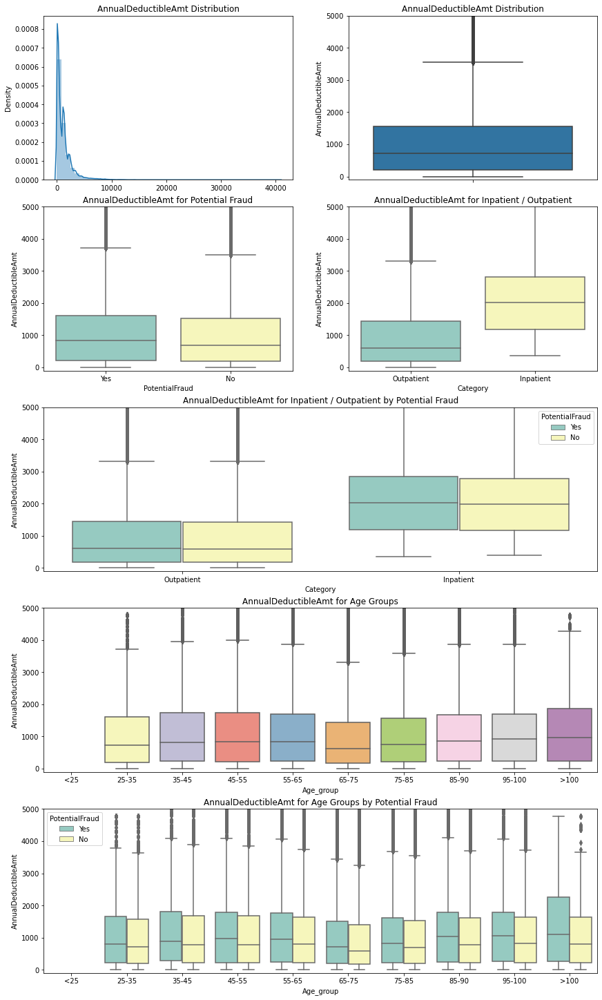

-----------------------------------------------------
The statistics of AnnualDeductibleAmt: 
-----------------------------------------------------


count    558211.000000
mean       1218.455552
std        1648.740649
min           0.000000
25%         210.000000
50%         730.000000
75%        1550.000000
max       40694.000000
Name: AnnualDeductibleAmt, dtype: float64

-----------------------------------------------------
The correlations of AnnualDeductibleAmt and other resources: 
-----------------------------------------------------


,AnnualDeductibleAmt
AnnualDeductibleAmt,1.000000
IPAnnualDeductibleAmt,0.637578
OPAnnualDeductibleAmt,0.498101
AnnualReimbursementAmt,0.469741
OPAnnualReimbursementAmt,0.369394
IPAnnualReimbursementAmt,0.312252
DeductibleAmtPaid,0.039697
InscClaimAmtReimbursed,0.032340


-----------------------------------------------------
The P value for AnnualDeductibleAmt between PotentialFraud (Yes/No)
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(PotentialFraud),1.180215e+09,1.0,434.50378,1.851497e-96
Residual,1.516228e+12,558209.0,NaN,NaN


-----------------------------------------------------
The P value for AnnualDeductibleAmt between Inpatient / Outpatient
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Category),6.266349e+10,1.0,24045.000198,0.0
Residual,1.454744e+12,558209.0,NaN,NaN


-----------------------------------------------------
The P value for AnnualDeductibleAmt among Age Groups
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Age_group),2.224492e+06,9.0,0.091165,0.762701
Residual,1.513389e+12,558201.0,NaN,NaN


-----------------------------------------------------
The P value for AnnualDeductibleAmt among Age Groups
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,65-75,85-90,175.155339,150.597175,199.713502,31.285941,0.001000
1,65-75,25-35,78.536821,18.378429,138.695213,5.726626,0.001691
2,65-75,75-85,116.430527,99.620114,133.240939,30.381572,0.001000
3,65-75,95-100,249.754325,220.593583,278.915067,37.569567,0.001000
4,65-75,45-55,182.771063,151.033934,214.508191,25.261640,0.001000
5,65-75,55-65,189.932943,162.432517,217.433369,30.295813,0.001000
6,65-75,35-45,197.588242,153.424302,241.752183,19.625242,0.001000
7,65-75,>100,379.937951,269.379496,490.496407,15.074484,0.001000
8,85-90,25-35,96.618518,33.680550,159.556485,6.733942,0.001000
9,85-90,75-85,58.724812,33.729901,83.719723,10.306039,0.001000


-----------------------------------------------------
The P value for AnnualDeductibleAmt among different Age Groups and Potential Fraud (Yes/No)
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, 65-75)","(Yes, 85-90)",190.828408,146.344031,235.312784,21.165861,0.001000
1,"(Yes, 65-75)","(Yes, 25-35)",31.441743,-79.986480,142.869965,1.392233,0.900000
2,"(Yes, 65-75)","(Yes, 75-85)",87.186112,56.561075,117.811150,14.046596,0.001000
3,"(Yes, 65-75)","(Yes, 95-100)",275.666086,223.365013,327.967159,26.005976,0.001000
4,"(Yes, 65-75)","(Yes, 45-55)",158.510363,100.364758,216.655969,13.450585,0.001000
5,"(Yes, 65-75)","(Yes, 55-65)",136.277003,85.642728,186.911277,13.279398,0.001000
6,"(Yes, 65-75)","(Yes, 35-45)",187.190190,106.925230,267.455149,11.506878,0.001000
7,"(Yes, 65-75)","(Yes, >100)",518.898040,312.494665,725.301414,12.404111,0.001000
8,"(Yes, 65-75)","(No, 65-75)",112.158117,85.702254,138.613979,20.917472,0.001000
9,"(Yes, 65-75)","(No, 85-90)",51.940651,14.417237,89.464065,6.829760,0.001000


-----------------------------------------------------
The P value for AnnualDeductibleAmt among different Age Groups and Inpatient / Outpatient claims
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, Outpatient)","(Yes, Inpatient)",1300.663147,1271.926895,1329.399398,164.443905,0.001000
1,"(Yes, Outpatient)","(No, Outpatient)",14.542524,2.576067,26.508982,4.415270,0.009721
2,"(Yes, Outpatient)","(No, Inpatient)",1258.268989,1225.128651,1291.409328,137.942983,0.001000
3,"(Yes, Inpatient)","(No, Outpatient)",1315.205671,1287.146065,1343.265278,170.292357,0.001000
4,"(Yes, Inpatient)","(No, Inpatient)",42.394158,0.651763,84.136552,3.689876,0.044925
5,"(No, Outpatient)","(No, Inpatient)",1272.811514,1240.256154,1305.366873,142.044578,0.001000


In [115]:
resources_plot(resources, 'AnnualDeductibleAmt', xtop=-100, ytop=5000)

<div class="alert-warning">
    <b>Findings </b> 
    <li> <font color='red'>The AnnualDeductibleAmt    are similar for different age groups</font> </li>
    <li> <font color='red'>From AnnualDeductibleAmt , age group 35-55, over 85 share the similarities, remaining groups showed sig difference from other age groups(alpha=0.1)</font> </li>
    <li> <font color='red'>The AnnualDeductibleAmt  are significantly higher for outpatient claims than that for inpatient claims. </font> </li>
    <li> <font color='red'>The AnnualDeductibleAmt  for potential fraud claims are significantly higher than that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>For both inpatient and outpatient claims, the AnnualDeductibleAmt  for potential fraud claims are significantly higher than that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>The AnnualDeductibleAmt are significantly higher for outpatient claims than that for inpatient claims within Potential Fraud and non Potential Fraud groups. </font> </li>
</div>

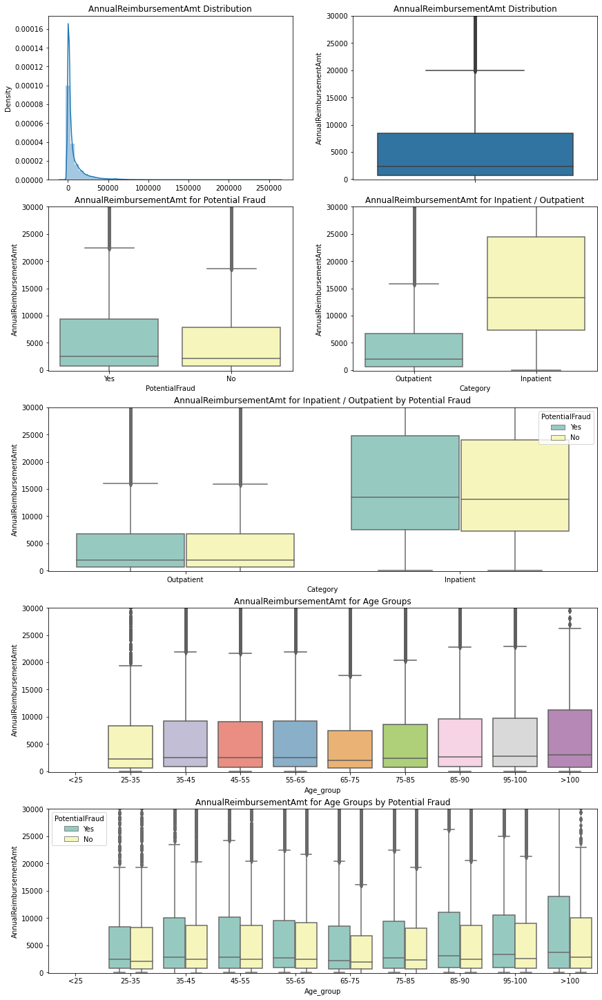

-----------------------------------------------------
The statistics of AnnualReimbursementAmt: 
-----------------------------------------------------


count    558211.000000
mean       7506.196814
std       13051.813649
min       -8000.000000
25%         710.000000
50%        2320.000000
75%        8420.000000
max      262720.000000
Name: AnnualReimbursementAmt, dtype: float64

-----------------------------------------------------
The correlations of AnnualReimbursementAmt and other resources: 
-----------------------------------------------------


,AnnualReimbursementAmt
AnnualReimbursementAmt,1.000000
IPAnnualReimbursementAmt,0.914372
AnnualDeductibleAmt,0.469741
IPAnnualDeductibleAmt,0.386317
OPAnnualReimbursementAmt,0.210606
OPAnnualDeductibleAmt,0.157053
InscClaimAmtReimbursed,0.133702
DeductibleAmtPaid,0.059464


-----------------------------------------------------
The P value for AnnualReimbursementAmt between PotentialFraud (Yes/No)
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(PotentialFraud),9.888897e+10,1.0,581.108509,2.505067e-128
Residual,9.499209e+13,558209.0,NaN,NaN


-----------------------------------------------------
The P value for AnnualReimbursementAmt between Inpatient / Outpatient
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Category),6.199990e+12,1.0,38934.09052,0.0
Residual,8.889099e+13,558209.0,NaN,NaN


-----------------------------------------------------
The P value for AnnualReimbursementAmt among Age Groups
-----------------------------------------------------


,sum_sq,df,F,PR(>F)
C(Age_group),2.285598e+08,9.0,0.149312,0.699194
Residual,9.494105e+13,558201.0,NaN,NaN


-----------------------------------------------------
The P value for AnnualReimbursementAmt among Age Groups
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,65-75,85-90,1264.295534,1069.782966,1458.808101,28.511671,0.001000
1,65-75,25-35,40.090114,-436.393528,516.573757,0.369072,0.900000
2,65-75,75-85,757.258995,624.112377,890.405614,24.948017,0.001000
3,65-75,95-100,1269.910677,1038.943457,1500.877897,24.118182,0.001000
4,65-75,45-55,827.969968,576.596518,1079.343419,14.448306,0.001000
5,65-75,55-65,1124.763018,906.946308,1342.579729,22.651219,0.001000
6,65-75,35-45,1447.134077,1097.334246,1796.933907,18.147254,0.001000
7,65-75,>100,2478.457258,1602.780668,3354.133847,12.415363,0.001000
8,85-90,25-35,1224.205419,725.706192,1722.704647,10.772377,0.001000
9,85-90,75-85,507.036538,309.064721,705.008356,11.234600,0.001000


-----------------------------------------------------
The P value for AnnualReimbursementAmt among different Age Groups and Potential Fraud (Yes/No)
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, 65-75)","(Yes, 85-90)",1566.687538,1214.395918,1918.979159,21.942216,0.001000
1,"(Yes, 65-75)","(Yes, 25-35)",254.992222,-627.457574,1137.442018,1.425730,0.900000
2,"(Yes, 65-75)","(Yes, 75-85)",573.581358,331.048023,816.114693,11.668741,0.001000
3,"(Yes, 65-75)","(Yes, 95-100)",1488.727579,1074.532052,1902.923106,17.734145,0.001000
4,"(Yes, 65-75)","(Yes, 45-55)",826.031240,365.550254,1286.512226,8.850854,0.001000
5,"(Yes, 65-75)","(Yes, 55-65)",797.454323,396.458914,1198.449731,9.812210,0.001000
6,"(Yes, 65-75)","(Yes, 35-45)",1415.501699,779.847680,2051.155719,10.987276,0.001000
7,"(Yes, 65-75)","(Yes, >100)",3492.988907,1858.388516,5127.589297,10.543530,0.001000
8,"(Yes, 65-75)","(No, 65-75)",920.610716,711.094939,1130.126492,21.680022,0.001000
9,"(Yes, 65-75)","(No, 85-90)",143.377009,-153.787642,440.541660,2.380580,0.900000


-----------------------------------------------------
The P value for AnnualReimbursementAmt among different Age Groups and Inpatient / Outpatient claims
-----------------------------------------------------


,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Yes, Outpatient)","(Yes, Inpatient)",13167.104967,12942.474582,13391.735352,212.963344,0.001000
1,"(Yes, Outpatient)","(No, Outpatient)",31.572664,-61.968761,125.114089,1.226282,0.798439
2,"(Yes, Outpatient)","(No, Inpatient)",12371.277085,12112.220086,12630.334084,173.501113,0.001000
3,"(Yes, Inpatient)","(No, Outpatient)",13198.677631,12979.336557,13418.018705,218.621826,0.001000
4,"(Yes, Inpatient)","(No, Inpatient)",795.827882,469.528882,1122.126882,8.861076,0.001000
5,"(No, Outpatient)","(No, Inpatient)",12402.849749,12148.365515,12657.333984,177.069460,0.001000


In [116]:
resources_plot(resources, 'AnnualReimbursementAmt', xtop=-100, ytop=30000)

<div class="alert-warning">
    <b>Findings </b> 
    <li> <font color='red'>The AnnualReimbursementAmt   are similar for different age groups</font> </li>
    <li> <font color='red'>The AnnualReimbursementAmt are for age group 35-55 and over 75  have sig difference mfrom other age groups(alpha=0.1)</font> </li>
    <li> <font color='red'>The AnnualReimbursementAmt are significantly higher for outpatient claims than that for inpatient claims. </font> </li>
    <li> <font color='red'>The AnnualReimbursementAmt for potential fraud claims are significantly higher than that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>For inpatient claims, the AnnualReimbursementAmt for potential fraud claims are significantly higher than that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>For outpatient claims, the AnnualReimbursementAmt for potential fraud claims are similar to that for non-potential fraud claims.</font> </li>
    <li> <font color='red'>The AnnualReimbursementAmt are significantly higher for outpatient claims than that for inpatient claims within Potential Fraud and non Potential Fraud groups. </font> </li>
</div>

<h1 style="color:tomato;
           background-color: #FFFF00; 
           padding: 1px;" >Time Series</h1>

In [114]:
import datetime

ts=train[['BeneID', 'ClaimID', 'ClaimStartDt', 'Category','PotentialFraud','Provider',
       'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
       'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5',
       'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8',
       'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10', 'ClmProcedureCode_1',
       'ClmProcedureCode_2', 'ClmProcedureCode_3', 'ClmProcedureCode_4',
       'ClmProcedureCode_5', 'ClmProcedureCode_6',
       'Age_group','Race','Gender','State','TreatmentDuration']]

ts = ts.set_index('ClaimStartDt').replace('0',np.nan)
ts_weekly_group=ts.groupby('Category').resample('W').count()
ts_monthly_group=ts.groupby(['Provider','Category']).resample('M').count()

#### Weekly Claim Amount


In [115]:
def plot_weekly_ts(df, feature, title=''):
    
    fig, ax = plt.subplots(figsize = (10, 4))
    
    category_list=df.index.get_level_values(0).unique().tolist()
    cl=color_list(len(category_list))
    
    i=0
    for l in category_list: 
        df_cat=df.loc[l][feature]   
        ax.plot(df_cat, 'k--', label=l, color=cl[i])
        i=i+1
    
    df_all=df.groupby('ClaimStartDt')[feature].sum()
    ax.plot(df_all, 'k', label='Total', color='blue')
    
    legend = ax.legend(loc='upper left', shadow=True, fontsize='large')

    plt.xlabel('Claim Start Date')
    plt.ylabel('Claim Counts for '+feature)
    plt.title(title)
    
    plt.show()    

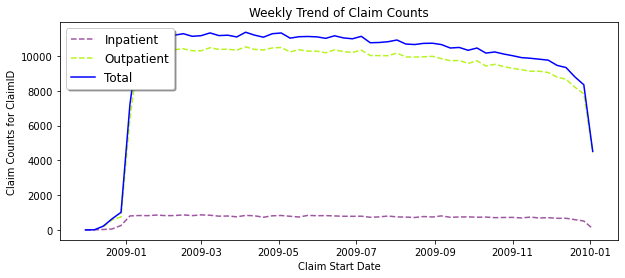

In [116]:
plot_weekly_ts(ts_weekly_group,'ClaimID', title='Weekly Trend of Claim Counts')

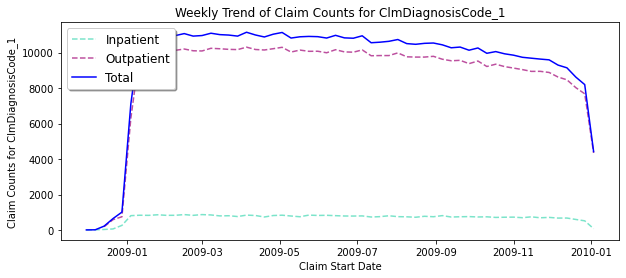

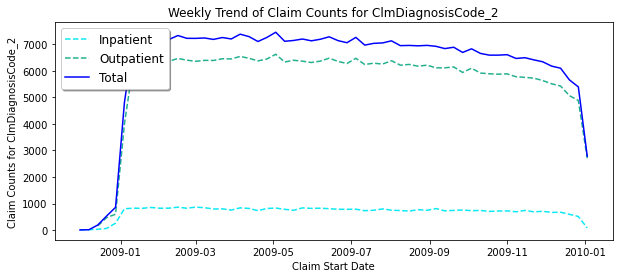

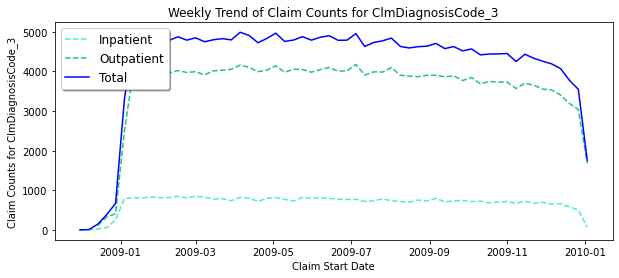

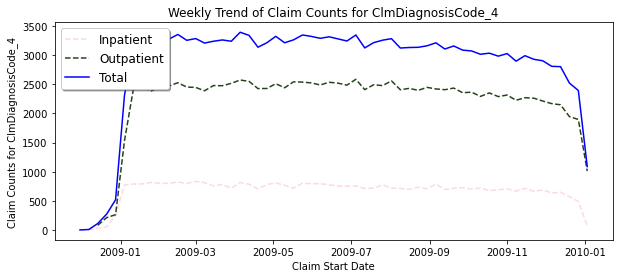

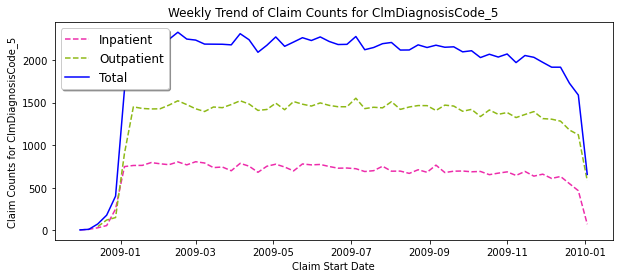

In [117]:
top5_diagnosiscode=ts[['ClmDiagnosisCode_1', 'ClmDiagnosisCode_2',
       'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5',
       'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8',
       'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10', 'ClmProcedureCode_1',
       'ClmProcedureCode_2', 'ClmProcedureCode_3', 'ClmProcedureCode_4',
       'ClmProcedureCode_5', 'ClmProcedureCode_6']].count().head(5).reset_index()['index']
for l in top5_diagnosiscode:
    plot_weekly_ts(ts_weekly_group,l, title='Weekly Trend of Claim Counts for '+l)

<div class="alert-warning">
    <b>Findings </b> 
    <li> <font color='red'>The top 5 claim diagnosis codes showed similar time series pattern to that of all claims</font> </li>
</div>

### Stationary Test and  Eliminating Trends 
- https://machinelearningmastery.com/power-transform-time-series-forecast-data-python/
- https://www.analyticsvidhya.com/blog/2016/02/time-series-forecasting-codes-python/

In [118]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(ts,windowsize=1):

    #Determing rolling statistics
    rolmean = ts.rolling(window=windowsize).mean()
    rolstd = ts.rolling(window=windowsize).std()

    fig, ax = plt.subplots(figsize = (6, 4))
    #Plot rolling statistics:
    orig = plt.plot(ts, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(ts, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    return(dfoutput)

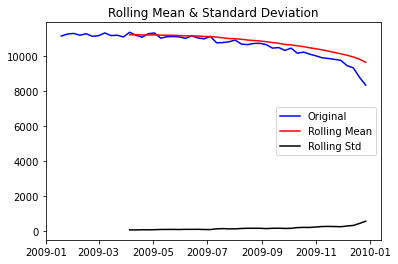

Results of Dickey-Fuller Test:
Test Statistic                  4.537669
p-value                         1.000000
#Lags Used                      2.000000
Number of Observations Used    47.000000
Critical Value (1%)            -3.577848
Critical Value (5%)            -2.925338
Critical Value (10%)           -2.600774
dtype: float64


Test Statistic                  4.537669
p-value                         1.000000
#Lags Used                      2.000000
Number of Observations Used    47.000000
Critical Value (1%)            -3.577848
Critical Value (5%)            -2.925338
Critical Value (10%)           -2.600774
dtype: float64

In [119]:
# Because the data is spare before Jan, 11, 2009 and after Dec 2009, so the date in 2009 will be examined
from datetime import timedelta as td
import dateutil.parser

df=ts_weekly_group.groupby('ClaimStartDt')['ClaimID'].sum()
df=df[(df.index > dateutil.parser.parse("2009-01-11"))
   & (df.index < dateutil.parser.parse("2010-01-01"))]
test_stationarity(df,12)

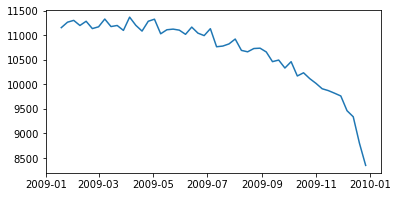

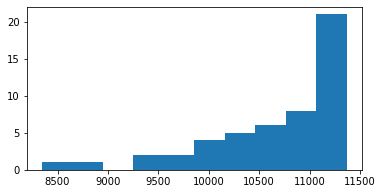

In [120]:
fig, ax = plt.subplots(figsize = (6, 3))
# line plot
plt.plot(df)
plt.show()
# histogram
fig, ax = plt.subplots(figsize = (6, 3))
plt.hist(df)
plt.show()

### Transformation

In [121]:
def ts_transform(df, func='original', ws=12):
    fig, ax = plt.subplots(figsize = (6, 6))
    
    switcher = {
        'original': lambda:df,
        'sqrt': lambda: sqrt(df),
        'log': lambda: log(df),
        'boxcox': lambda: boxcox(df),
        'ewm': lambda: df.ewm(halflife=ws).mean(),
        'moving_avg ': lambda: df.rolling(window=ws).mean(),
        'decompose': lambda: seasonal_decompose(x=df, 
                                                model='additive', 
                                                extrapolate_trend='freq', 
                                                period=ws),
    }
    
    df_transform=switcher.get(func, lambda: "Invalid arg")()  
    
    if func=='boxcox':
        transform, lam=df_transform
        print('Lambda is :'+str(lam))
        df_transform=pd.DataFrame(transform)
        df_transform.index=df.index
        
    elif func=='moving_avg':
        moving_avg=df.rolling(window=12).mean()
        df_transform=df - moving_avg
        df_transform.dropna(inplace=True)
        
    elif func=='decompose':        
        trend = df_transform.trend
        seasonal = df_transform.seasonal
        residual = df_transform.resid
        plt.subplot(411)
        plt.plot(df, label='Original')
        plt.legend(loc='best')
        plt.subplot(412)
        plt.plot(trend, label='Trend')
        plt.legend(loc='best')
        plt.subplot(413)
        plt.plot(seasonal,label='Seasonality')
        plt.legend(loc='best')
        plt.subplot(414)
        plt.plot(residual, label='Residuals')
        plt.legend(loc='best')
        plt.tight_layout()
        plt.show()
        
        df_transform = residual
        df_transform.dropna(inplace=True) 
                
    plt.figure(1)
    # line plot
    plt.subplot(211)
    if func=='moving_avg':
        plt.plot(moving_avg)
    else:
        plt.plot(df_transform)
    # histogram
    plt.subplot(212)
    plt.hist(df_transform)
    plt.title('Test Stationarity for ' + func +' Transformation')
    plt.show()
    return test_stationarity(df_transform,ws)

original


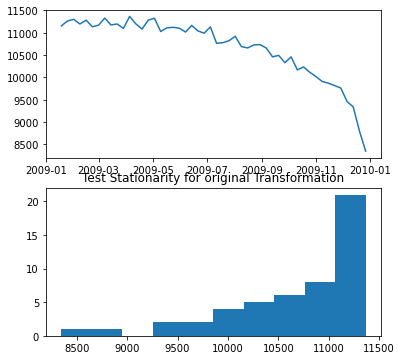

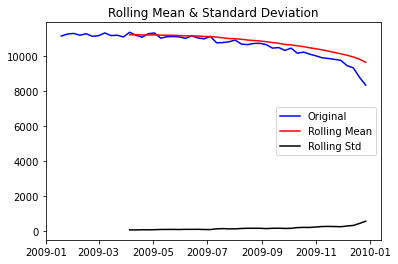

Results of Dickey-Fuller Test:
Test Statistic                  4.537669
p-value                         1.000000
#Lags Used                      2.000000
Number of Observations Used    47.000000
Critical Value (1%)            -3.577848
Critical Value (5%)            -2.925338
Critical Value (10%)           -2.600774
dtype: float64
sqrt


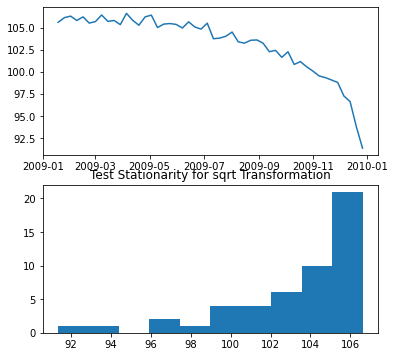

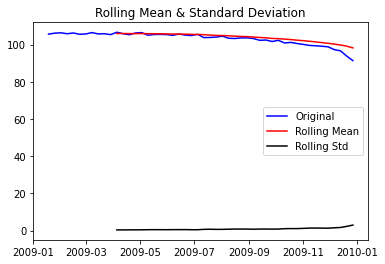

Results of Dickey-Fuller Test:
Test Statistic                  4.377614
p-value                         1.000000
#Lags Used                      1.000000
Number of Observations Used    48.000000
Critical Value (1%)            -3.574589
Critical Value (5%)            -2.923954
Critical Value (10%)           -2.600039
dtype: float64
log


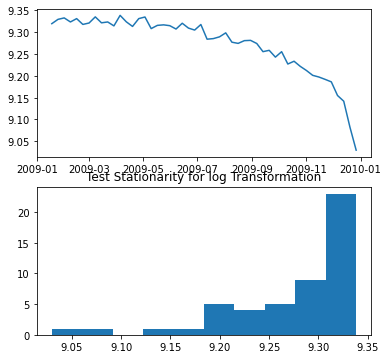

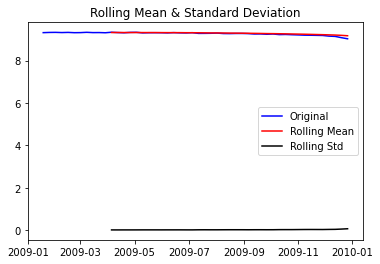

Results of Dickey-Fuller Test:
Test Statistic                  4.555246
p-value                         1.000000
#Lags Used                      1.000000
Number of Observations Used    48.000000
Critical Value (1%)            -3.574589
Critical Value (5%)            -2.923954
Critical Value (10%)           -2.600039
dtype: float64
boxcox
Lambda is :11.597008769867143


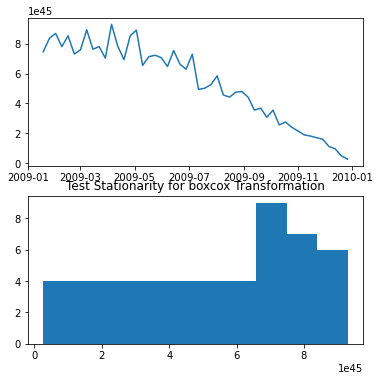

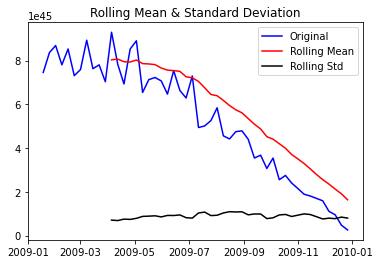

Results of Dickey-Fuller Test:
Test Statistic                 -1.599111
p-value                         0.484040
#Lags Used                     11.000000
Number of Observations Used    38.000000
Critical Value (1%)            -3.615509
Critical Value (5%)            -2.941262
Critical Value (10%)           -2.609200
dtype: float64
moving_avg


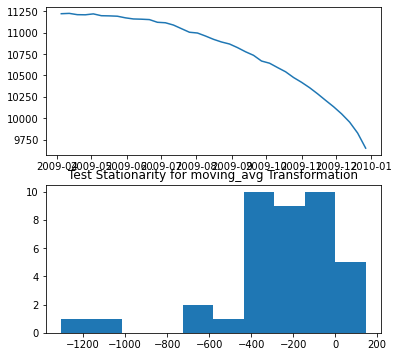

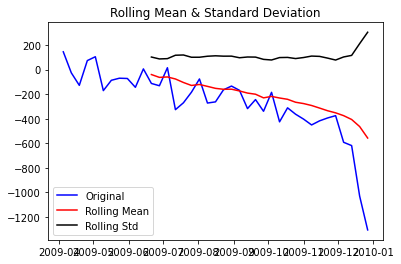

Results of Dickey-Fuller Test:
Test Statistic                  1.583231
p-value                         0.997806
#Lags Used                      1.000000
Number of Observations Used    37.000000
Critical Value (1%)            -3.620918
Critical Value (5%)            -2.943539
Critical Value (10%)           -2.610400
dtype: float64
ewm


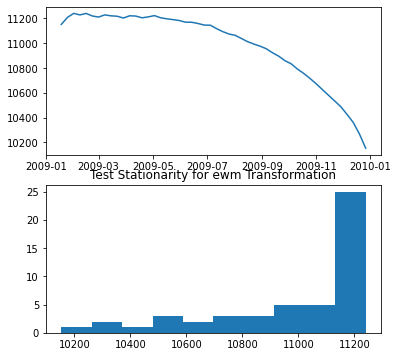

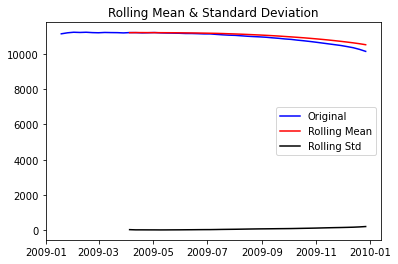

Results of Dickey-Fuller Test:
Test Statistic                 11.288974
p-value                         1.000000
#Lags Used                      0.000000
Number of Observations Used    49.000000
Critical Value (1%)            -3.571472
Critical Value (5%)            -2.922629
Critical Value (10%)           -2.599336
dtype: float64
decompose


NameError: name 'seasonal_decompose' is not defined

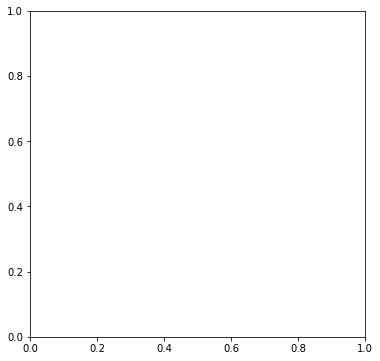

In [122]:
df=ts_weekly_group.groupby('ClaimStartDt')['ClaimID'].sum()
df=df[(df.index > dateutil.parser.parse("2009-01-11"))
   & (df.index < dateutil.parser.parse("2010-01-01"))]
ls=['original', 'sqrt','log', 'boxcox', 'moving_avg','ewm','decompose']

df_ts_stats=pd.DataFrame()


for l in ls:
    print(l)
    stats=ts_transform(df, l, ws=12)
    df_ts_stats[l]=stats
df_ts_stats

#### box-cox transformation gives a better p-value, we will use this transformation

### ACF PACF Plots

Text(0.5, 1.0, 'Autocorrelation Function')

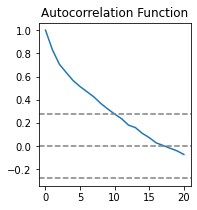

In [123]:
#ACF and PACF plots:
df_transform=log(df)
lag_acf = acf(df_transform, nlags=20)
lag_pacf = pacf(df_transform, nlags=20, method='ols')
#Plot ACF: 
plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(df_transform)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(df_transform)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

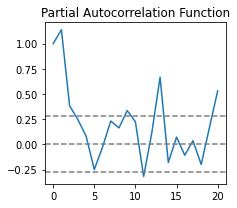

In [124]:
#Plot PACF:
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(df_transform)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(df_transform)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

### check differencing term (d)

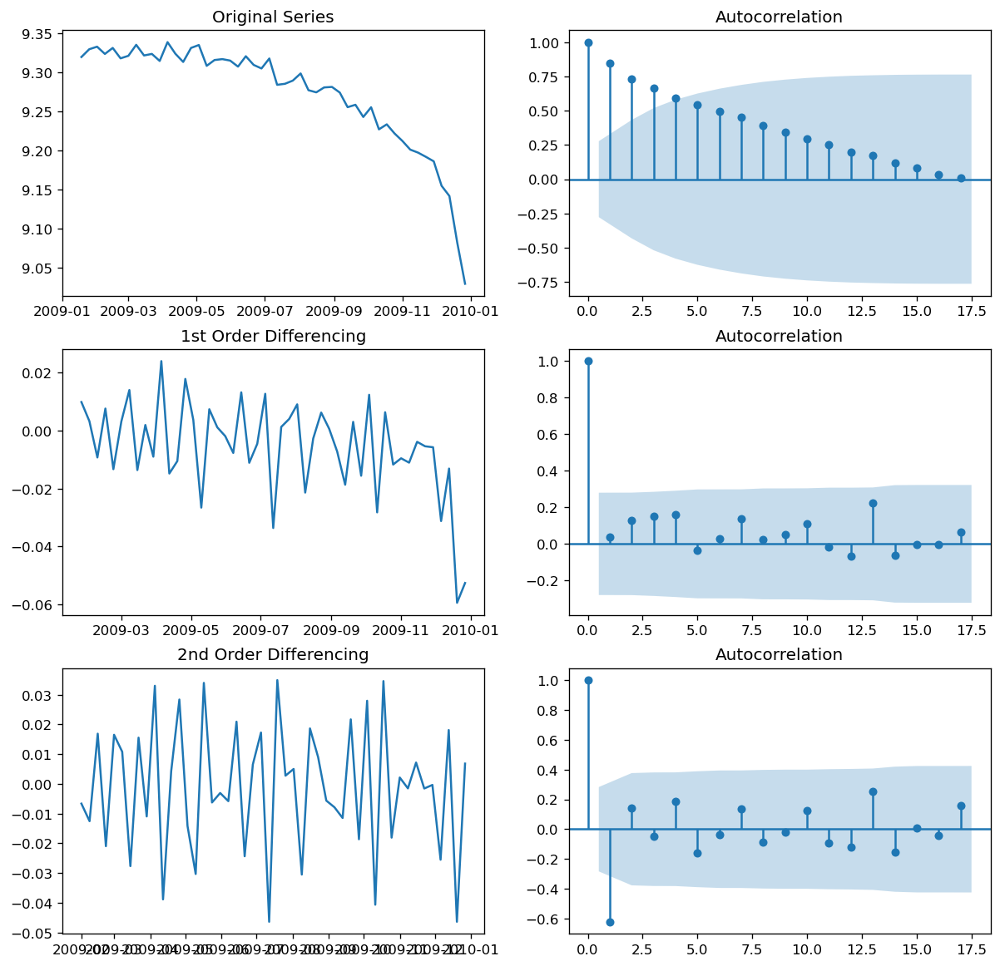

In [125]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex=False)
axes[0, 0].plot(df_transform); 
axes[0, 0].set_title('Original Series')
plot_acf(df, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df_transform.diff()); 
axes[1, 0].set_title('1st Order Differencing')
plot_acf(df_transform.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df_transform.diff().diff()); 
axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df_transform.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

In [126]:
# check differencing with different tests
y=df_transform

## Adf Test
adf=ndiffs(y, test='adf')  # 2

# KPSS test
kpss=ndiffs(y, test='kpss')  # 2

# PP test:
pp=ndiffs(y, test='pp')  # 1

print(adf,kpss,pp)

2 2 1


### check  AR term (p)

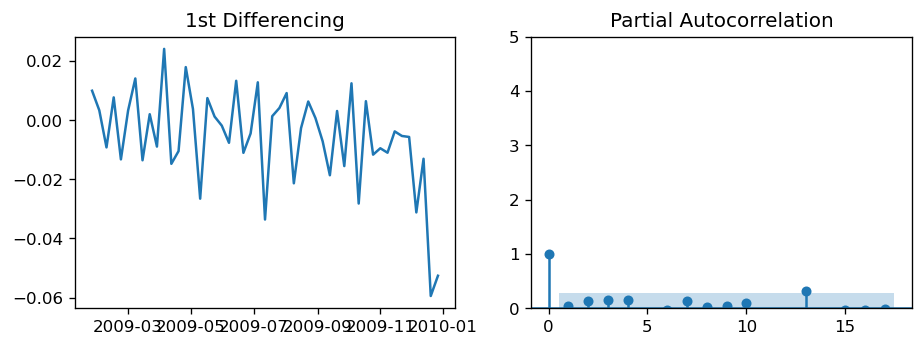

In [127]:
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2, sharex=False)
axes[0].plot(df_transform.diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,5))
plot_pacf(df_transform.diff().dropna(), ax=axes[1])

plt.show()

### check  MA term (q)

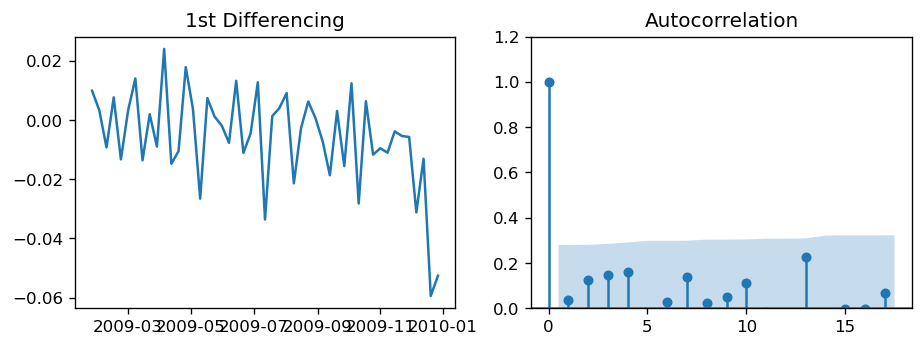

In [128]:
fig, axes = plt.subplots(1, 2, sharex=False)
axes[0].plot(df_transform.diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,1.2))
plot_acf(df_transform.diff().dropna(), ax=axes[1])

plt.show()

### Building model (order=(1,1,1))

In [129]:
model = ARIMA(df_transform, order=(2,1,1))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:              D.ClaimID   No. Observations:                   49
Model:                 ARIMA(2, 1, 1)   Log Likelihood                 135.107
Method:                       css-mle   S.D. of innovations              0.015
Date:                Fri, 17 Jun 2022   AIC                           -260.215
Time:                        13:32:32   BIC                           -250.756
Sample:                    01-25-2009   HQIC                          -256.626
                         - 12-27-2009                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0105      0.010     -1.050      0.294      -0.030       0.009
ar.L1.D.ClaimID     0.6676      0.195      3.430      0.001       0.286       1.049
ar.L2.D.ClaimID     0.2720      

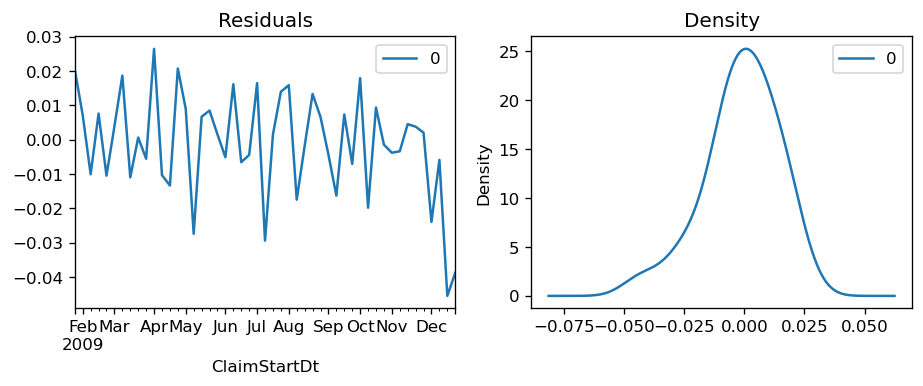

In [130]:
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

#### standard deviation for box-cox transformation is quite large, so I will try raw data without transformation

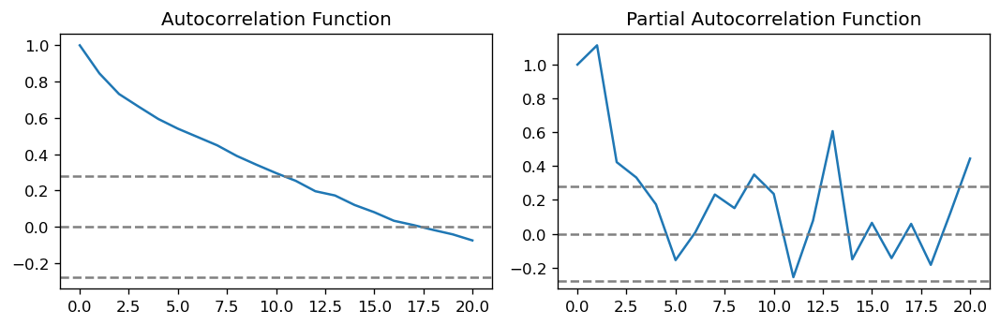

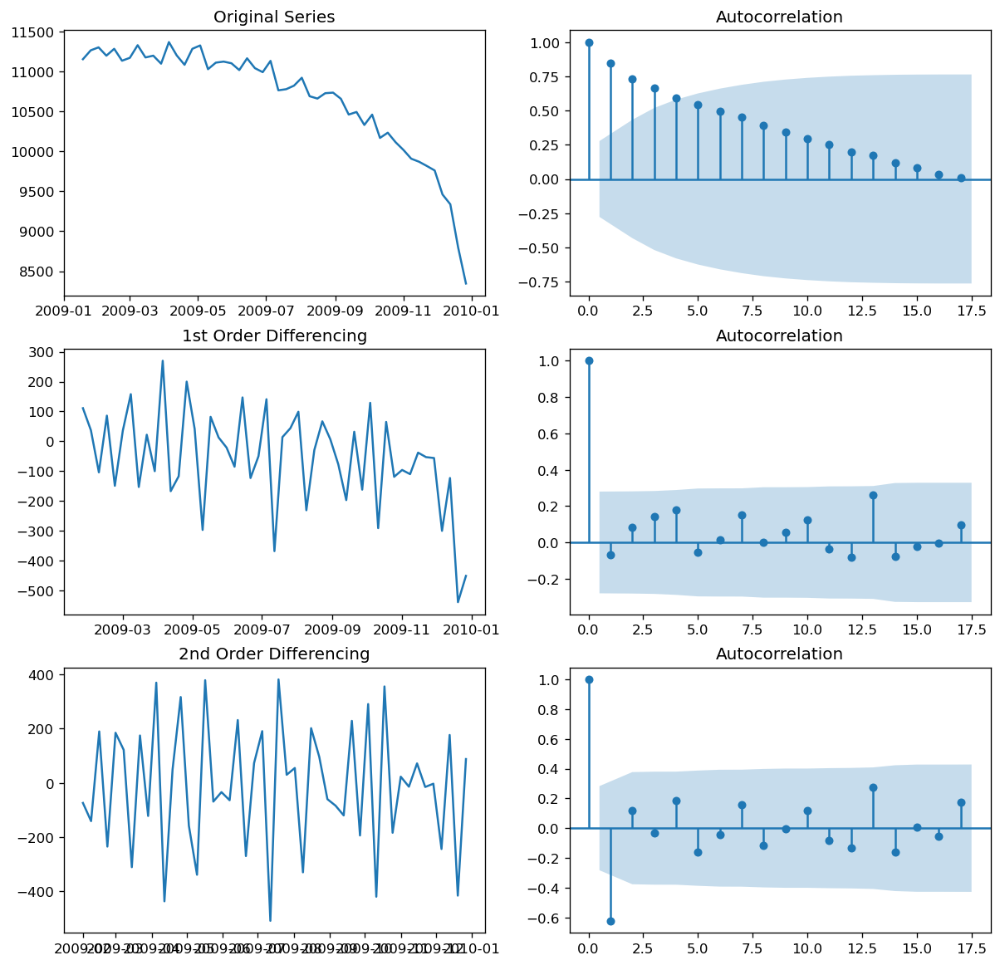

best differencing term is :  2 2 1


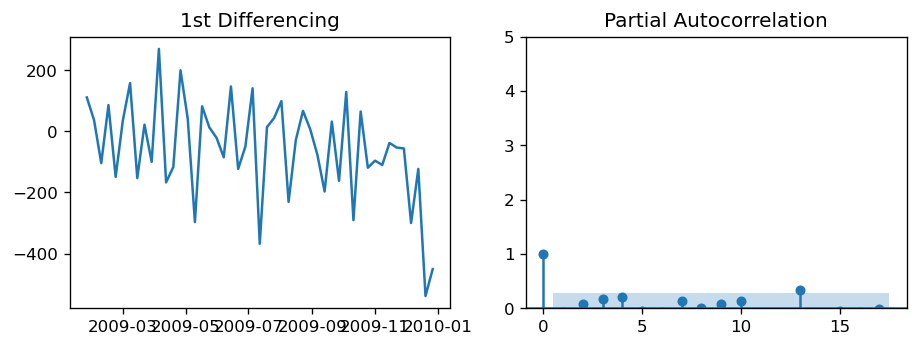

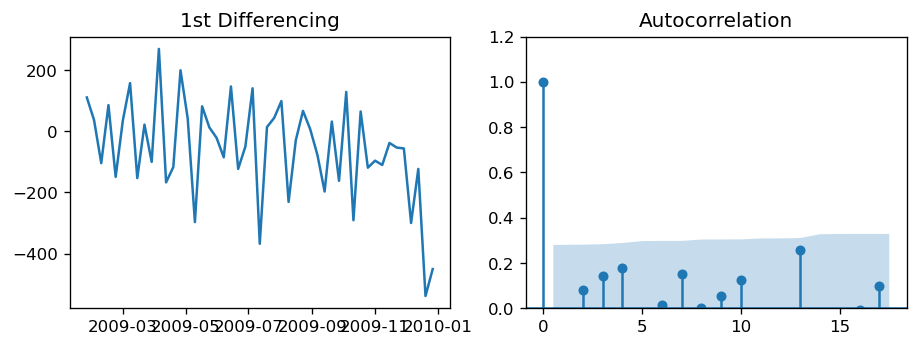

                             ARIMA Model Results                              
Dep. Variable:              D.ClaimID   No. Observations:                   49
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -318.885
Method:                       css-mle   S.D. of innovations            162.204
Date:                Fri, 17 Jun 2022   AIC                            645.771
Time:                        13:32:34   BIC                            653.338
Sample:                    01-25-2009   HQIC                           648.642
                         - 12-27-2009                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -57.1307     22.072     -2.588      0.010    -100.390     -13.871
ar.L1.D.ClaimID    -0.4438      2.522     -0.176      0.860      -5.387       4.499
ma.L1.D.ClaimID     0.3721      

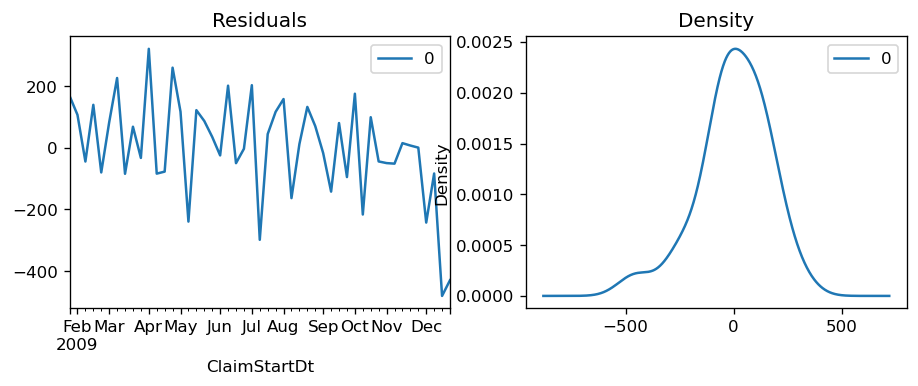

In [131]:
#ACF and PACF plots:
df_transform=df

lag_acf = acf(df_transform, nlags=20)
lag_pacf = pacf(df_transform, nlags=20, method='ols')
#Plot ACF: 
plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(df_transform)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(df_transform)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')


#Plot PACF:
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(df_transform)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(df_transform)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()


from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.rcParams.update({'figure.figsize':(12,12), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex=False)
axes[0, 0].plot(df_transform); 
axes[0, 0].set_title('Original Series')
plot_acf(df, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df_transform.diff()); 
axes[1, 0].set_title('1st Order Differencing')
plot_acf(df_transform.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df_transform.diff().diff()); 
axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df_transform.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

# check differencing with different tests
y=df_transform
## Adf Test
adf=ndiffs(y, test='adf')  # 2

# KPSS test
kpss=ndiffs(y, test='kpss')  # 2

# PP test:
pp=ndiffs(y, test='pp')  # 1

print('best differencing term is : ', adf,kpss,pp)

# checking ar term (p)
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2, sharex=False)
axes[0].plot(df_transform.diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,5))
plot_pacf(df_transform.diff().dropna(), ax=axes[1])

plt.show()

# checking ma term(q)

fig, axes = plt.subplots(1, 2, sharex=False)
axes[0].plot(df_transform.diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,1.2))
plot_acf(df_transform.diff().dropna(), ax=axes[1])

plt.show()

# modeling

model = ARIMA(df, order=(1,1,1))
model_fit = model.fit(disp=-1)
print(model_fit.summary())

# residual plot
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()



                             ARIMA Model Results                              
Dep. Variable:             D2.ClaimID   No. Observations:                   48
Model:                 ARIMA(1, 2, 1)   Log Likelihood                -309.390
Method:                       css-mle   S.D. of innovations            145.671
Date:                Fri, 17 Jun 2022   AIC                            626.780
Time:                        13:32:35   BIC                            634.265
Sample:                    02-01-2009   HQIC                           629.608
                         - 12-27-2009                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -4.5376      1.213     -3.739      0.000      -6.916      -2.159
ar.L1.D2.ClaimID    -0.2297      0.146     -1.577      0.115      -0.515       0.056
ma.L1.D2.ClaimID    -1.0000 

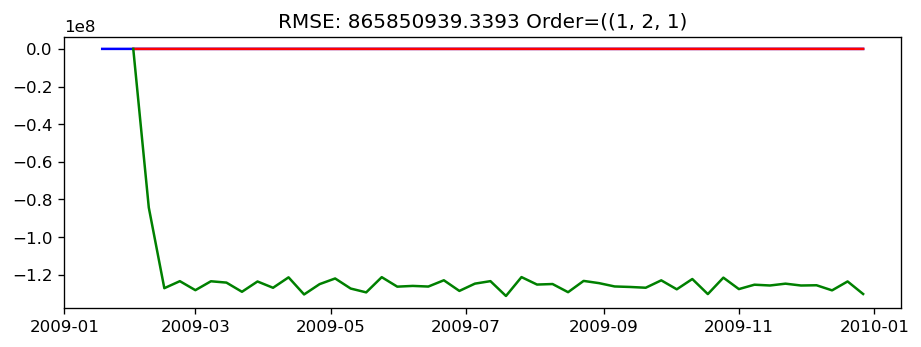

<Figure size 1200x500 with 0 Axes>

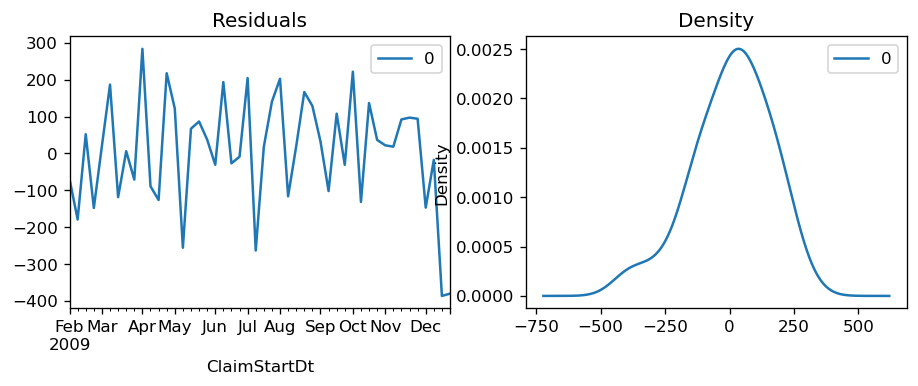

In [132]:
p=1
d=2
q=1

ord=(p,d,q)

model = ARIMA(df, order=ord)
model_fit = model.fit(disp=0)
print(model_fit.summary())


plt.plot(df, color='blue')
plt.plot(model_fit.fittedvalues, color='red')

plt.title('RSS: %.4f'% sum((model_fit.fittedvalues-df)**2))

predictions_diff = pd.Series(model_fit.fittedvalues, copy=True)
predictions_diff_cumsum = predictions_diff.cumsum()

predictions = pd.Series(df[0], index=df.index)
predictions = predictions.add(predictions_diff_cumsum,fill_value=0)

predictions =  pd.DataFrame(model.predict(df))
predictions.index=df.index[d:]
plt.plot(predictions, color='green')

plt.title('RMSE: %.4f'% np.sqrt(sum((predictions.values-df[1:].values)**2)/len(predictions)) + ' Order=('+str(ord))


residuals = pd.DataFrame(model_fit.resid)

plt.figure(figsize=(12,5), dpi=100)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

#### tried other transformation data, but the std and aic are quite larger than original dataset, so I will stick to original data set

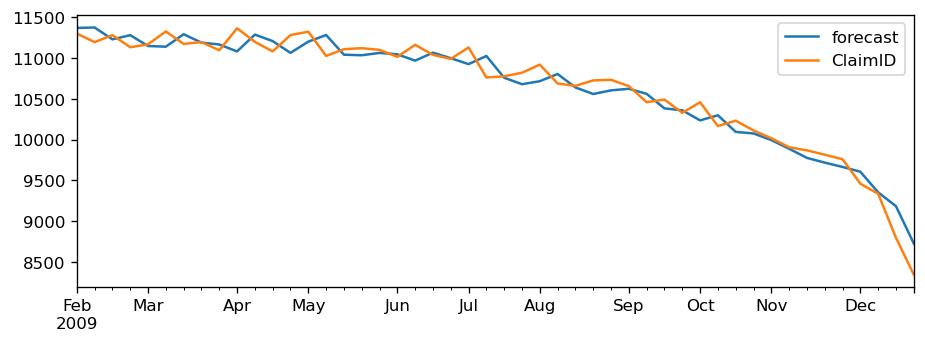

In [133]:
model_fit.plot_predict(dynamic=False)
plt.show()

In [134]:
### Forecasting

                             ARIMA Model Results                              
Dep. Variable:              D.ClaimID   No. Observations:                   34
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -209.472
Method:                       css-mle   S.D. of innovations            113.516
Date:                Fri, 17 Jun 2022   AIC                            426.944
Time:                        13:32:36   BIC                            433.050
Sample:                    01-25-2009   HQIC                           429.026
                         - 09-13-2009                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -19.4354      6.628     -2.932      0.003     -32.426      -6.444
ar.L1.D.ClaimID    -0.1098      0.213     -0.515      0.606      -0.528       0.308
ma.L1.D.ClaimID    -0.6440      

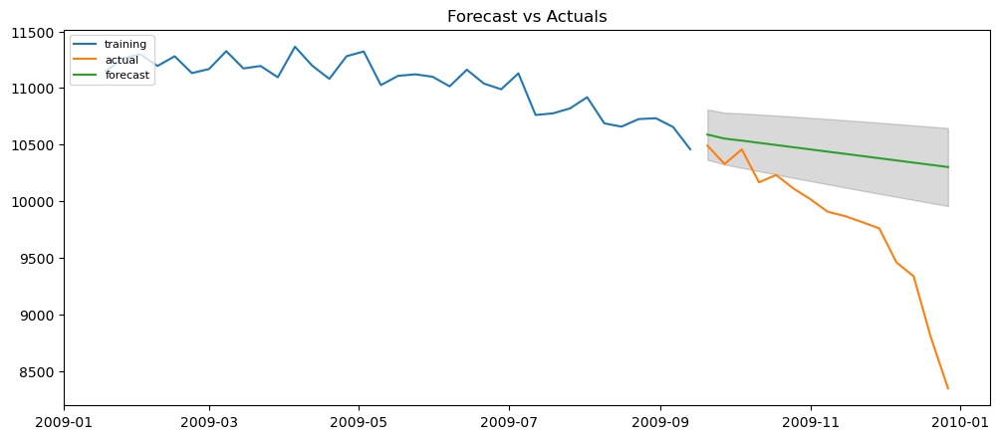

In [135]:
## seperate data into Train and Test data sets, use Test data to forecast
from statsmodels.tsa.stattools import acf

# Create Training and Test
ts_train = df[:35]
ts_test = df[35:]

model = ARIMA(ts_train, order=(1, 1, 1))  
fitted = model.fit(disp=-1)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(len(ts_test), alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=ts_test.index)
lower_series = pd.Series(conf[:, 0], index=ts_test.index)
upper_series = pd.Series(conf[:, 1], index=ts_test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(ts_train, label='training')
plt.plot(ts_test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

<div class="alert-warning">
    <b>Findings: </b> 
    <li> <font color='red'>From the Stationary Testing, log transformation will give a best p-value</font> </li>
    <li> <font color='red'>The AIC and Standard Deviation for log Transformation is huge, so we switched to original dataset</font> </li>
    <li> <font color='red'>Model with order=(1,2,1) will give a best AIC value. </font> </li>
    <li> <font color='red'>The time series pattern for outpatient are similar to the overall pattern, but for inpatient, the pattern is not obvious, so I will check the time series pattern for outpatient and inpatient seperately.   </font> </li>
</div>

## Outpatient Time Series

                             ARIMA Model Results                              
Dep. Variable:             D2.ClaimID   No. Observations:                   48
Model:                 ARIMA(2, 2, 1)   Log Likelihood                -301.654
Method:                       css-mle   S.D. of innovations            127.427
Date:                Fri, 17 Jun 2022   AIC                            613.307
Time:                        13:32:37   BIC                            622.663
Sample:                    02-01-2009   HQIC                           616.843
                         - 12-27-2009                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -5.8849      3.788     -1.554      0.120     -13.308       1.539
ar.L1.D2.ClaimID    -0.5275      0.244     -2.166      0.030      -1.005      -0.050
ar.L2.D2.ClaimID    -0.1581 

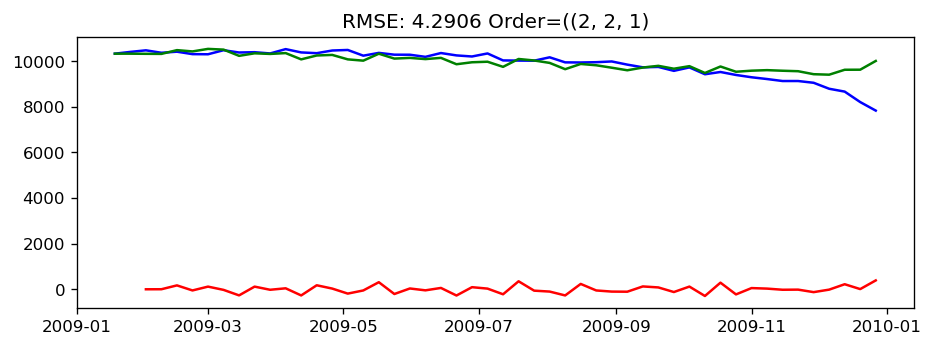

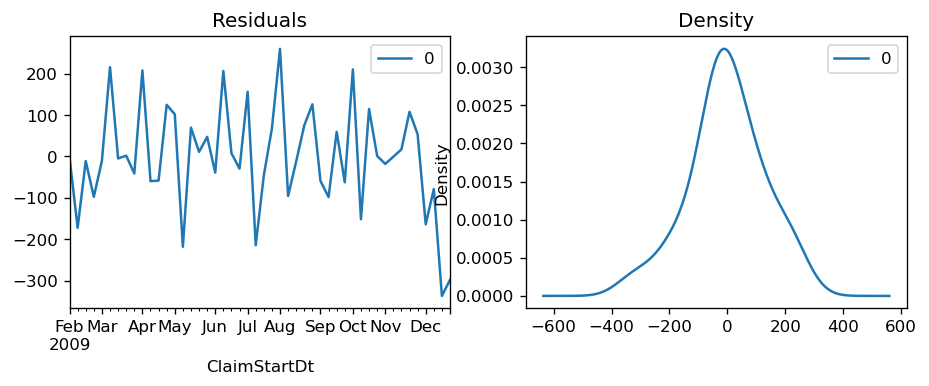

In [136]:
df=ts_weekly_group.loc['Outpatient'].groupby('ClaimStartDt')['ClaimID'].sum()
df=df[(df.index > dateutil.parser.parse("2009-01-11"))
   & (df.index < dateutil.parser.parse("2010-01-01"))]

ord=(2,2,1)
model_arima = ARIMA(df, order=ord)  
results_ARIMA = model_arima.fit(disp=0)  

plt.plot(df, color='blue')
plt.plot(results_ARIMA.fittedvalues, color='red')

plt.title('RSS: %.4f'% sum((results_ARIMA.fittedvalues-df)**2))

predictions_diff = pd.Series(results_ARIMA.fittedvalues, copy=True)
predictions_diff_cumsum = predictions_diff.cumsum()

predictions = pd.Series(df[0], index=df.index)
predictions = predictions.add(predictions_diff_cumsum,fill_value=0)

plt.plot(predictions, color='green')

plt.title('RMSE: %.4f'% np.sqrt(sum((predictions-df)**2)/len(ts)) + ' Order=('+str(ord))

model = ARIMA(df, order=ord)
model_fit = model.fit(disp=0)
print(model_fit.summary())
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

- Checking Differencing Term (d)

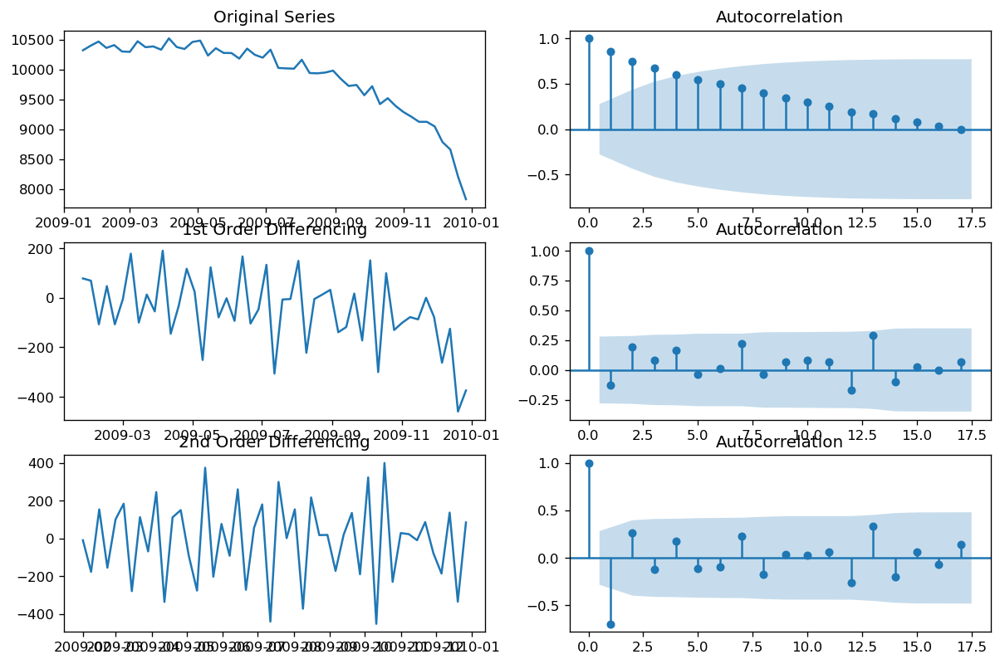

The differencing given by adf, kpss and pp tests:
2 2 1


In [137]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plt.rcParams.update({'figure.figsize':(12,8), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex=False)
axes[0, 0].plot(df); 
axes[0, 0].set_title('Original Series')
plot_acf(df, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df.diff()); 
axes[1, 0].set_title('1st Order Differencing')
plot_acf(df.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df.diff().diff()); 
axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

# with different tests
y=df
## Adf Test
adf=ndiffs(y, test='adf')  # 2

# KPSS test
kpss=ndiffs(y, test='kpss')  # 2

# PP test:
pp=ndiffs(y, test='pp')  # 1

print('The differencing given by adf, kpss and pp tests:')
print(adf,kpss,pp)

- Check AR Term (p)

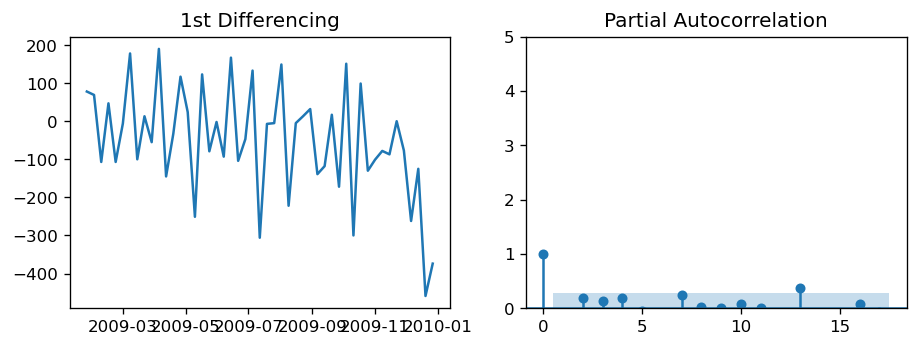

In [138]:
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2, sharex=False)
axes[0].plot(df.diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,5))
plot_pacf(df.diff().dropna(), ax=axes[1])

plt.show()

- Check MA Term (q)

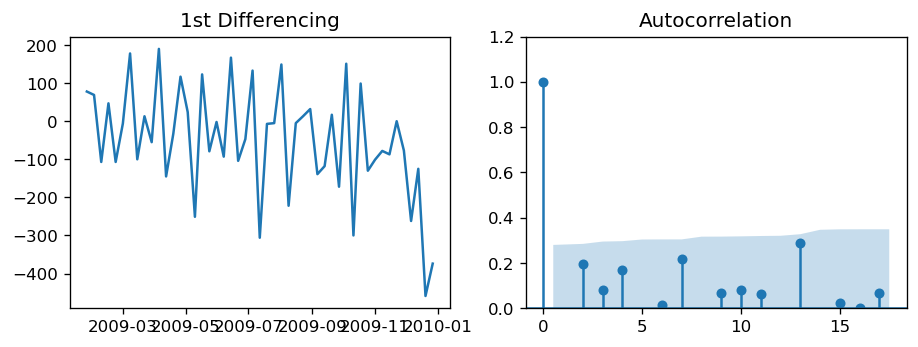

In [139]:
fig, axes = plt.subplots(1, 2, sharex=False)
axes[0].plot(df.diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,1.2))
plot_acf(df.diff().dropna(), ax=axes[1])

plt.show()

#### Best model given by previous analysis is order=(1,1,1)

In [140]:
model = ARIMA(df, order=(1,1,1))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:              D.ClaimID   No. Observations:                   49
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -312.179
Method:                       css-mle   S.D. of innovations            141.411
Date:                Fri, 17 Jun 2022   AIC                            632.359
Time:                        13:32:39   BIC                            639.926
Sample:                    01-25-2009   HQIC                           635.230
                         - 12-27-2009                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -50.8038     18.497     -2.747      0.006     -87.058     -14.550
ar.L1.D.ClaimID    -0.6159      0.414     -1.486      0.137      -1.428       0.196
ma.L1.D.ClaimID     0.4776      

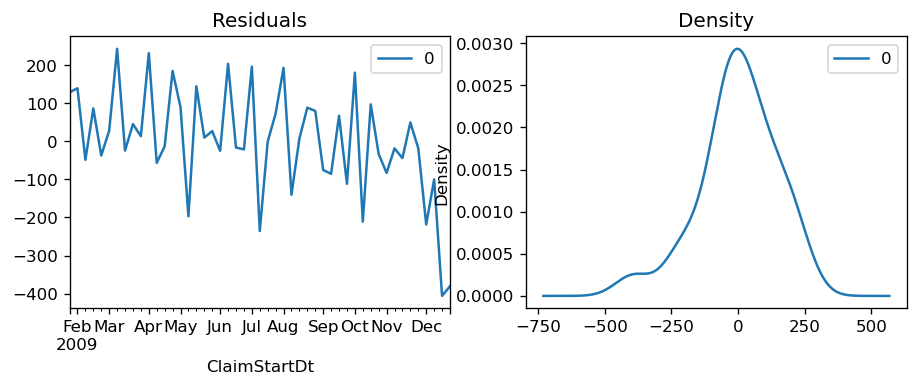

In [141]:
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

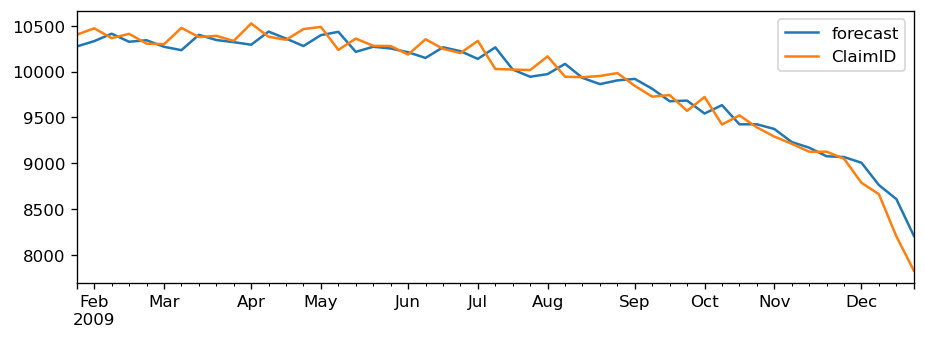

In [142]:
model_fit.plot_predict(dynamic=False)
plt.show()

                             ARIMA Model Results                              
Dep. Variable:              D.ClaimID   No. Observations:                   34
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -204.907
Method:                       css-mle   S.D. of innovations             99.445
Date:                Fri, 17 Jun 2022   AIC                            417.813
Time:                        13:32:40   BIC                            423.919
Sample:                    01-25-2009   HQIC                           419.896
                         - 09-13-2009                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -17.0072      6.795     -2.503      0.012     -30.325      -3.690
ar.L1.D.ClaimID    -0.1303      0.224     -0.582      0.561      -0.569       0.309
ma.L1.D.ClaimID    -0.5694      

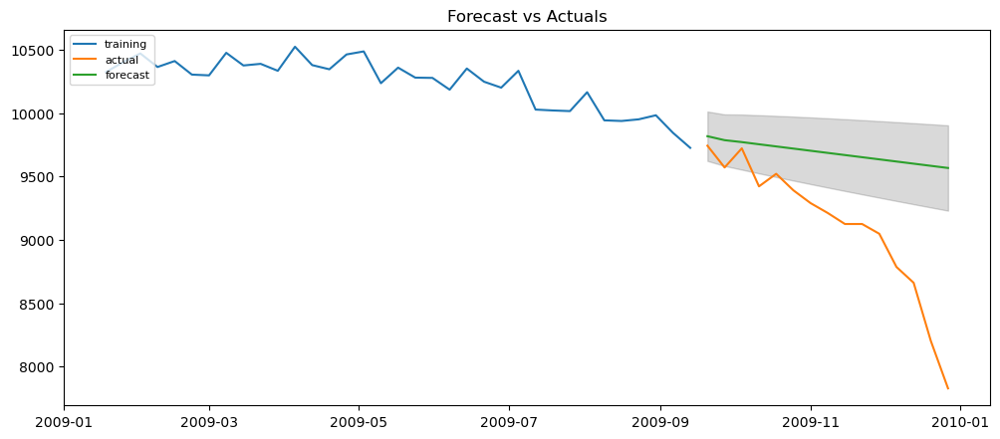

In [143]:
## seperate data into Train and Test data sets, use Test data to forecast
from statsmodels.tsa.stattools import acf

# Create Training and Test
ts_train = df[:35]
ts_test = df[35:]

model = ARIMA(ts_train, order=(1, 1, 1))  
fitted = model.fit(disp=-1)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(15, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=ts_test.index)
lower_series = pd.Series(conf[:, 0], index=ts_test.index)
upper_series = pd.Series(conf[:, 1], index=ts_test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(ts_train, label='training')
plt.plot(ts_test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

                             ARIMA Model Results                              
Dep. Variable:              D.ClaimID   No. Observations:                   34
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -204.038
Method:                       css-mle   S.D. of innovations             96.660
Date:                Fri, 17 Jun 2022   AIC                            418.075
Time:                        13:32:40   BIC                            425.707
Sample:                    01-25-2009   HQIC                           420.678
                         - 09-13-2009                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -17.0458      6.519     -2.615      0.009     -29.823      -4.269
ar.L1.D.ClaimID    -0.3746      0.266     -1.410      0.159      -0.895       0.146
ar.L2.D.ClaimID    -0.3044      

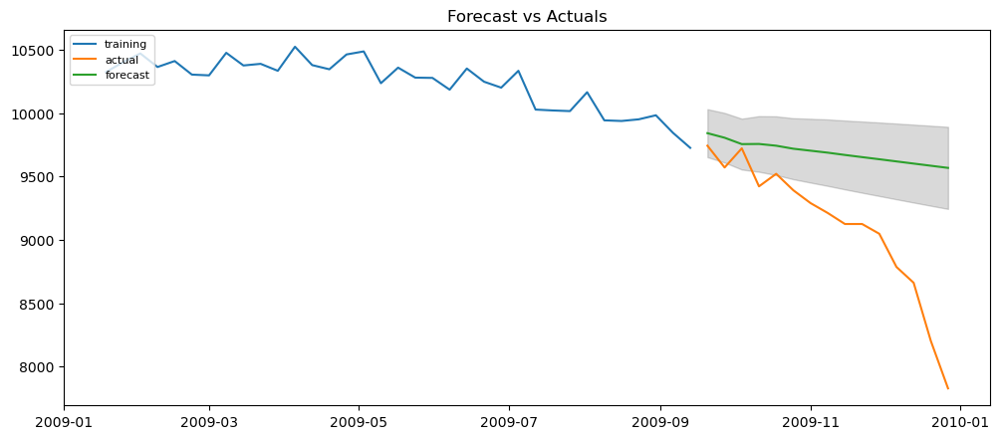

In [144]:
## try order=(2,1,1)
# Build Model
model = ARIMA(ts_train, order=(2, 1, 1))  
fitted = model.fit(disp=-1)  
print(fitted.summary())

# Forecast
fc, se, conf = fitted.forecast(15, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=ts_test.index)
lower_series = pd.Series(conf[:, 0], index=ts_test.index)
upper_series = pd.Series(conf[:, 1], index=ts_test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(ts_train, label='training')
plt.plot(ts_test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()



- order=(1,1,1) gives better AIC

#### Accuracy metrics

In [145]:
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    acf1 = acf(fc-actual)[1]                      # ACF1
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'acf1':acf1, 
            'corr':corr, 'minmax':minmax})

In [146]:
model = ARIMA(ts_train, order=(1, 1, 1))  
fitted = model.fit(disp=-1)  
# Forecast
fc, se, conf = fitted.forecast(15, alpha=0.05)  # 95% conf
forecast_accuracy(fc, ts_test)

{'mape': 0.0666876048934991,
 'me': 577.0798593123138,
 'mae': 577.0798593123138,
 'mpe': 0.0666876048934991,
 'rmse': 736.8789754499041,
 'acf1': 0.6554607703061561,
 'corr': 0.9226058461665297,
 'minmax': 0.05989876633184221}

In [147]:
model = ARIMA(ts_train, order=(2, 1, 1))  
fitted = model.fit(disp=-1)  
# Forecast
fc, se, conf = fitted.forecast(15, alpha=0.05)  # 95% conf
forecast_accuracy(fc, ts_test)

{'mape': 0.0669833816219149,
 'me': 579.8775779102616,
 'mae': 579.8775779102616,
 'mpe': 0.0669833816219149,
 'rmse': 738.0890471118726,
 'acf1': 0.6539443522028632,
 'corr': 0.902746305361038,
 'minmax': 0.060175023208398404}

In [148]:
model = ARIMA(ts_train, order=(2, 2, 1))  
fitted = model.fit(disp=-1)  
# Forecast
fc, se, conf = fitted.forecast(15, alpha=0.05)  # 95% conf
forecast_accuracy(fc, ts_test)

{'mape': 0.029064831601637902,
 'me': 233.94391627699613,
 'mae': 247.19811262609048,
 'mpe': 0.027701651888679516,
 'rmse': 375.51603223800873,
 'acf1': 0.5411746935320434,
 'corr': 0.9380530632912695,
 'minmax': 0.02713439191918421}

ord=(2,2,1) gives the smallest rmse

#### auto-arima

In [149]:

model = pm.auto_arima(df, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=615.494, Time=0.17 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=654.446, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=626.949, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=652.540, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=617.365, Time=0.20 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=617.342, Time=0.15 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=615.519, Time=0.12 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=621.416, Time=0.08 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=618.938, Time=0.27 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=616.725, Time=0.05 sec

Best model:  ARIMA(1,2,1)(0,0,0)[0] intercept
Total fit time: 1.240 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   50
Model:     

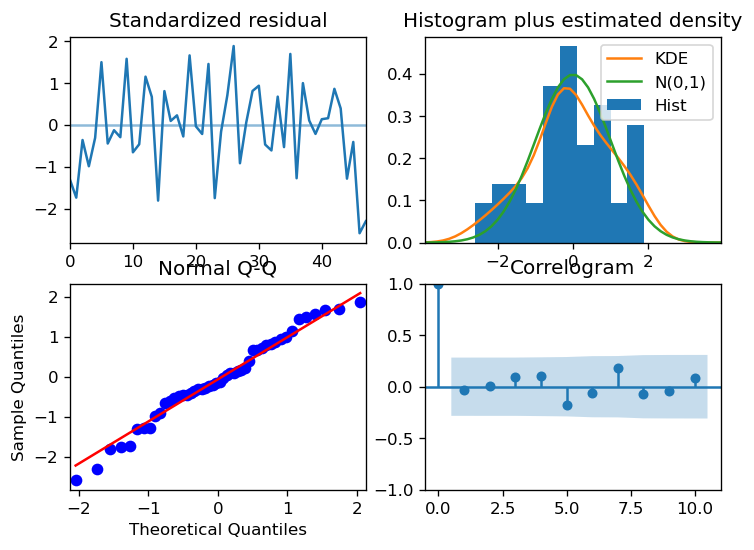

In [150]:
## residual plot
model.plot_diagnostics(figsize=(7,5))
plt.show()

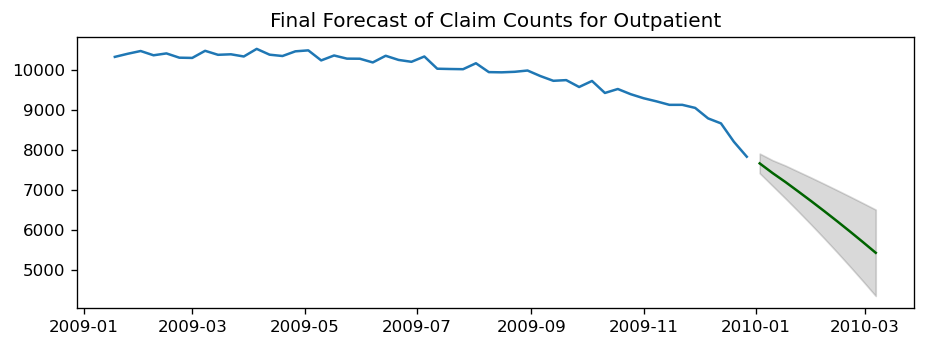

In [151]:
# Forecast
n_periods = 10
fc, confint = model.predict(n_periods=n_periods, return_conf_int=True)
index_of_fc = [df.index[len(df)-1] + timedelta(weeks=i) for i in range(1, n_periods+1)]

# make series for plotting purpose
fc_series = pd.Series(fc, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.plot(df)
plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)

plt.title("Final Forecast of Claim Counts for Outpatient")
plt.show()

#### SARIMA

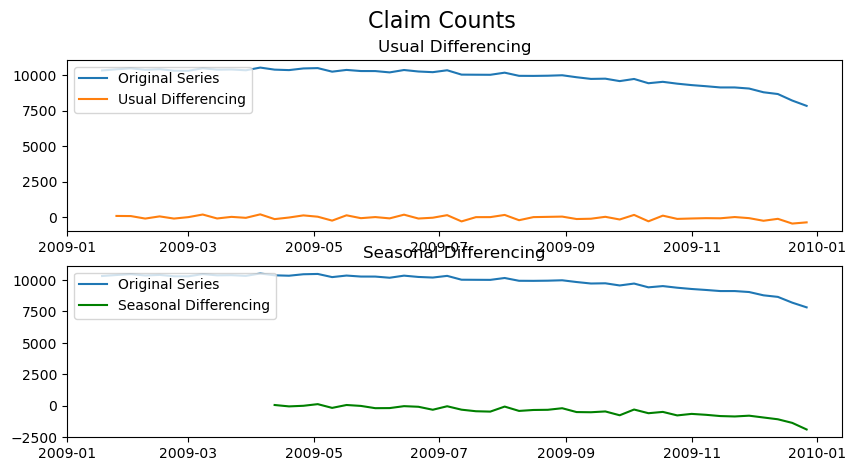

In [152]:
# Plot
fig, axes = plt.subplots(2, 1, figsize=(10,5), dpi=100, sharex=False)

# Usual Differencing
axes[0].plot(df, label='Original Series')
axes[0].plot(df.diff(1), label='Usual Differencing')
axes[0].set_title('Usual Differencing')
axes[0].legend(loc='upper left', fontsize=10)


# Seasinal Dei
axes[1].plot(df, label='Original Series')
axes[1].plot(df.diff(12), label='Seasonal Differencing', color='green')
axes[1].set_title('Seasonal Differencing')
plt.legend(loc='upper left', fontsize=10)
plt.suptitle('Claim Counts', fontsize=16)
plt.show()

In [153]:
# Seasonal - fit stepwise auto-ARIMA
smodel = pm.auto_arima(log(df), start_p=1, start_q=1,
                         test='adf',
                         max_p=3, max_q=3, m=12,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

smodel.summary()

# - For outpatient, SARIMA model(3,2,0)(0,1,1)[12] gives a best AIC of 487.793
# - For outpatient, SARIMA model(0,2,2)(0,1,1)[12] gives a best AIC of AIC=-179.073

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=-137.195, Time=0.22 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=-169.079, Time=0.23 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=-174.708, Time=0.30 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=-164.378, Time=0.24 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=-173.693, Time=0.51 sec
 ARIMA(0,2,1)(0,1,2)[12]             : AIC=-173.608, Time=1.00 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=-174.736, Time=0.31 sec
 ARIMA(0,2,1)(2,1,0)[12]             : AIC=-173.924, Time=1.17 sec
 ARIMA(0,2,1)(2,1,1)[12]             : AIC=-171.675, Time=1.42 sec
 ARIMA(0,2,0)(1,1,0)[12]             : AIC=-150.329, Time=0.26 sec
 ARIMA(1,2,1)(1,1,0)[12]             : AIC=-176.708, Time=0.59 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=-168.635, Time=0.23 sec
 ARIMA(1,2,1)(2,1,0)[12]             : AIC=-175.928, Time=1.04 sec
 ARIMA(1,2,1)(1,1,1)[12]

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                   50
Model:             SARIMAX(0, 2, 2)x(0, 1, [1], 12)   Log Likelihood                  93.536
Date:                              Fri, 17 Jun 2022   AIC                           -179.073
Time:                                      13:33:04   BIC                           -172.739
Sample:                                           0   HQIC                          -176.862
                                               - 50                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.1190      0.197     -5.691      0.000      -1.504      -0.734
ma.L2          0.5025      0.271      1.857      0.063      -0.028       1.033
ma.S.L12      -0.8788      1.711     -0.514      0.607      -4.232       2.474
sigma2         0.0002      0.000      0.619      0.536      -0.000       0.001
===================================================================================
Ljung-Box (L1) (Q):                   0.15   Jarque-Bera (JB):                 0.56
Prob(Q):                              0.70   Prob(JB):                         0.76
Heteroskedasticity (H):               1.36   Skew:                             0.30
Prob(H) (two-sided):                  0.60   Kurtosis:                         3.13
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

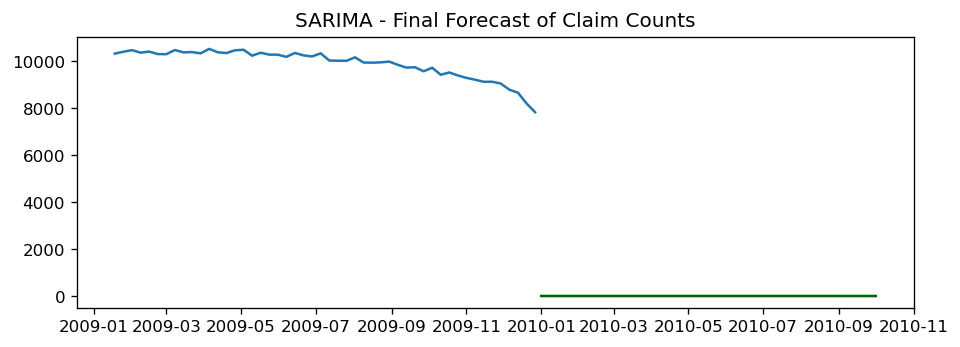

In [154]:
# Forecast
n_periods = 10
fitted, confint = smodel.predict(n_periods=n_periods, return_conf_int=True)
index_of_fc = pd.date_range(df.index[-1], periods = n_periods, freq='MS')

# make series for plotting purpose
fitted_series = pd.Series(fitted, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.plot(df)
plt.plot(fitted_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)

plt.title("SARIMA - Final Forecast of Claim Counts")
plt.show()

In [155]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

# multiplicative seasonal component
result_mul = seasonal_decompose(df,   # 3 years
                                model='multiplicative', 
                                extrapolate_trend='freq',
                                period=1)

seasonal_index = result_mul.seasonal.to_frame()
seasonal_index['month'] = pd.to_datetime(seasonal_index.index).month



In [156]:
# merge with the base data
df_sarima=df.to_frame()
df_sarima.columns

df_sarima = pd.concat([df_sarima, seasonal_index], axis=1)
df_sarima.columns = ['value', 'seasonal_index', 'month']
df_sarima.index = df.index  # reassign the index.

In [157]:
import pmdarima as pm

# SARIMAX Model
sxmodel = pm.auto_arima(df_sarima[['value']], exogenous=df_sarima[['seasonal_index']],
                           start_p=1, start_q=1,
                           test='adf',
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=None, D=1, trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)

sxmodel.summary()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=502.592, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=507.697, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=498.263, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=501.375, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=505.727, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=500.261, Time=0.35 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=500.262, Time=0.23 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=501.075, Time=0.18 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=496.667, Time=0.09 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=498.656, Time=0.32 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=498.663, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=500.131, Time=0.13 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AI

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   50
Model:             SARIMAX(0, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -245.333
Date:                            Fri, 17 Jun 2022   AIC                            496.667
Time:                                    13:33:08   BIC                            501.500
Sample:                                01-18-2009   HQIC                           498.371
                                     - 12-27-2009                                         
Covariance Type:                              opg                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
seasonal_index    -0.0064   6.94e+04  -9.29e-08      1.000   -1.36e+05    1.36e+05
ar.S.L12          -0.5659      0.125     -4.514      0.000      -0.812      -0.320
sigma2          3.022e+04   7037.714      4.293      0.000    1.64e+04     4.4e+04
===================================================================================
Ljung-Box (L1) (Q):                   2.47   Jarque-Bera (JB):                 0.10
Prob(Q):                              0.12   Prob(JB):                         0.95
Heteroskedasticity (H):               2.46   Skew:                            -0.11
Prob(H) (two-sided):                  0.13   Kurtosis:                         3.11
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

100


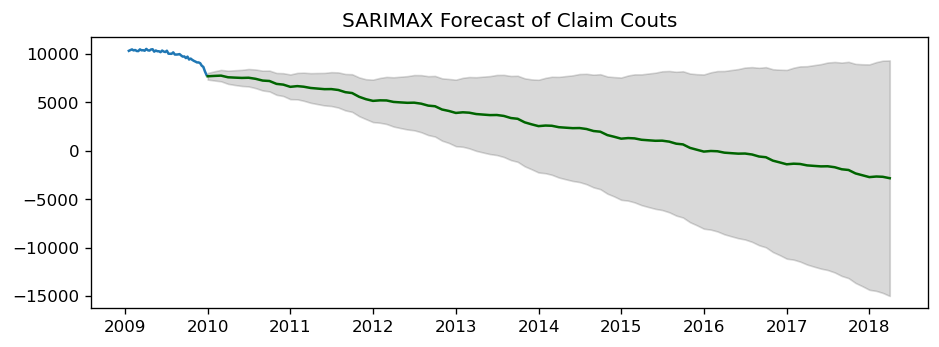

In [158]:
# Forecast
row, col=np.tile(seasonal_index.seasonal, 2).reshape(-1,1).shape
n_periods = row
print(row)
fitted, confint = sxmodel.predict(n_periods=n_periods, 
                                  exogenous=np.tile(seasonal_index.seasonal, 2).reshape(-1,1), 
                                  return_conf_int=True)

index_of_fc = pd.date_range(df.index[-1], periods = n_periods, freq='MS')

# make series for plotting purpose
fitted_series = pd.Series(fitted, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.plot(df)
plt.plot(fitted_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)

plt.title("SARIMAX Forecast of Claim Couts")
plt.show()

## Inpatient

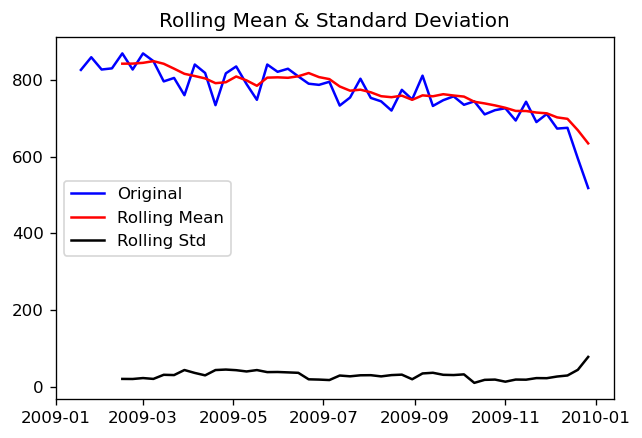

Results of Dickey-Fuller Test:
Test Statistic                  1.545383
p-value                         0.997684
#Lags Used                      3.000000
Number of Observations Used    46.000000
Critical Value (1%)            -3.581258
Critical Value (5%)            -2.926785
Critical Value (10%)           -2.601541
dtype: float64
Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-131.731, Time=0.10 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-90.058, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=-111.843, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=-128.317, Time=0.06 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-132.439, Time=0.14 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-122.232, Time=0.05 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-131.209, Time=0.09 sec
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=-131.008, Time=0.19 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-132.311, Time=0.16 sec
 ARIMA(3,2,0)(0,0,0)[0]        

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   50
Model:               SARIMAX(2, 2, 1)   Log Likelihood                  71.285
Date:                Fri, 17 Jun 2022   AIC                           -132.569
Time:                        13:33:12   BIC                           -123.213
Sample:                             0   HQIC                          -129.034
                                 - 50                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0011      0.001     -0.804      0.421      -0.004       0.002
ar.L1         -0.4846      0.205     -2.363      0.018      -0.887      -0.083
ar.L2         -0.2628      0.171     -1.536      0.125      -0.598       0.073
ma.L1         -0.9873      0.551     -1.792      0.073      -2.067       0.092
sigma2         0.0027      0.001      2.002      0.045    5.69e-05       0.005
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                 2.90
Prob(Q):                              0.77   Prob(JB):                         0.23
Heteroskedasticity (H):               1.38   Skew:                            -0.46
Prob(H) (two-sided):                  0.53   Kurtosis:                         3.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

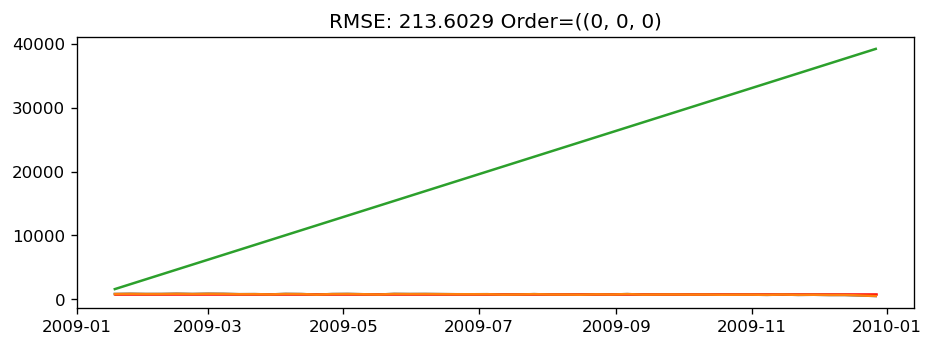

In [159]:
# Inpatient

df=ts_weekly_group.loc['Inpatient'].groupby('ClaimStartDt')['ClaimID'].sum()
df=df[(df.index > dateutil.parser.parse("2009-01-11"))
   & (df.index < dateutil.parser.parse("2010-01-01"))]
df=df.astype(float)
test_stationarity(df,5)

ts_log = np.log(df)

ord=(0,0,0)
model_arima = ARIMA(df, order=ord)  
results_ARIMA = model_arima.fit(disp=-1)  
plt.plot(df)
plt.plot(results_ARIMA.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_ARIMA.fittedvalues-df)**2))

predictions_diff = pd.Series(results_ARIMA.fittedvalues, copy=True)
predictions_diff_cumsum = predictions_diff.cumsum()

predictions= pd.Series(df[0], index=df.index)
predictions= predictions.add(predictions_diff_cumsum,fill_value=0)

plt.plot(df)
plt.plot(predictions)

plt.title('RMSE: %.4f'% np.sqrt(sum((predictions-df)**2)/len(ts)) + ' Order=('+str(ord))

# RMSE: 1.5184 Order=((2, 1, 1)
# RMSE: 1.4246 Order=((4, 1, 1)
# RMSE: 1.4134 Order=((5, 1, 1)
# RMSE: 1.4760 Order=((6, 1, 1)
# RMSE: 1.4086 Order=((5, 1, 2)
# RMSE: 1.2766 Order=((5, 1, 4)
# RMSE: 1.6909 Order=((5, 1, 5)
# RMSE: 1.1377 Order=((0, 1, 0)
# RMSE: 1.5260 Order=((3, 1, 0)

def arimamodel(timeseriesarray):
    autoarima_model = pm.auto_arima(timeseriesarray, 
                              start_p=1, 
                              start_q=1,
                              test="adf",         
                              seasonal=True,  
                              m=1,
                              trace=True)
    return autoarima_model


arima_model = arimamodel(log(df))
arima_model.summary()

In [160]:

def arimamodel(timeseriesarray):
    autoarima_model = pm.auto_arima(timeseriesarray, 
                              start_p=1, 
                              start_q=1,
                              test="adf",         
                              seasonal=True,  
                              m=12,
                              trace=True)
    return autoarima_model


arima_model = arimamodel(df)
arima_model.summary()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=506.769, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=512.049, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=506.662, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=502.919, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=511.077, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=502.125, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=502.954, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=504.788, Time=0.31 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=504.114, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=504.107, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=506.231, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=504.190, Time=0.02 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 1.523 seconds


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   50
Model:               SARIMAX(0, 1, 1)   Log Likelihood                -248.062
Date:                Fri, 17 Jun 2022   AIC                            502.125
Time:                        13:33:13   BIC                            507.800
Sample:                             0   HQIC                           504.278
                                 - 50                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -5.2031      2.399     -2.169      0.030      -9.904      -0.502
ma.L1         -0.6006      0.139     -4.314      0.000      -0.873      -0.328
sigma2      1447.1795    306.894      4.716      0.000     845.678    2048.681
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 3.43
Prob(Q):                              0.99   Prob(JB):                         0.18
Heteroskedasticity (H):               1.17   Skew:                            -0.52
Prob(H) (two-sided):                  0.76   Kurtosis:                         3.79
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<div class="alert-warning">
    <b>Findings: </b> 
    <li> <font color='red'>For outpatient,  SARIMA model(3,2,0)(0,1,1)[12] gives a best AIC of 487.793</font> </li>
    <li> <font color='red'>For outpatient, SARIMA model(0,2,2)(0,1,1)[12] gives a best AIC of AIC 179.073 after log scaled the datasets.</font> </li>
    <li> <font color='red'>For inpatient, ARIMA model(0,1,1)(0,0,0) gives a best AIC of 504.190. The seasonality terms are not significant for inpatient. </font> </li>
    <li> <font color='red'>For inpatient, ARIMA model(2,2,1)(0,0,0) gives a best AIC of 132.439  after log scaled the datasets. The seasonality terms are not significant for inpatient. </font> </li>
</div>

- Test AICs 

In [161]:

def plot_weekly_by_attribute(df, attribute, feature, log_scale=''):    
    if log_scale=='':
        df_group=df.groupby(['Category', attribute]).resample('W').count()[feature]
    else:
        df_group=np.log(df.groupby(['Category', attribute]).resample('W').count()[feature])
    
    category_list=df_group.index.get_level_values(0).unique().tolist()
    
    for l in category_list:        
        fig, ax = plt.subplots(figsize = (15, 6))
        
        df_attribute=df_group.loc[l]        
        
        attribute_list=df_attribute.index.get_level_values(0).unique().tolist()
        cl=color_list(len(attribute_list))
        i=0
        for a in attribute_list:
            ax.plot(df_attribute.loc[a], 'k--', label=a, color=cl[i])
            i=i+1

        df_all=df_attribute.groupby('ClaimStartDt').sum()
#         ax.plot(df_all, 'k', label='Total', color='blue')
    
        legend = ax.legend(loc='upper left', shadow=True, fontsize='large')

        plt.xlabel('Claim Start Date')
        plt.ylabel('Claim Counts')
        plt.title('Weekly Trend of '+log_scale+' Claim Counts for '+attribute +' ( '+l+' )')

        plt.show()

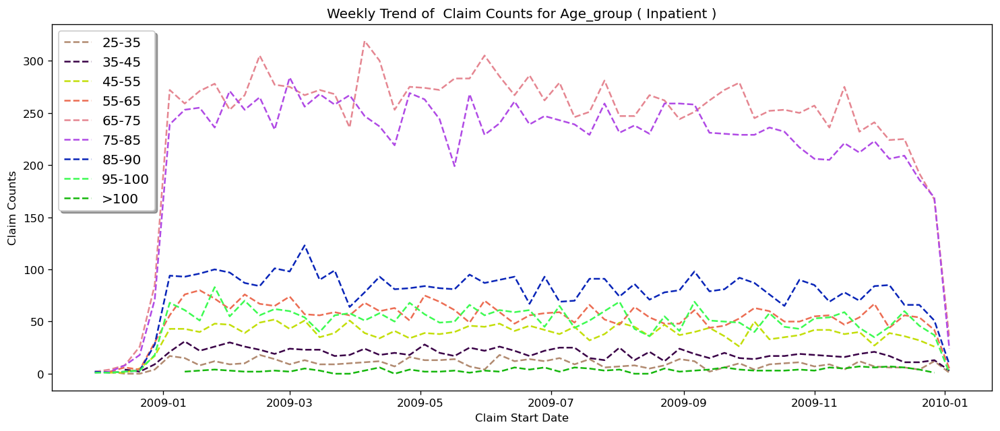

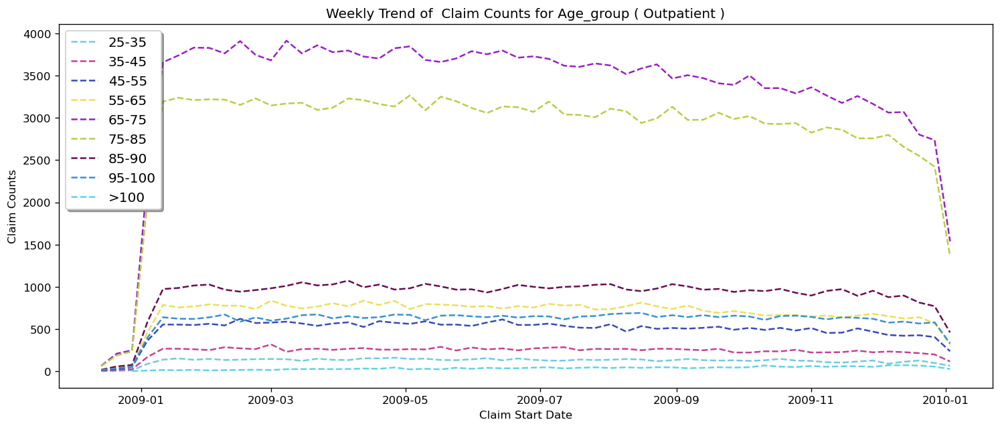

In [162]:
plot_weekly_by_attribute(ts,'Age_group','ClaimID')

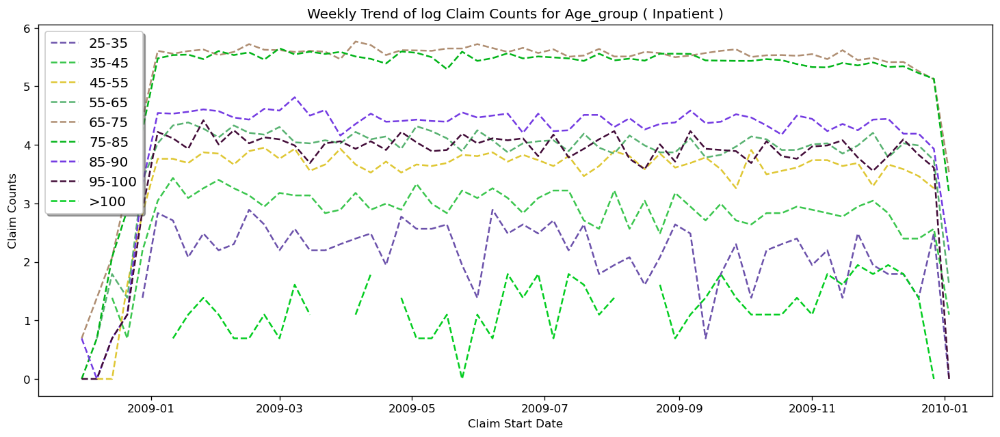

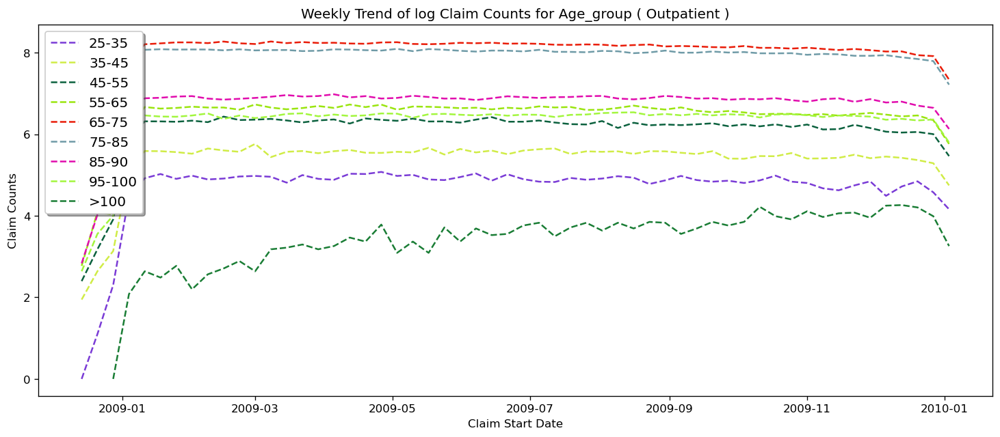

In [163]:
plot_weekly_by_attribute(ts,'Age_group','ClaimID','log')

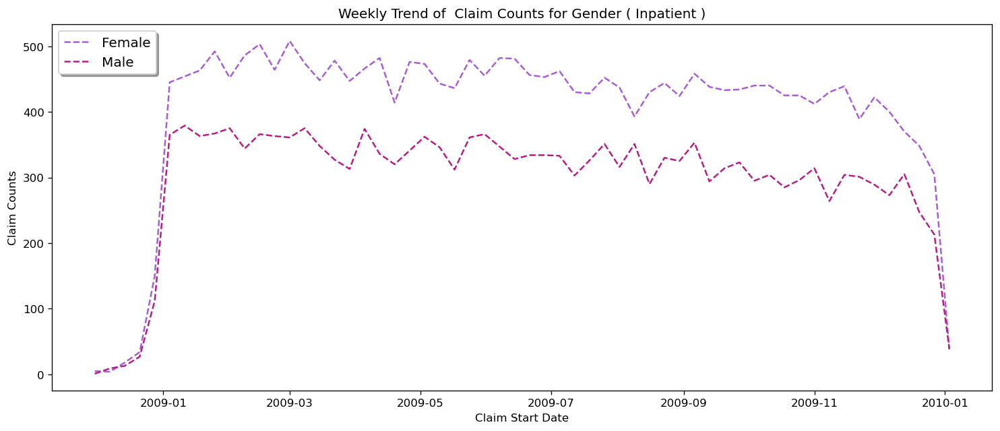

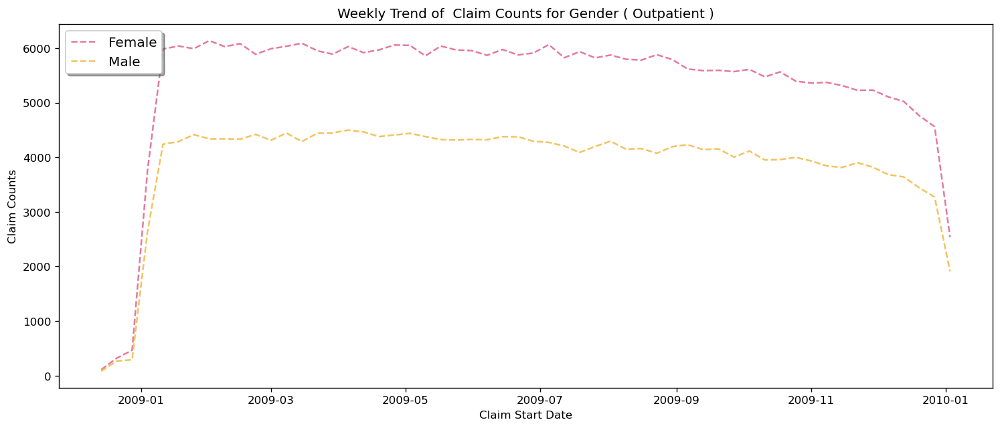

In [164]:
plot_weekly_by_attribute(ts,'Gender','ClaimID')

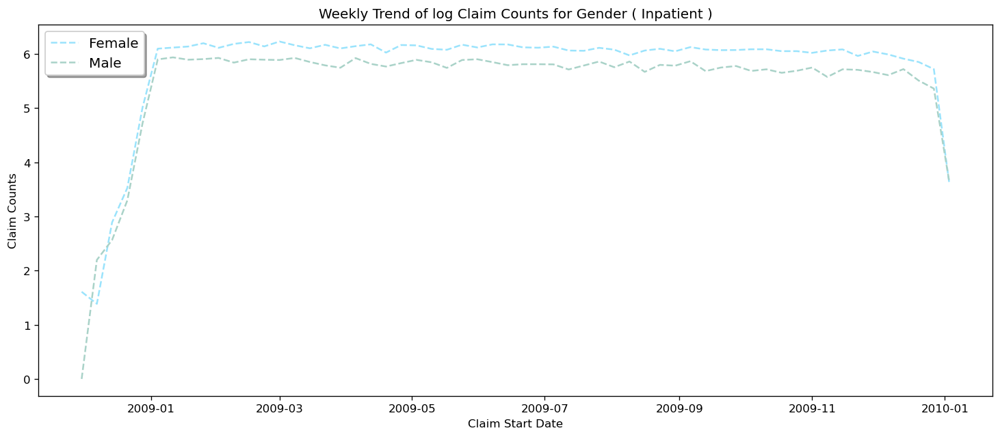

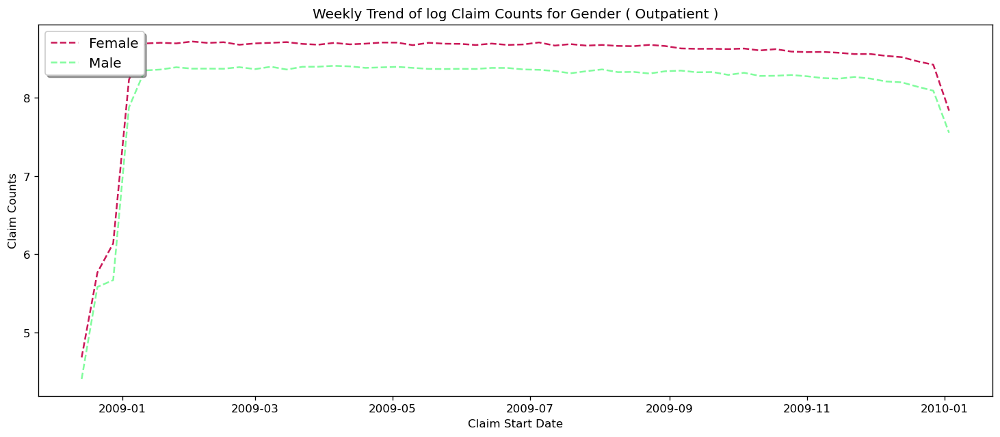

In [165]:
plot_weekly_by_attribute(ts,'Gender','ClaimID', 'log')

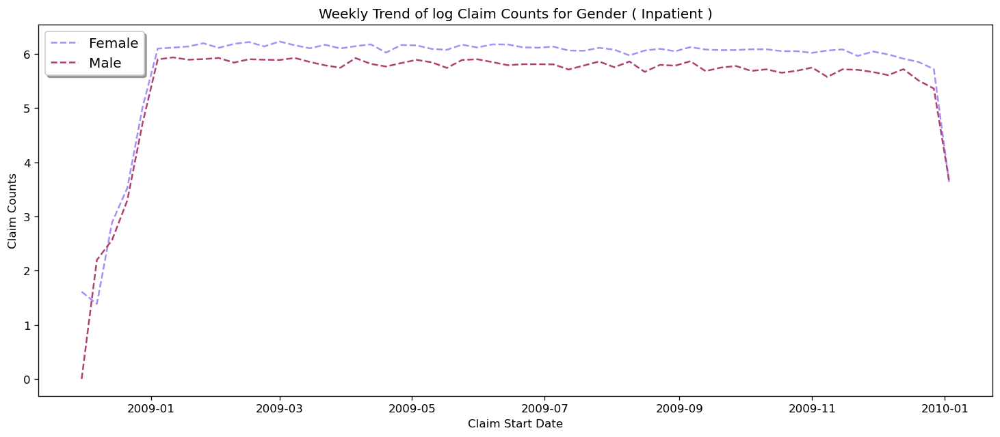

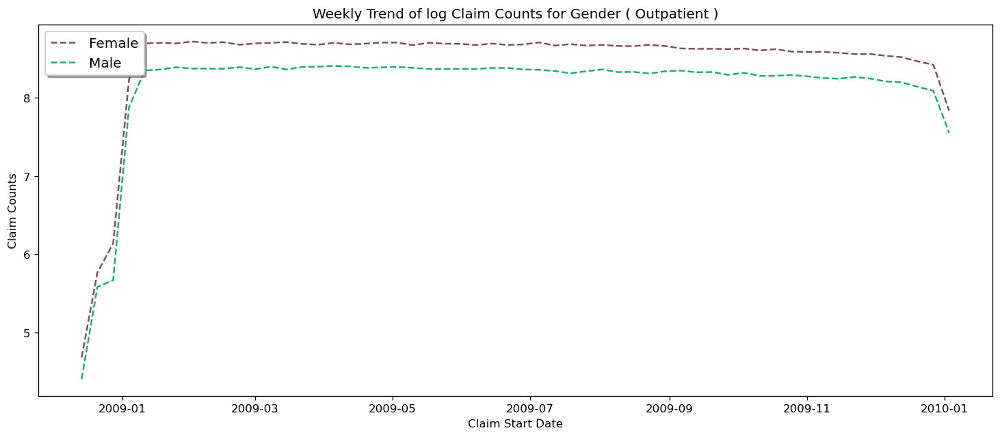

In [166]:
plot_weekly_by_attribute(ts,'Gender','ClaimID', 'log')

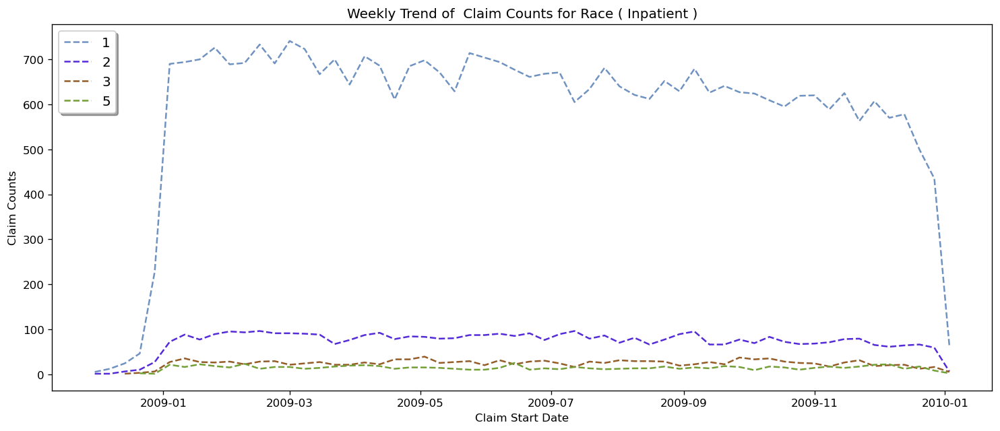

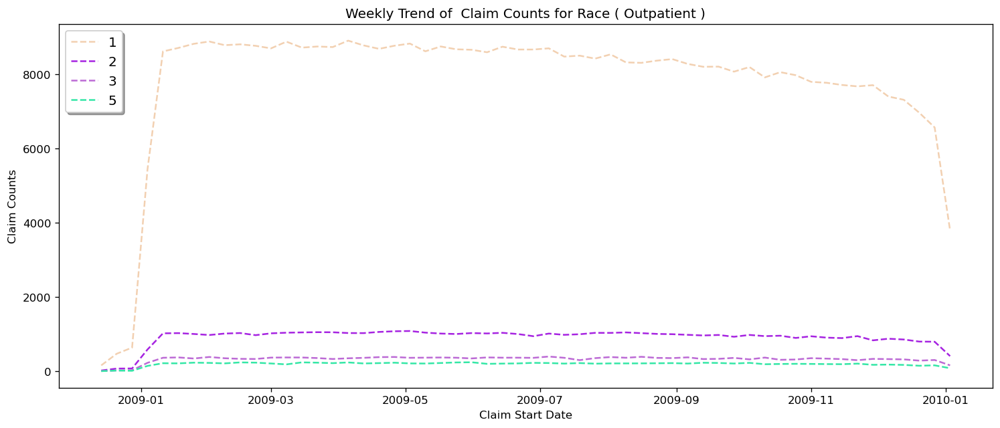

In [167]:
plot_weekly_by_attribute(ts,'Race','ClaimID')

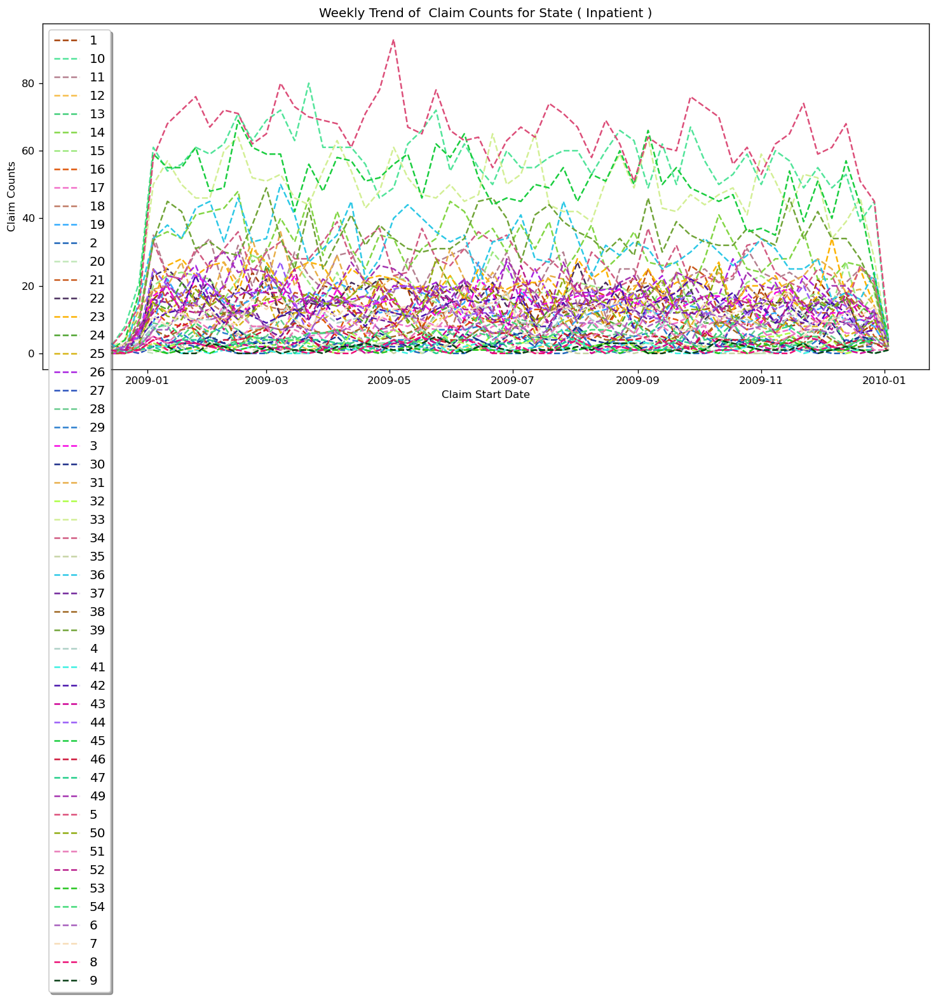

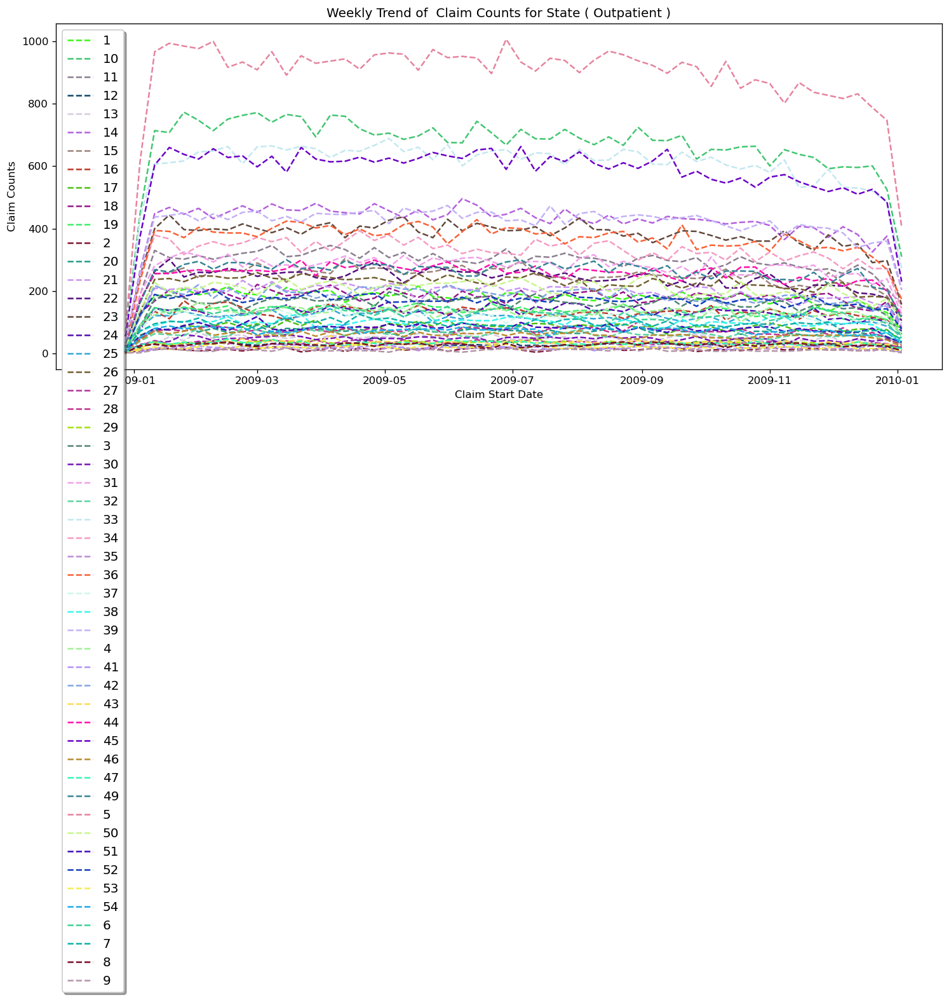

In [168]:
plot_weekly_by_attribute(ts,'State','ClaimID')

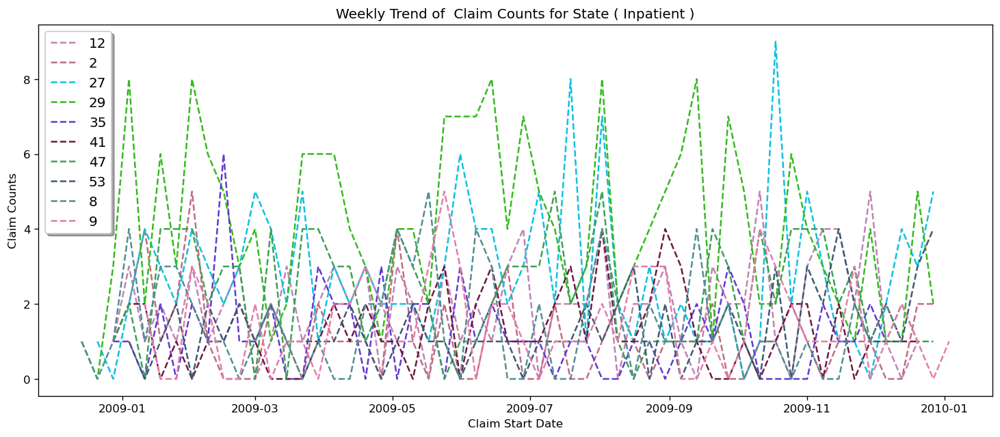

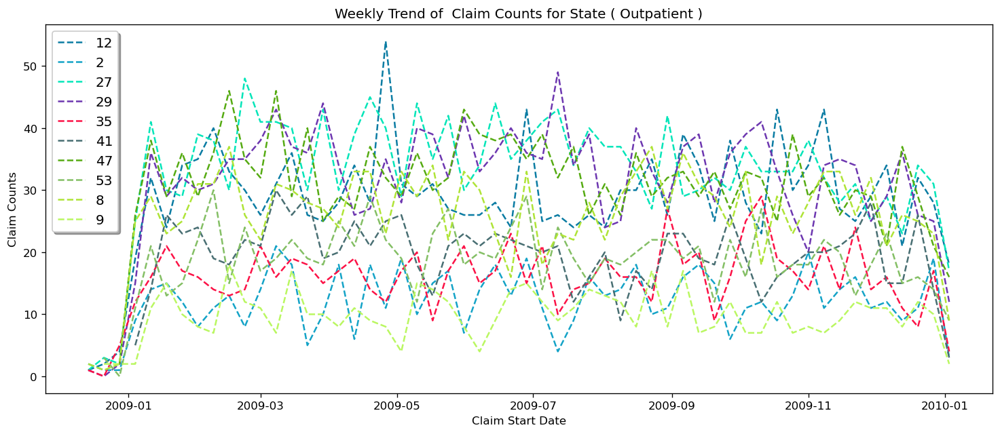

In [169]:
top_state_list=ts.groupby('State').count()['ClaimID'].sort_values().head(10).index.tolist()
ts_state=ts[ts['State'].isin(top_state_list)]
plot_weekly_by_attribute(ts_state,'State','ClaimID')

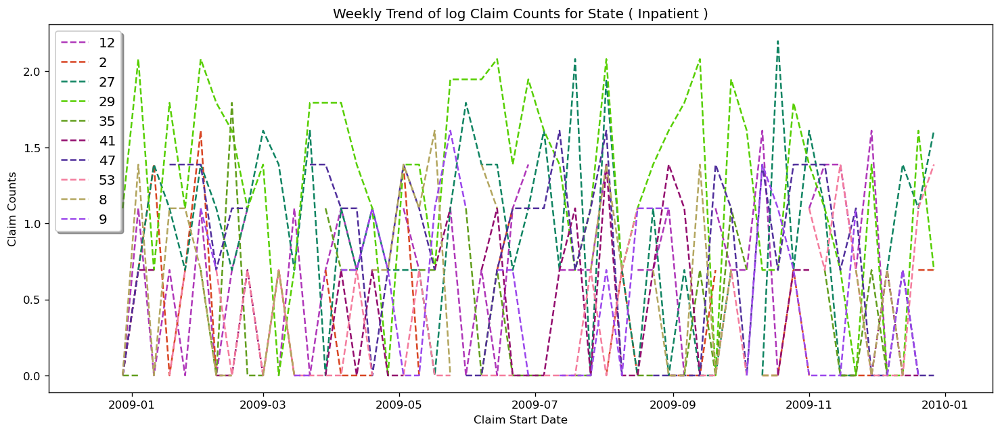

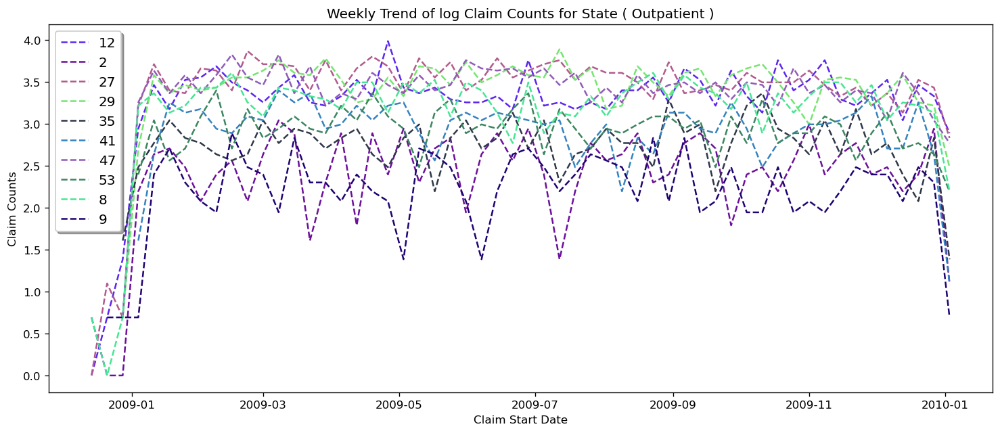

In [170]:
top_state_list=ts.groupby('State').count()['ClaimID'].sort_values().head(10).index.tolist()
ts_state=ts[ts['State'].isin(top_state_list)]
plot_weekly_by_attribute(ts_state,'State','ClaimID','log')

                    sum_sq       df        F    PR(>F)
C(Age_group)  3.584959e+01      9.0  0.12533  0.723326
Residual      1.286046e+06  40464.0      NaN       NaN


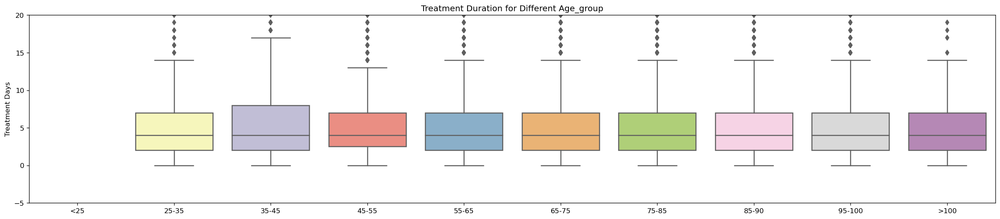

In [171]:
def treatment_duration_plot(df, feature):
    df_treatment_duration=df[df['Category']=='Inpatient']
    fig = plt.figure(figsize=(25,5))
    sns.boxplot(x=feature, y='TreatmentDuration', palette="Set3", data=df_treatment_duration)
    plt.xlabel("")
    plt.ylabel('Treatment Days')
    plt.ylim(-5,20)
    plt.title('Treatment Duration for Different '+feature)

    # Ordinary Least Squares (OLS) model
    model = ols('TreatmentDuration ~ C('+feature+')', data=df_treatment_duration).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    print(anova_table)    
treatment_duration_plot(ts, 'Age_group')

                 sum_sq       df         F    PR(>F)
C(Gender)  2.573926e-01      1.0  0.008096  0.928307
Residual   1.286762e+06  40472.0       NaN       NaN


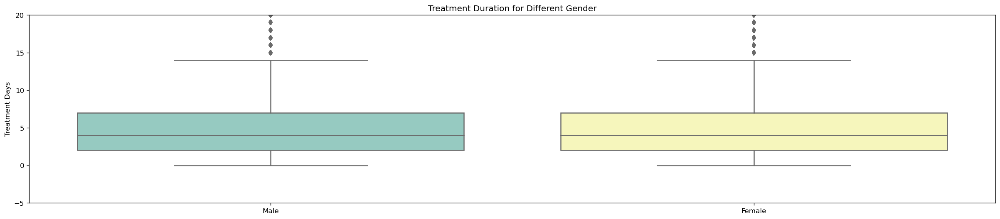

In [172]:
treatment_duration_plot(ts, 'Gender')

                sum_sq       df         F    PR(>F)
C(Race)   2.268936e+02      3.0  2.379098  0.067664
Residual  1.286535e+06  40470.0       NaN       NaN


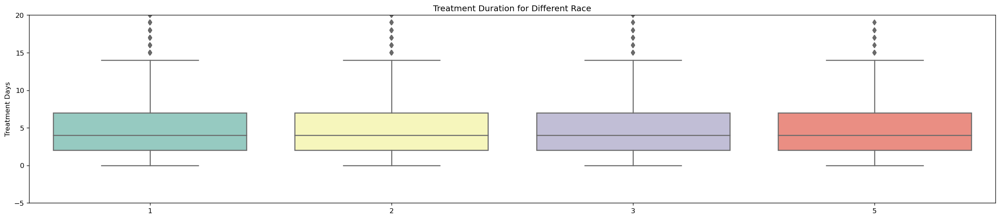

In [173]:
treatment_duration_plot(ts, 'Race')

                         sum_sq       df          F   PR(>F)
C(PotentialFraud)  3.292357e+02      1.0  10.357963  0.00129
Residual           1.286433e+06  40472.0        NaN      NaN


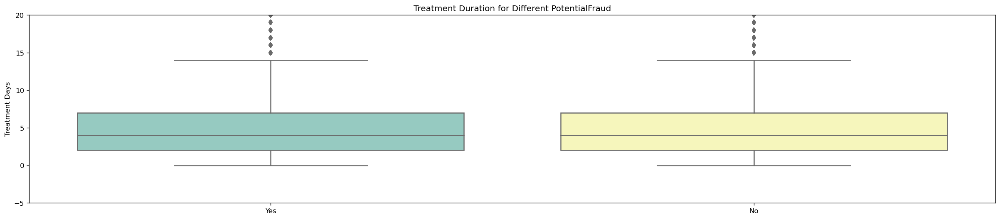

In [174]:
treatment_duration_plot(ts, 'PotentialFraud')

                sum_sq       df         F    PR(>F)
C(State)  1.510140e+03     51.0  0.931272  0.613632
Residual  1.285252e+06  40422.0       NaN       NaN


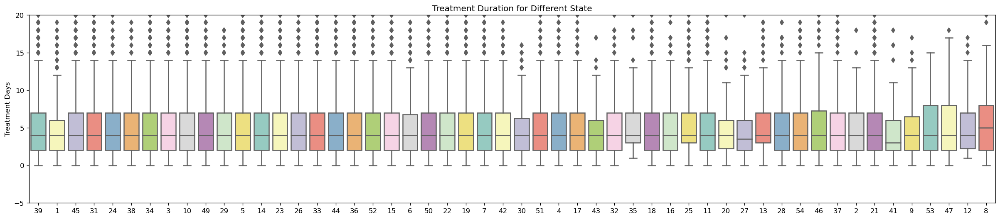

In [175]:
treatment_duration_plot(ts, 'State')

                sum_sq     df         F    PR(>F)
C(State)    240.436762    9.0  0.922585  0.504431
Residual  28812.114482  995.0       NaN       NaN


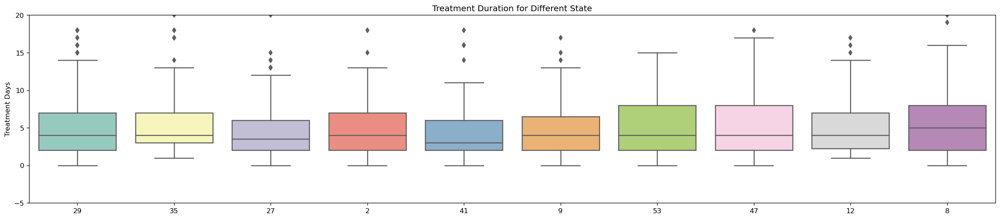

In [176]:
treatment_duration_plot(ts_state, 'State')

<div class="alert-warning">
    <b>Findings: </b> 
    <li> <font color='red'>Treatment duration is significant different within different Race and Whether the claim is suspective of potential frauds</font> </li>
    <li> <font color='red'>Treatment duration is not significant different within different Age group, Gender and States.</font> </li>
</div>

## Monthly Claim Counts

- Monthly Pivot Matrix

In [177]:
df_group=ts.groupby(['Provider','Category']).resample('M').count()['ClaimID'].to_frame().reset_index()
df_month=df_group.pivot(index=['Provider',  'Category' ], columns='ClaimStartDt', values='ClaimID')
df_month

ClaimStartDt         2008-11-30  2008-12-31  2009-01-31  2009-02-28  2009-03-31  2009-04-30  2009-05-31  2009-06-30  2009-07-31  2009-08-31  2009-09-30  2009-10-31  2009-11-30  2009-12-31
Provider Category                                                                                                                                                                          
PRV51001 Inpatient          NaN         NaN         NaN         2.0         0.0         0.0         2.0         0.0         1.0         NaN         NaN         NaN         NaN         NaN
         Outpatient         NaN         NaN         2.0         2.0         3.0         2.0         3.0         3.0         1.0         1.0         1.0         0.0         0.0         2.0
PRV51003 Inpatient          NaN         1.0         6.0         9.0         4.0         6.0         4.0         5.0         6.0         5.0         5.0         5.0         5.0         1.0
         Outpatient         NaN         NaN         7.0         7.0         6.0         4.0         4.0         9.0         5.0         8.0         4.0         6.0         6.0         4.0
PRV51004 Outpatient         NaN         NaN        12.0        19.0        18.0        10.0         8.0        11.0        14.0        10.0        12.0        11.0         8.0        16.0
...                         ...         ...         ...         ...         ...         ...         ...         ...         ...         ...         ...         ...         ...         ...
PRV57759 Outpatient         NaN         NaN         6.0         1.0         2.0         2.0         4.0         3.0         3.0         1.0         2.0         1.0         2.0         1.0
PRV57760 Outpatient         NaN         NaN         1.0         5.0         1.0         1.0         1.0         3.0         0.0         4.0         3.0         0.0         2.0         1.0
PRV57761 Outpatient         NaN         NaN         5.0         6.0         4.0         5.0         8.0        10.0         5.0         5.0         4.0        14.0        11.0         5.0
PRV57762 Outpatient         NaN         NaN         NaN         NaN         NaN         NaN         NaN         NaN         NaN         NaN         1.0         NaN         NaN         NaN
PRV57763 Outpatient         NaN         1.0         8.0         4.0         8.0         5.0        10.0         8.0        13.0        16.0        18.0         9.0        13.0         5.0

[7104 rows x 14 columns]

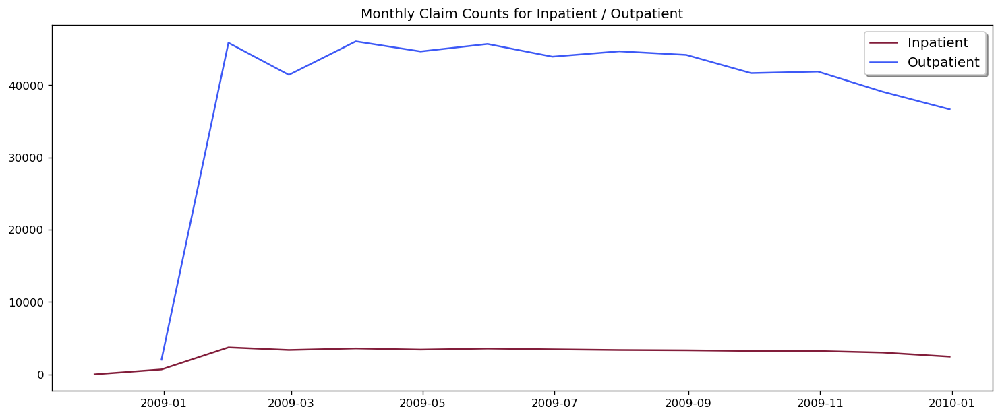

In [178]:
df_inpatient=df_group[df_group['Category']=='Inpatient'].set_index('ClaimStartDt')
df_outpatient=df_group[df_group['Category']=='Outpatient'].set_index('ClaimStartDt')

top_inpatient_providers=ts[ts['Category']=='Inpatient'].groupby('Provider').count() \
        .sort_values(by='ClaimID', ascending=False).head(15).index.tolist()
top_outpatient_providers=ts[ts['Category']=='Outpatient'].groupby('Provider').count() \
        .sort_values(by='ClaimID', ascending=False).head(15).index.tolist()

cl=color_list(15)

fig, ax = plt.subplots(figsize = (15, 6))
df=df_inpatient.groupby('ClaimStartDt')['ClaimID'].sum()
ax.plot(df, 'k', label='Inpatient', color=cl[0])

df=df_outpatient.groupby('ClaimStartDt')['ClaimID'].sum()
ax.plot(df, 'k', label='Outpatient', color=cl[1])

legend = ax.legend(loc='upper right', shadow=True, fontsize='large')
plt.title('Monthly Claim Counts for Inpatient / Outpatient')
plt.show()

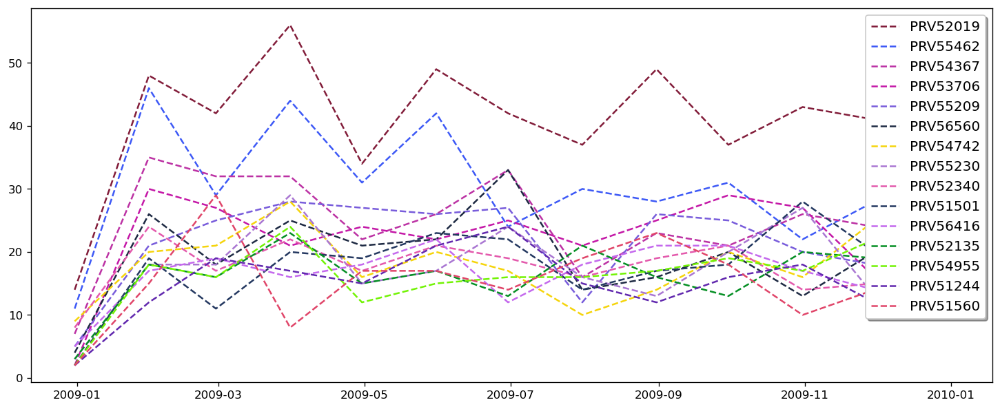

In [179]:
fig, ax = plt.subplots(figsize = (15, 6))

i=0
for l in top_inpatient_providers:   
    df=df_inpatient[df_inpatient['Provider']==l]
    ax.plot(df['ClaimID'], 'k--', label=l, color=cl[i])
    i=i+1
legend = ax.legend(loc='upper right', shadow=True, fontsize='large')
plt.show()


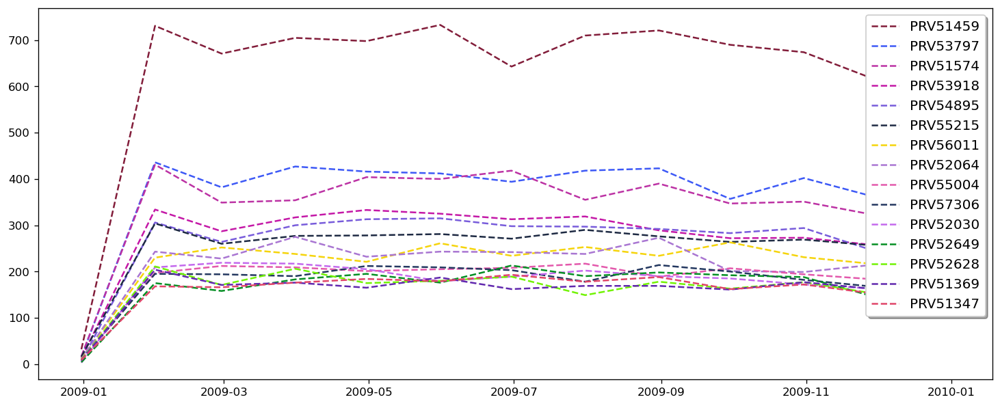

In [180]:
fig, ax = plt.subplots(figsize = (15, 6))

i=0
for l in top_outpatient_providers:   
    df=df_outpatient[df_outpatient['Provider']==l]
    ax.plot(df['ClaimID'], 'k--', label=l, color=cl[i])
    i=i+1
legend = ax.legend(loc='upper right', shadow=True, fontsize='large')
plt.show()

In [181]:
df_month.describe()

ClaimStartDt,2008-11-30,2008-12-31,2009-01-31,2009-02-28,2009-03-31,2009-04-30,2009-05-31,2009-06-30,2009-07-31,2009-08-31,2009-09-30,2009-10-31,2009-11-30,2009-12-31
count,6.0,1492.000000,5194.000000,5858.000000,6185.000000,6367.000000,6463.000000,6477.000000,6450.000000,6383.000000,6238.000000,5990.000000,5532.000000,4669.000000
mean,1.0,1.808981,9.546015,7.646125,8.024899,7.552065,7.621693,7.318203,7.449302,7.443209,7.197820,7.529883,7.609544,8.373956
std,0.0,1.851742,24.312347,20.705688,22.143139,21.507287,21.995997,20.822781,21.251027,21.460002,20.213665,20.609174,19.743229,20.184990
min,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,1.0,1.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000
75%,1.0,2.000000,8.000000,7.000000,7.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,7.000000,7.000000
max,1.0,32.000000,731.000000,671.000000,705.000000,698.000000,733.000000,643.000000,710.000000,721.000000,690.000000,674.000000,615.000000,617.000000


In [182]:
toplist = [top_outpatient_providers, top_inpatient_providers]
top_providers = list(set().union(*toplist))
mask=df_month.index.get_level_values(0).isin(top_providers)
df_month.loc[top_providers].groupby('Provider').sum().describe()

ClaimStartDt,2008-11-30,2008-12-31,2009-01-31,2009-02-28,2009-03-31,2009-04-30,2009-05-31,2009-06-30,2009-07-31,2009-08-31,2009-09-30,2009-10-31,2009-11-30,2009-12-31
count,30.0,30.00000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.00000,30.000000,30.000000,30.000000,30.000000
mean,0.0,10.00000,194.866667,177.333333,190.333333,187.500000,192.866667,185.633333,183.366667,187.80000,175.533333,175.900000,162.533333,150.233333
std,0.0,6.71591,150.912565,135.001235,142.740501,144.895384,148.458687,137.041268,145.097942,145.97175,136.568470,135.847112,124.080823,119.723441
min,0.0,2.00000,17.000000,12.000000,11.000000,17.000000,17.000000,16.000000,15.000000,18.00000,18.000000,14.000000,17.000000,12.000000
25%,0.0,5.25000,80.250000,75.000000,82.250000,89.000000,78.000000,76.750000,75.000000,79.25000,69.750000,76.250000,68.000000,66.750000
50%,0.0,9.00000,177.000000,167.500000,179.500000,170.000000,179.500000,184.000000,165.500000,176.50000,161.500000,175.000000,153.500000,138.000000
75%,0.0,13.00000,225.250000,228.000000,232.750000,218.750000,238.250000,228.750000,234.250000,229.00000,206.000000,200.000000,207.750000,184.750000
max,0.0,32.00000,731.000000,671.000000,705.000000,698.000000,733.000000,643.000000,710.000000,721.00000,690.000000,674.000000,615.000000,617.000000


In [183]:
df_month.sum().sort_values()

ClaimStartDt
2008-11-30        6.0
2008-12-31     2699.0
2009-12-31    39098.0
2009-11-30    42096.0
2009-02-28    44791.0
2009-09-30    44900.0
2009-10-31    45104.0
2009-06-30    47400.0
2009-08-31    47510.0
2009-07-31    48048.0
2009-04-30    48084.0
2009-05-31    49259.0
2009-01-31    49582.0
2009-03-31    49634.0
dtype: float64

<div class="alert-warning">
    <b>Findings: </b> 
    <li> <font color='red'>Just 13 month included in the dataset. So it won't support a robust conclusion of monthly trends.</font> </li>
    <li> <font color='red'>Top providers shows some similar monthly time series trends of claim counts.  </font> </li>
    <li> <font color='red'>January, March and May have the most claims for all providers  </font> </li>
    <li> <font color='red'>Top providers have the most mean of claims in January, March and May too.</font> </li>
    <li> <font color='red'>December, 2008 and 2009, and Nov, 2009 have the least claims for all providers  </font> </li>
    <li> <font color='red'>Top providers have the least mean of claims in December, 2008 and 2009, and Nov, 2009  too.</font> </li>
</div>